<a href="https://colab.research.google.com/github/VickyYu7/SP_Cryptocurrencies_Columbia/blob/main/Machine%20Learning/SVM_classifier.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# -*- coding: utf-8 -*-
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn import svm
from sklearn.svm import SVC
from sklearn import metrics
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.metrics import roc_curve, auc
from sklearn.feature_selection import RFE
import matplotlib.pyplot as plt
import os

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
dir_path = "/content/drive/MyDrive/S&P Crypto Project/Final_Data/Sentiment_Data/"
senti_list =[]
for file in os.listdir(dir_path):
    if file.endswith(".csv"):
        senti_list.append(dir_path + file)
senti_list

['/content/drive/MyDrive/S&P Crypto Project/Final_Data/Sentiment_Data/13.tweets_neg.csv',
 '/content/drive/MyDrive/S&P Crypto Project/Final_Data/Sentiment_Data/1.gt_bitcoin.csv',
 '/content/drive/MyDrive/S&P Crypto Project/Final_Data/Sentiment_Data/10.news_senti.csv',
 '/content/drive/MyDrive/S&P Crypto Project/Final_Data/Sentiment_Data/12.tweets_pos.csv',
 '/content/drive/MyDrive/S&P Crypto Project/Final_Data/Sentiment_Data/14.twitter_btccrash_pos.csv',
 '/content/drive/MyDrive/S&P Crypto Project/Final_Data/Sentiment_Data/2.gt_Buy_Bitcoin.csv',
 '/content/drive/MyDrive/S&P Crypto Project/Final_Data/Sentiment_Data/7.s&p_twitter.csv',
 '/content/drive/MyDrive/S&P Crypto Project/Final_Data/Sentiment_Data/8.CBDC_uncertainty.csv',
 '/content/drive/MyDrive/S&P Crypto Project/Final_Data/Sentiment_Data/15.twitter_btccrash_neg.csv',
 '/content/drive/MyDrive/S&P Crypto Project/Final_Data/Sentiment_Data/6.gt_covid.csv',
 '/content/drive/MyDrive/S&P Crypto Project/Final_Data/Sentiment_Data/5.gt_U

In [ ]:
dir_path = "/content/drive/MyDrive/S&P Crypto Project/Final_Data/Control Data/"
control_list =[]
for file in os.listdir(dir_path):
    if file.endswith(".csv"):
        control_list.append(dir_path + file)
control_list

['/content/drive/MyDrive/S&P Crypto Project/Final_Data/Control Data/SP500_v2.csv',
 '/content/drive/MyDrive/S&P Crypto Project/Final_Data/Control Data/Nasdaq.csv',
 '/content/drive/MyDrive/S&P Crypto Project/Final_Data/Control Data/Russell2000.csv',
 '/content/drive/MyDrive/S&P Crypto Project/Final_Data/Control Data/VIX.csv',
 '/content/drive/MyDrive/S&P Crypto Project/Final_Data/Control Data/bitcoin volumn.csv']

In [ ]:
dir_path = "/content/drive/MyDrive/S&P Crypto Project/Final_Data/Crypto_Data/"
coin_list =[]
for file in os.listdir(dir_path):
    if file.endswith(".csv"):
        coin_list.append(dir_path + file)
coin_list

['/content/drive/MyDrive/S&P Crypto Project/Final_Data/Crypto_Data/SP_BDM.csv',
 '/content/drive/MyDrive/S&P Crypto Project/Final_Data/Crypto_Data/SP_BDM_exlarge.csv',
 '/content/drive/MyDrive/S&P Crypto Project/Final_Data/Crypto_Data/bitcoin.csv',
 '/content/drive/MyDrive/S&P Crypto Project/Final_Data/Crypto_Data/ethereum.csv']

In [ ]:
def create_senti_df(level_or_return,senti_list):
  df_senti = pd.read_csv(senti_list[0])
  df_senti = df_senti[['date',level_or_return]]
  df_senti.columns = ['date',senti_list[0][68:-4]]
  df_senti['date'] = pd.to_datetime(df_senti['date'])
  df_senti.set_index('date',inplace=True)

  for senti in senti_list[1:]:
    senti_name = senti[68:-4]
    df = pd.read_csv(senti)
    df = df[['date',level_or_return]]
    df.columns = ['date',senti_name]
    df['date'] = pd.to_datetime(df['date'])
    df.set_index('date',inplace=True)
    df_senti = df_senti.merge(df,left_index=True, right_index=True)

  return df_senti

In [ ]:
def create_control_df(control_list,return_or_not):
  df_control = pd.read_csv(control_list[4])
  df_control.columns = ['date','volumn']
  df_control['date'] = pd.to_datetime(df_control['date'])
  df_control.set_index('date',inplace=True)

  if return_or_not:
    df_control['volumn_pct'] = df_control['volumn'].pct_change()

    for control in control_list[:-1]:
      control_name = control[66:-4]
      df = pd.read_csv(control)
      df = df[['date','price']]
      df.columns = ['date',control_name+'_pct']
      df['date'] = pd.to_datetime(df['date'])
      df.set_index('date',inplace=True)

      df = df.pct_change()
      df_control = df_control.merge(df,left_index=True, right_index=True)
    
    df_control = df_control.drop('volumn', axis=1)
  else:
    for control in control_list[:-1]:
      control_name = control[66:-4]
      df = pd.read_csv(control)
      df = df[['date','price']]
      df.columns = ['date',control_name]
      df['date'] = pd.to_datetime(df['date'])
      df.set_index('date',inplace=True)
      df_control = df_control.merge(df,left_index=True, right_index=True)
    
  df_control.dropna(inplace=True)
  return df_control

In [ ]:
def create_final_df(coin_num,feature_list):
  df_coin = pd.read_csv(coin_list[coin_num])
  df_coin = df_coin[['date','directionality']]
  df_coin['date'] = pd.to_datetime(df_coin['date'])
  df_coin.set_index('date', inplace=True)
  df_coin = df_coin.merge(df_senti[feature_list],left_index=True,right_index=True)
  df_coin = df_coin.merge(df_control, left_index=True, right_index=True)
  df_coin.dropna(inplace=True)
  feature_list = df_coin.columns.to_list()
  feature_list.remove('directionality')
  return df_coin, feature_list

In [ ]:
def SVM_on_coin(df_coin,feature_list, c): 
  # Separate 20% data as training data
  train, test = train_test_split(df_coin, test_size = 0.2)
  # Only use the selected features
  train_X = train[feature_list]
  train_y = train['directionality']
  test_X = test[feature_list]
  test_y = test['directionality']

  # Z-Score scaling
  ss = StandardScaler()
  train_X = ss.fit_transform(train_X)
  test_X = ss.transform(test_X)

  # Create SVM classifier
  model = svm.SVC(kernel='rbf', C=c, gamma='auto')
  # train the model
  model.fit(train_X,train_y)
  # predict using the test data
  prediction=model.predict(test_X)
  print('Accuracy: ', metrics.accuracy_score(prediction,test_y), "c: ", c)

  fpr, tpr, _ = roc_curve(test_y, prediction)
  roc_auc = auc(fpr, tpr)

  # plot the ROC curve
  plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc) #lw: line width = 2 points
  plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
  plt.xlim([0.0, 1.0])
  plt.ylim([0.0, 1.05])
  plt.xlabel('False Positive Rate')
  plt.ylabel('True Positive Rate')
  plt.title('Receiver operating characteristic (ROC) curve')
  plt.legend(loc="lower right")
  plt.show()

  # Plot feature ranking
  # Create a linear SVM classifier as a surrogate model for RFE
  surrogate_clf = SVC(kernel='linear', C=c)
  rfe = RFE(estimator=surrogate_clf, n_features_to_select=1, step=1)

  # Train the RFE with the linear surrogate model on the scaled dataset
  rfe.fit(train_X, train_y)

  # Get the ranking of features according to their importance
  feature_ranking = rfe.ranking_
  
  plt.bar(range(len(feature_list)), feature_ranking, align='center', tick_label=feature_list, )
  plt.xlabel('Features')
  plt.ylabel('Ranking')
  plt.title('Feature Ranking using RFE for RBF Kernel SVM Classifier')
  plt.xticks(fontsize=8)
  plt.show()

# Level Classification

In [ ]:
df_senti = create_senti_df('index',senti_list)
df_senti.head()

,13.tweets_neg,1.gt_bitcoin,10.news_senti,12.tweets_pos,14.twitter_btccrash_pos,2.gt_Buy_Bitcoin,7.s&p_twitter,8.CBDC_uncertainty,15.twitter_btccrash_neg,6.gt_covid,5.gt_Ukraine_war,9.CBDC_atten,3.gt_Sell_Bitcoin,4.gt_ethereum,11.fear&greed
date,,,,,,,,,,,,,,,
2018-03-01,0.043355,29.428571,0.179275,0.151006,0.215653,19.000000,99.350000,100.940928,0.130917,0.0,0.0,100.431902,16.0,12.428571,38.0
2018-03-02,0.065677,29.285714,0.162121,0.133858,0.185810,19.000000,99.950000,101.036708,0.146667,0.0,0.0,100.464187,16.0,12.285714,47.0
2018-03-03,0.050288,29.142857,0.146234,0.138788,0.136385,19.000000,100.296667,101.023647,0.202692,0.0,0.0,100.439308,16.0,12.142857,56.0
2018-03-04,0.055335,29.000000,0.134706,0.147588,0.162947,19.000000,100.643333,101.010586,0.201579,0.0,0.0,100.414430,16.0,12.000000,44.0
2018-03-05,0.045240,29.571429,0.124035,0.133230,0.126600,18.857143,100.990000,100.997525,0.172333,0.0,0.0,100.389551,16.0,11.857143,55.0


In [ ]:
df_control = create_control_df(control_list, 0)
df_control.head()

,volumn,SP500_v2,Nasdaq,Russell2000,VIX
date,,,,,
2018-03-01,134027.186096,2702.540000,7180.560059,1507.390015,22.469999
2018-03-02,128395.260221,2691.250000,7257.870117,1533.170044,19.590000
2018-03-03,114708.509875,2701.146667,7282.150065,1537.463379,19.303333
2018-03-04,104668.506407,2711.043333,7306.430013,1541.756714,19.016667
2018-03-05,113008.245356,2720.940000,7330.709961,1546.050049,18.730000


In [ ]:
# choose features without colinearity
df_control = df_control[['volumn','SP500_v2','VIX']]

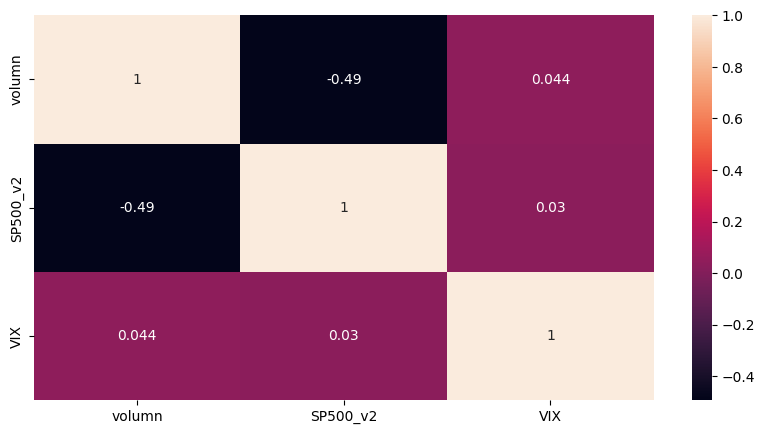

In [ ]:
# Use heatmap to visualize the correlation between mean features
corr = df_control.corr()
plt.figure(figsize=(10,5))
# annot=True, visualize the data inside each block
sns.heatmap(corr, annot=True)
plt.show()

### Bitcoin

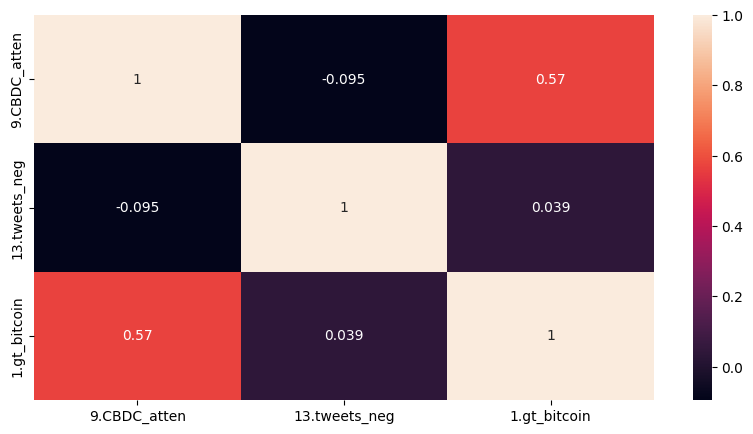

In [ ]:
# Use heatmap to visualize the correlation between senti features
btc_features = ['9.CBDC_atten', '13.tweets_neg', '1.gt_bitcoin',]
corr = df_senti[btc_features].corr()
plt.figure(figsize=(10,5))
# annot=True, visualize the data inside each block
sns.heatmap(corr, annot=True)
plt.show()

In [ ]:
df_bitcoin, btc_features = create_final_df(2,btc_features)
df_bitcoin['directionality'] = df_bitcoin['directionality'].astype(int)
df_bitcoin.head()
print(btc_features)

['9.CBDC_atten', '13.tweets_neg', '1.gt_bitcoin', 'volumn', 'SP500_v2', 'VIX']


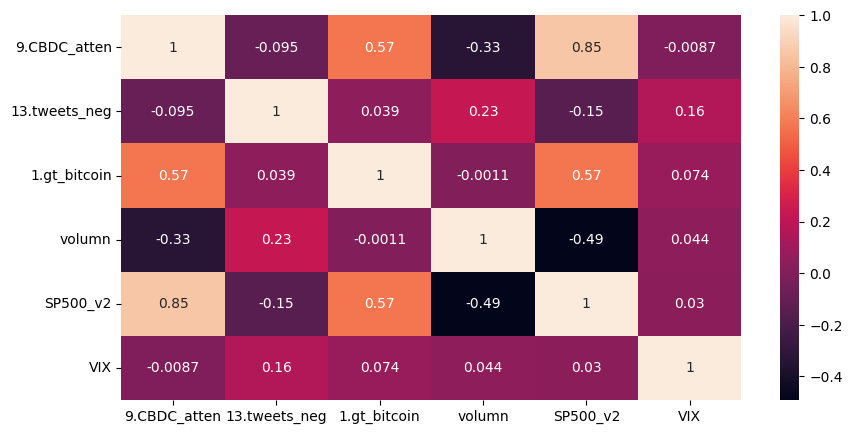

In [ ]:
# Use heatmap to visualize the correlation between senti features
corr = df_bitcoin[btc_features].corr()
plt.figure(figsize=(10,5))
# annot=True, visualize the data inside each block
sns.heatmap(corr, annot=True)
plt.show()

In [ ]:
btc_features.remove('SP500_v2')
print(btc_features)

['9.CBDC_atten', '13.tweets_neg', '1.gt_bitcoin', 'volumn', 'VIX']


Accuracy:  0.5580736543909348 c:  0.2


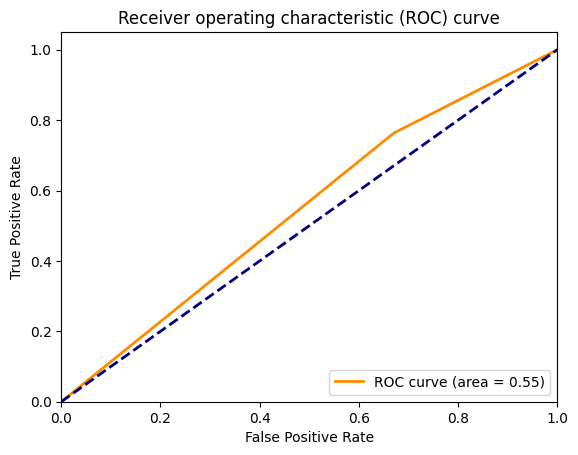

Accuracy:  0.5354107648725213 c:  0.3


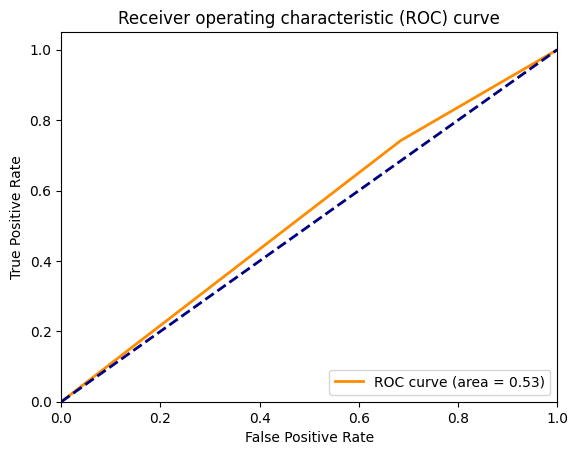

Accuracy:  0.546742209631728 c:  0.4


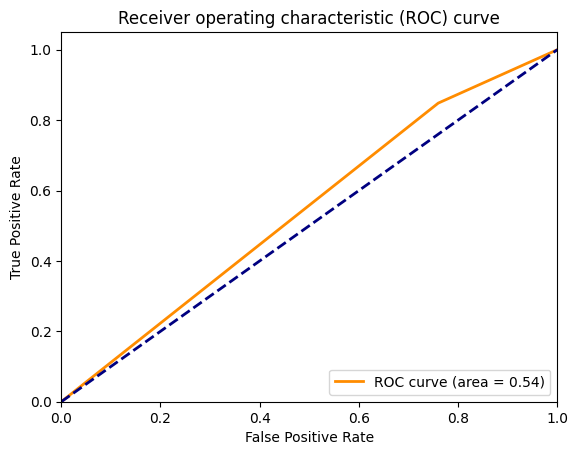

Accuracy:  0.5070821529745042 c:  0.5


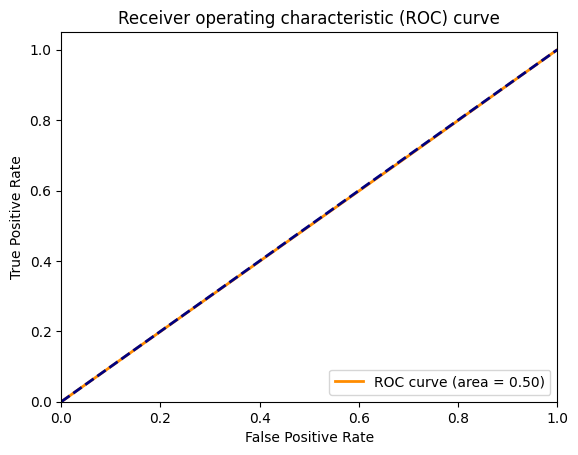

Accuracy:  0.5580736543909348 c:  0.6


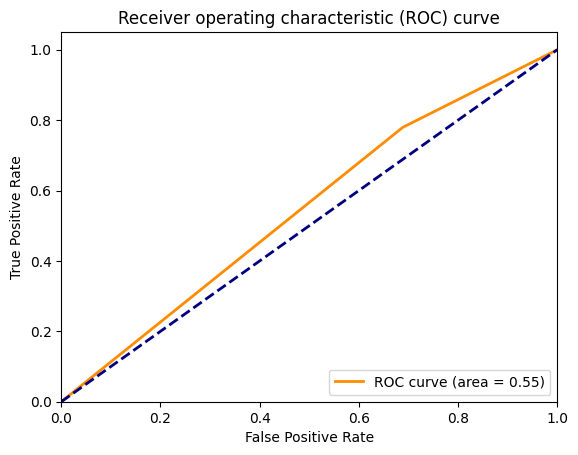

Accuracy:  0.5552407932011332 c:  0.7


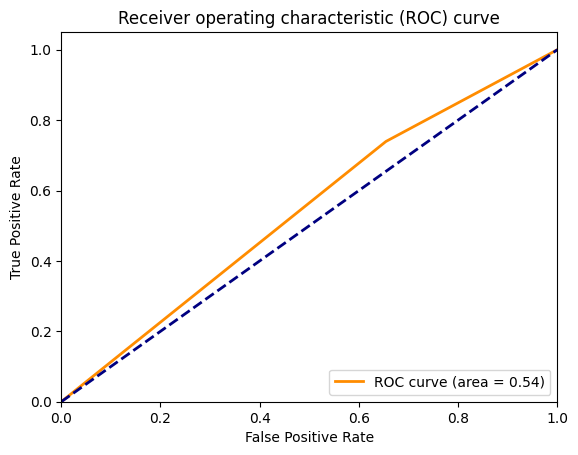

Accuracy:  0.5240793201133145 c:  0.8


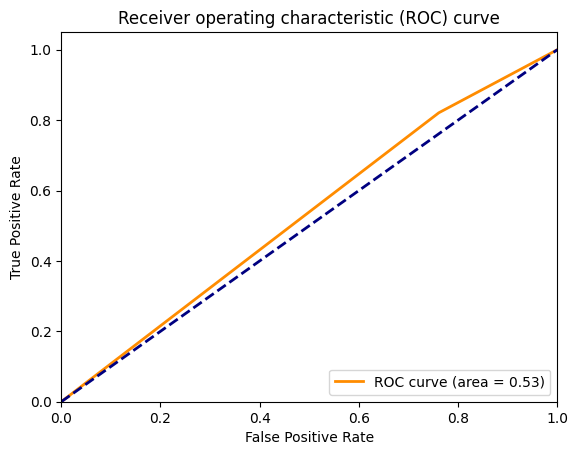

Accuracy:  0.5552407932011332 c:  0.9


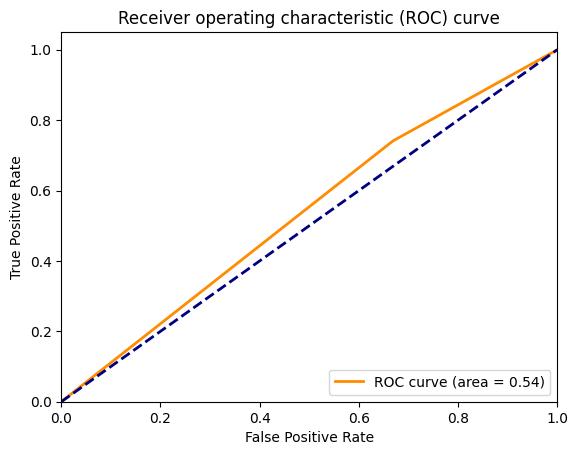

Accuracy:  0.5155807365439093 c:  1.0


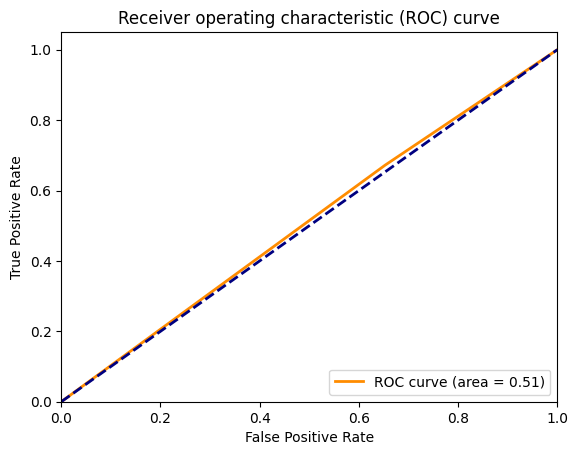

Accuracy:  0.5269121813031161 c:  1.1


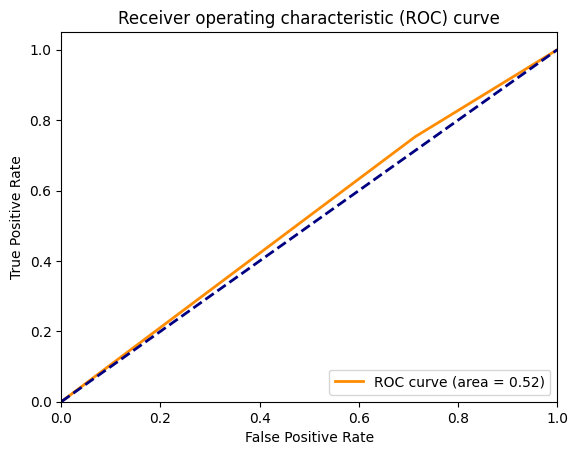

Accuracy:  0.5892351274787535 c:  1.2


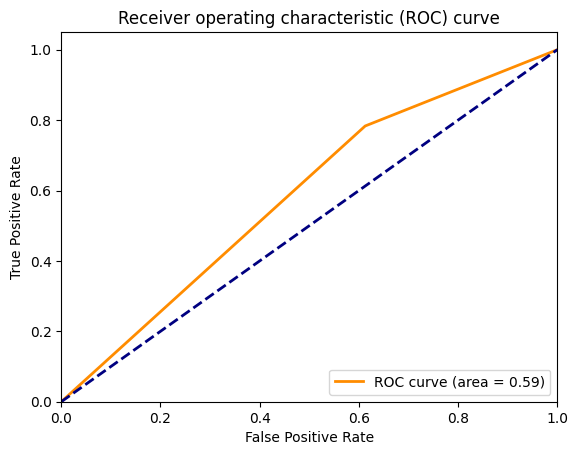

In [ ]:
for c in [0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0,1.1,1.2]:
  SVM_on_coin(df_bitcoin,btc_features, c)

### Ether

In [ ]:
print(df_senti.columns.to_list())

['13.tweets_neg', '1.gt_bitcoin', '10.news_senti', '12.tweets_pos', '14.twitter_btccrash_pos', '2.gt_Buy_Bitcoin', '7.s&p_twitter', '8.CBDC_uncertainty', '15.twitter_btccrash_neg', '6.gt_covid', '5.gt_Ukraine_war', '9.CBDC_atten', '3.gt_Sell_Bitcoin', '4.gt_ethereum', '11.fear&greed']


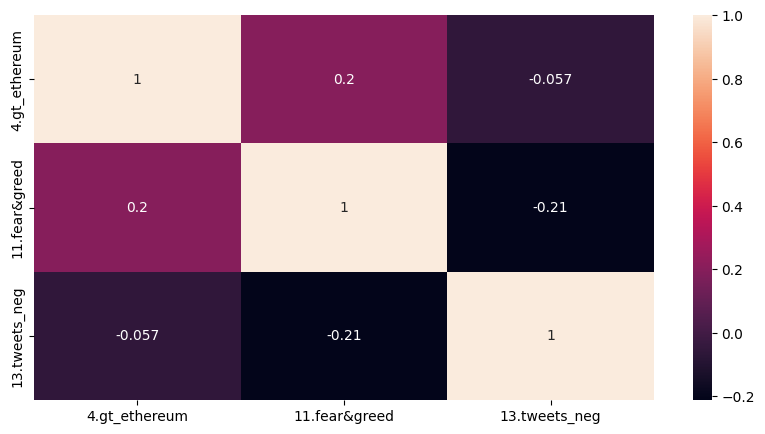

In [ ]:
# Use heatmap to visualize the correlation between senti features
ether_features = ['4.gt_ethereum',  '11.fear&greed', '13.tweets_neg',]
corr = df_senti[ether_features].corr()
plt.figure(figsize=(10,5))
# annot=True, visualize the data inside each block
sns.heatmap(corr, annot=True)
plt.show()

In [ ]:
df_ether, ether_features = create_final_df(3,ether_features)
df_ether['directionality'] = df_ether['directionality'].astype(int)
df_ether.head()
print(ether_features)

['4.gt_ethereum', '11.fear&greed', '13.tweets_neg', 'volumn', 'SP500_v2', 'VIX']


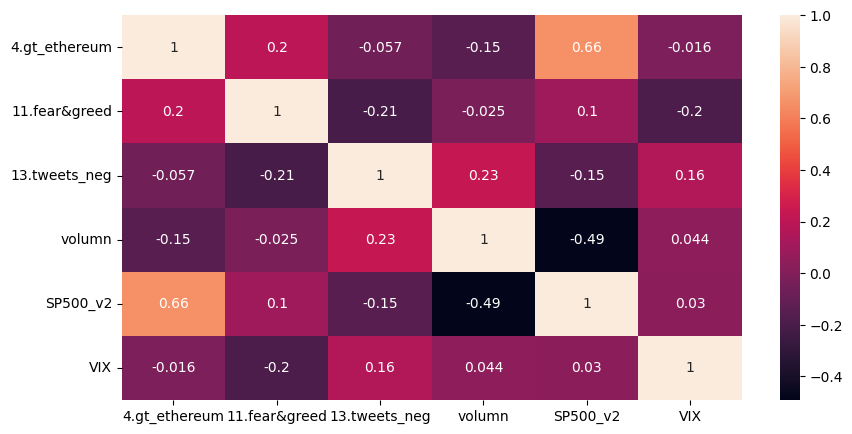

In [ ]:
# Use heatmap to visualize the correlation between features
corr = df_ether[ether_features].corr()
plt.figure(figsize=(10,5))
# annot=True, visualize the data inside each block
sns.heatmap(corr, annot=True)
plt.show()

Accuracy:  0.5552407932011332 c:  0.2


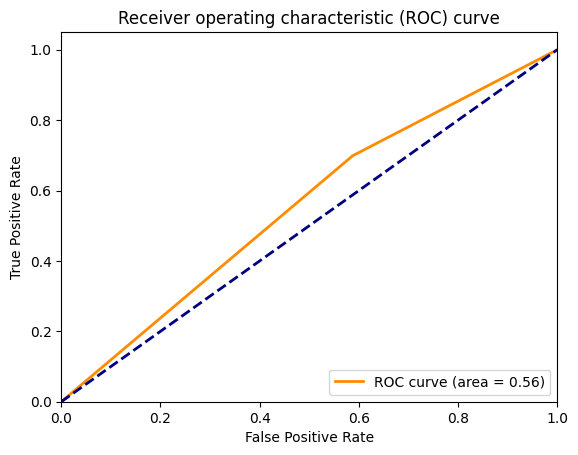

Accuracy:  0.5382436260623229 c:  0.3


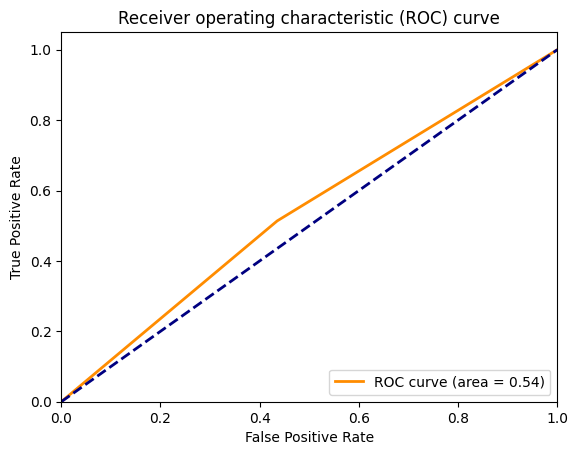

Accuracy:  0.5722379603399433 c:  0.4


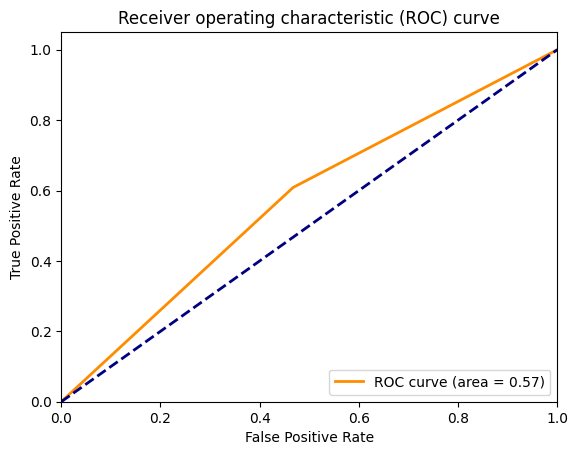

Accuracy:  0.5127478753541076 c:  0.5


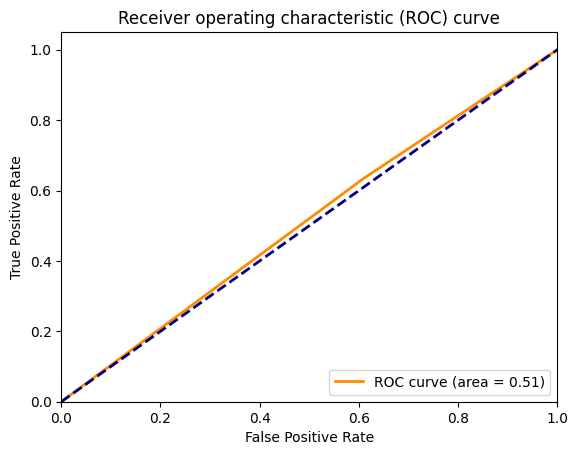

Accuracy:  0.5439093484419264 c:  0.6


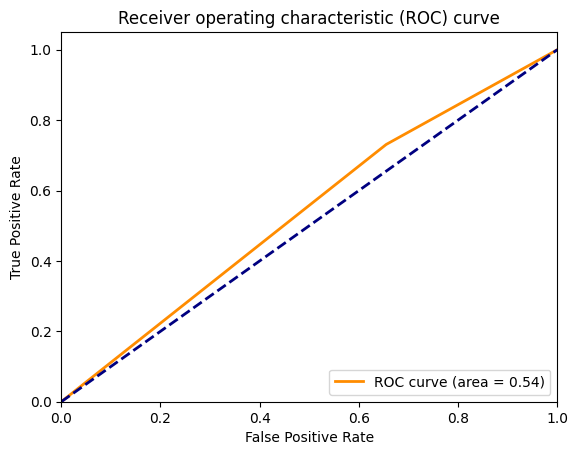

Accuracy:  0.5835694050991501 c:  0.7


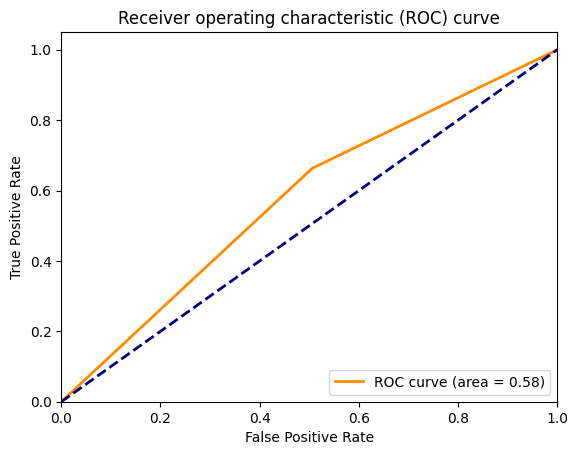

Accuracy:  0.49291784702549574 c:  0.8


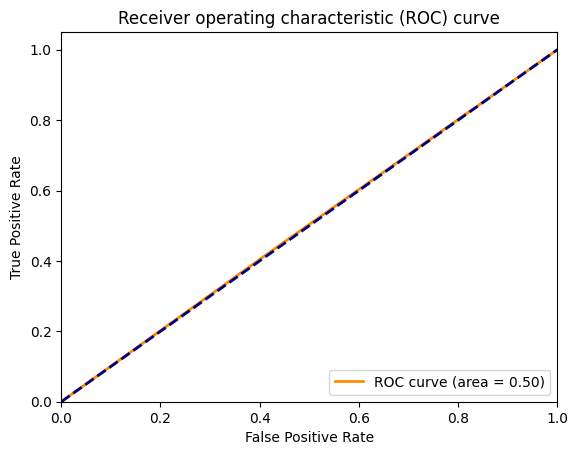

Accuracy:  0.5439093484419264 c:  0.9


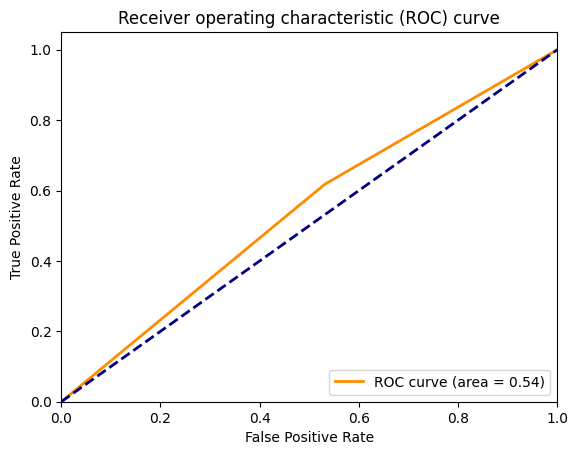

Accuracy:  0.546742209631728 c:  1.0


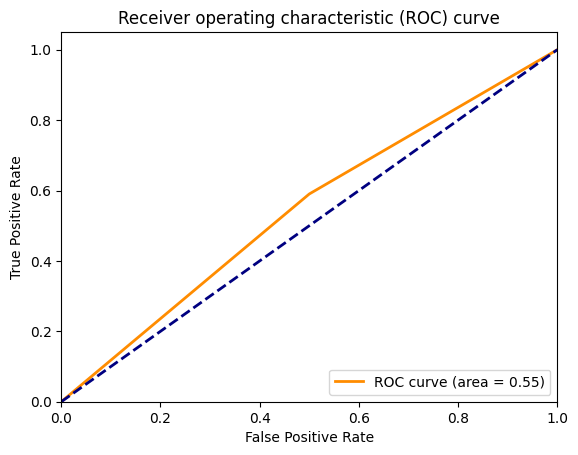

Accuracy:  0.5807365439093485 c:  1.1


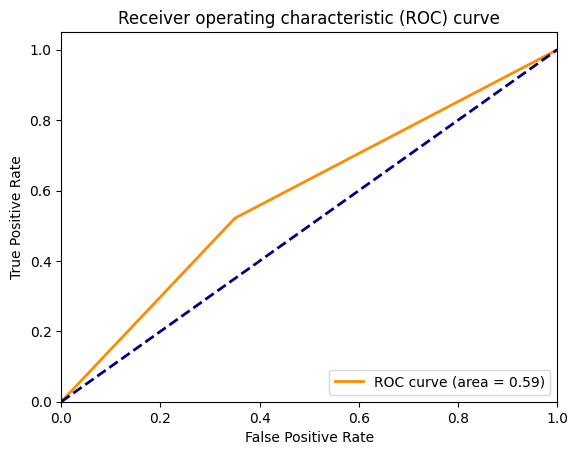

Accuracy:  0.5750708215297451 c:  1.2


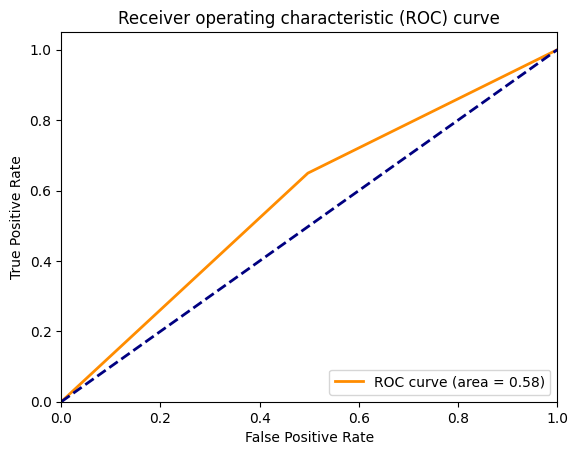

In [ ]:
for c in [0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0,1.1,1.2]:
  SVM_on_coin(df_ether,ether_features, c)

### SP_BDM

In [ ]:
print(df_senti.columns.to_list())

['13.tweets_neg', '1.gt_bitcoin', '10.news_senti', '12.tweets_pos', '14.twitter_btccrash_pos', '2.gt_Buy_Bitcoin', '7.s&p_twitter', '8.CBDC_uncertainty', '15.twitter_btccrash_neg', '6.gt_covid', '5.gt_Ukraine_war', '9.CBDC_atten', '3.gt_Sell_Bitcoin', '4.gt_ethereum', '11.fear&greed']


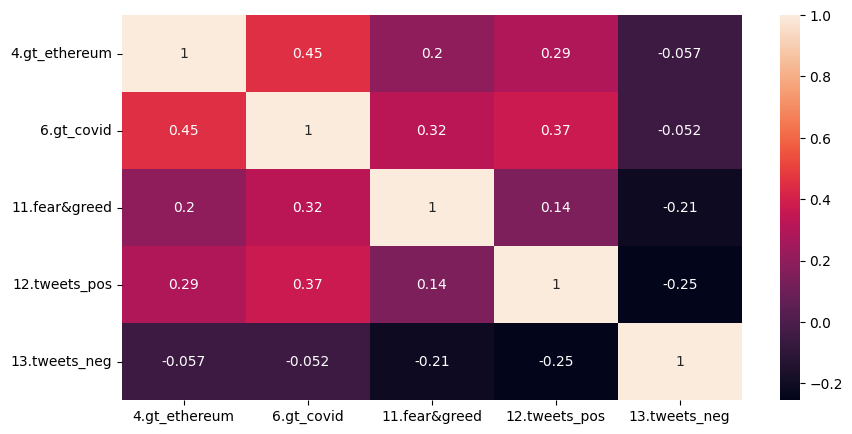

In [ ]:
# Use heatmap to visualize the correlation between senti features
bdm_features = ['4.gt_ethereum', '6.gt_covid', '11.fear&greed', '12.tweets_pos', '13.tweets_neg',]
corr = df_senti[bdm_features].corr()
plt.figure(figsize=(10,5))
# annot=True, visualize the data inside each block
sns.heatmap(corr, annot=True)
plt.show()

In [ ]:
df = pd.read_csv(coin_list[0])
df

,date,price,return,volatility,change_in_volatility,directionality
0,2018-03-01,1352.010000,NaN,NaN,NaN,NaN
1,2018-03-02,1335.400000,-0.012285,NaN,NaN,0.0
2,2018-03-03,1346.196667,0.008085,NaN,NaN,1.0
3,2018-03-04,1356.993333,0.008020,NaN,NaN,1.0
4,2018-03-05,1367.790000,0.007956,NaN,NaN,1.0
...,...,...,...,...,...,...
1761,2022-12-26,1387.340000,0.000171,0.015792,-0.001823,1.0
1762,2022-12-27,1375.440000,-0.008578,0.015831,0.002444,0.0
1763,2022-12-28,1361.700000,-0.009990,0.015894,0.004024,0.0
1764,2022-12-29,1358.110000,-0.002636,0.015385,-0.032024,0.0


In [ ]:
df_bdm, bdm_features = create_final_df(0,bdm_features)
df_bdm['directionality'] = df_bdm['directionality'].astype(int)

In [ ]:
print(bdm_features)

['4.gt_ethereum', '6.gt_covid', '11.fear&greed', '12.tweets_pos', '13.tweets_neg', 'volumn', 'SP500_v2', 'VIX']


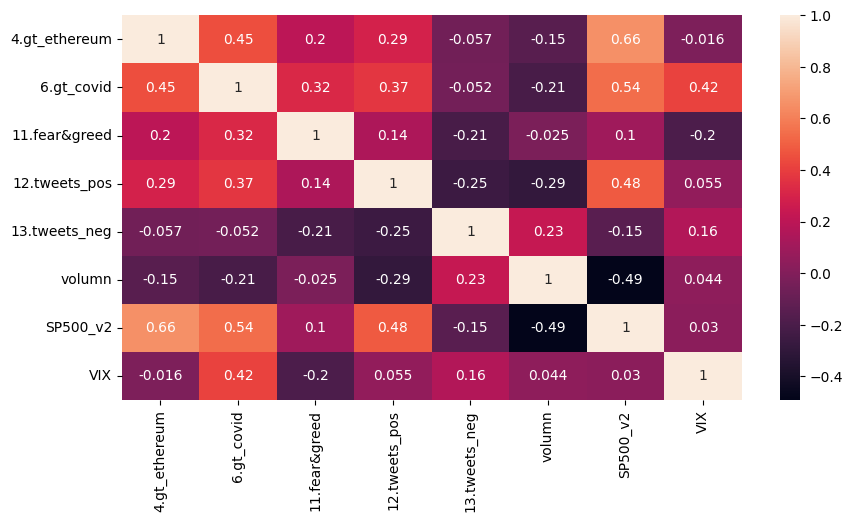

In [ ]:
# Use heatmap to visualize the correlation between features
corr = df_bdm[bdm_features].corr()
plt.figure(figsize=(10,5))
# annot=True, visualize the data inside each block
sns.heatmap(corr, annot=True)
plt.show()

In [ ]:
bdm_features.remove('SP500_v2')

Accuracy:  0.5722379603399433 c:  0.2


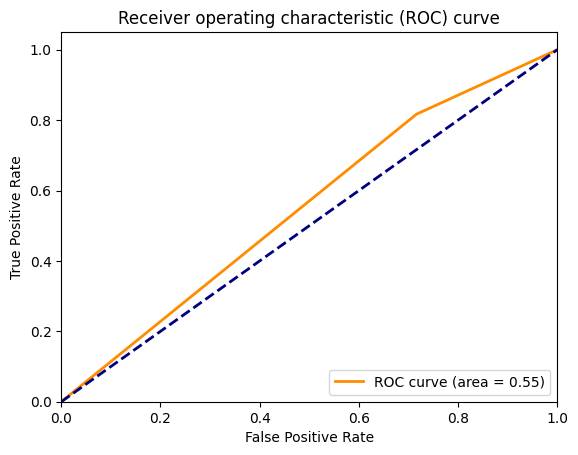

Accuracy:  0.5694050991501416 c:  0.3


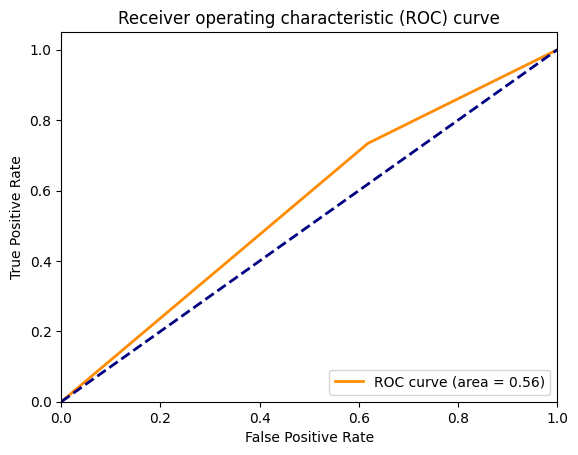

Accuracy:  0.5694050991501416 c:  0.4


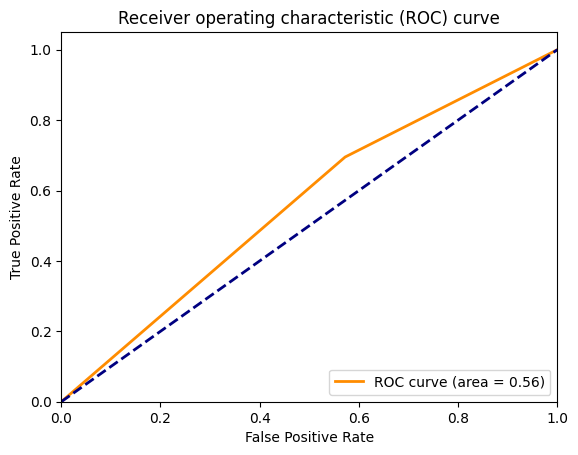

Accuracy:  0.5779036827195467 c:  0.5


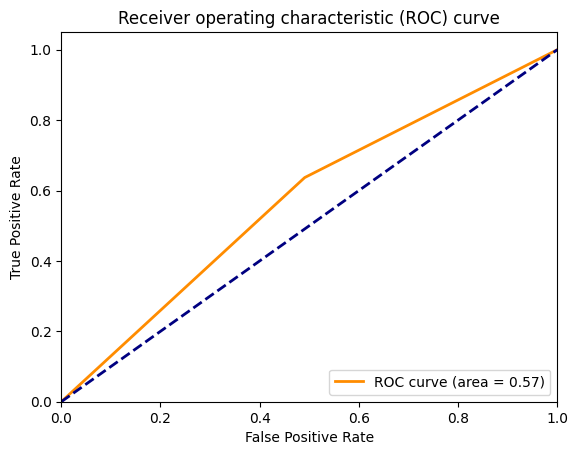

Accuracy:  0.5609065155807366 c:  0.6


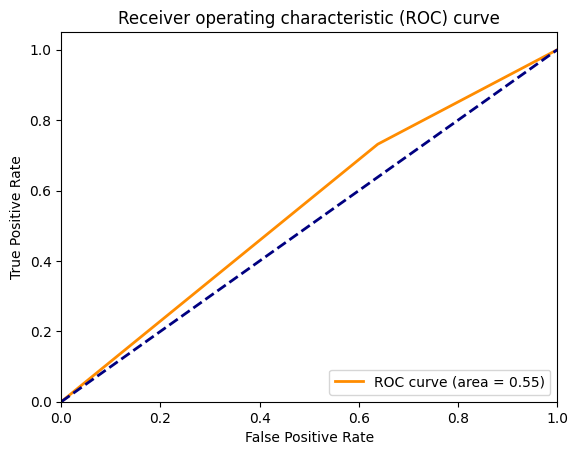

Accuracy:  0.5892351274787535 c:  0.7


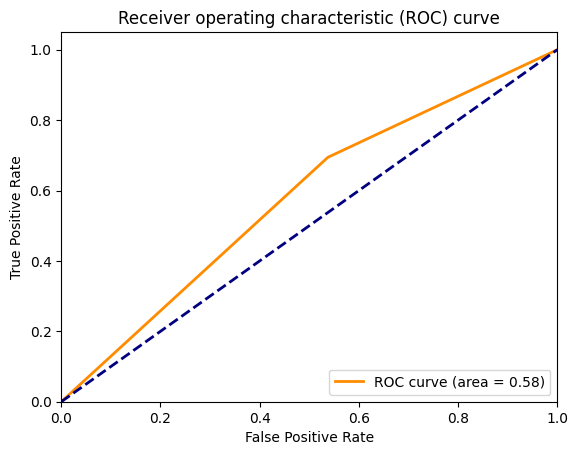

Accuracy:  0.5240793201133145 c:  0.8


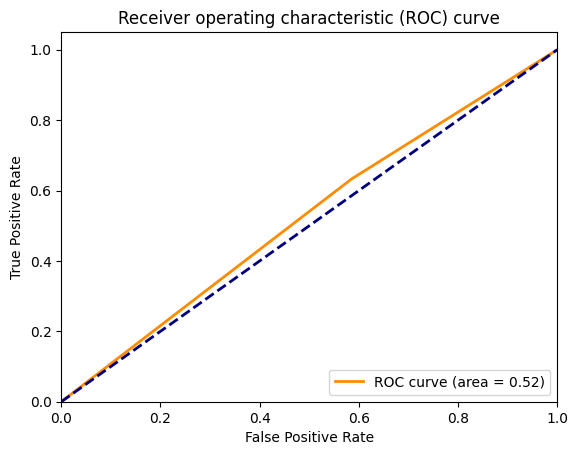

Accuracy:  0.56657223796034 c:  0.9


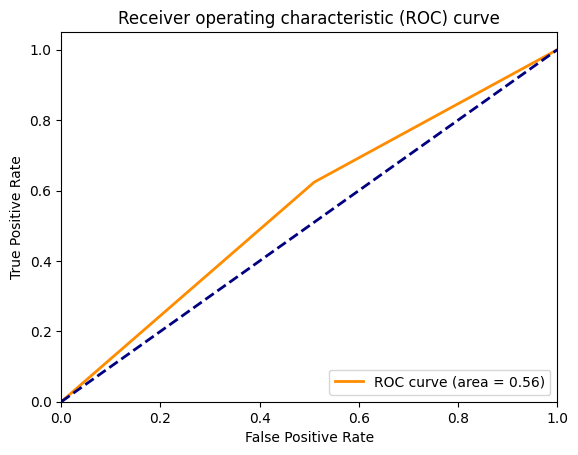

Accuracy:  0.56657223796034 c:  1.0


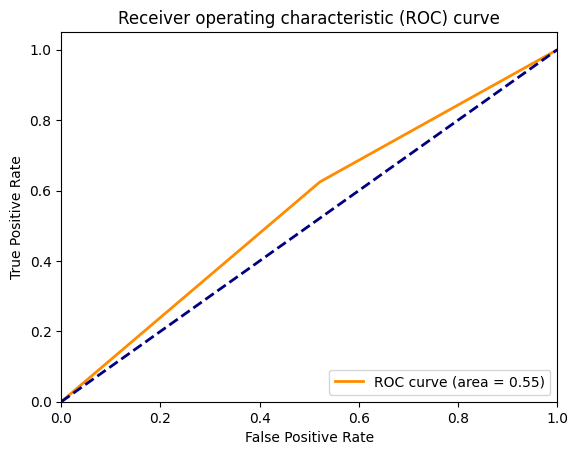

Accuracy:  0.5835694050991501 c:  1.1


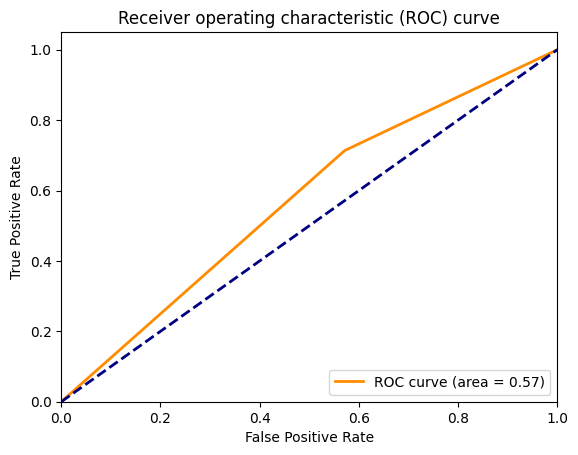

Accuracy:  0.5524079320113314 c:  1.2


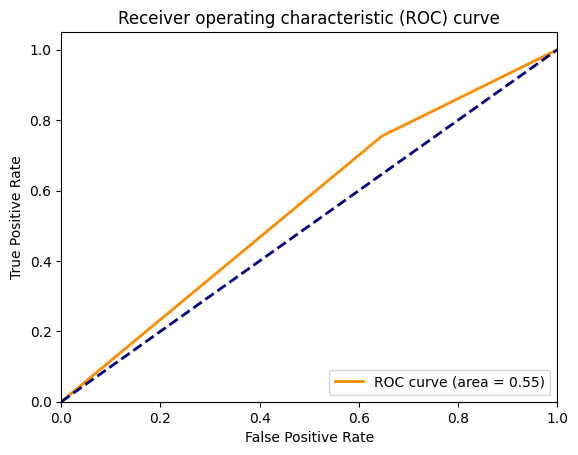

In [ ]:
for c in [0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0,1.1,1.2]:
  SVM_on_coin(df_bdm,bdm_features, c)

### BDM_exlarge

In [ ]:
print(df_senti.columns.to_list())

['13.tweets_neg', '1.gt_bitcoin', '10.news_senti', '12.tweets_pos', '14.twitter_btccrash_pos', '2.gt_Buy_Bitcoin', '7.s&p_twitter', '8.CBDC_uncertainty', '15.twitter_btccrash_neg', '6.gt_covid', '5.gt_Ukraine_war', '9.CBDC_atten', '3.gt_Sell_Bitcoin', '4.gt_ethereum', '11.fear&greed']


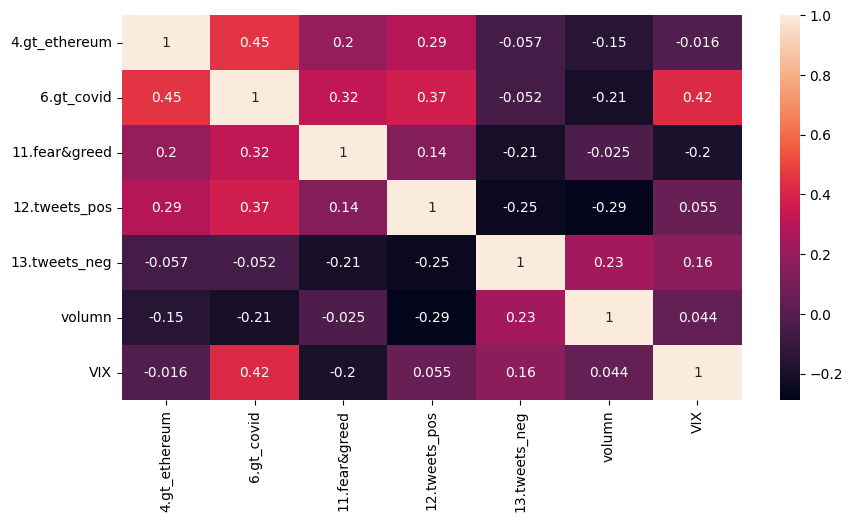

In [ ]:
# ex_large_bdm has the same features as bdm
bdm_ex_large_features = ['4.gt_ethereum', '6.gt_covid', '11.fear&greed', '12.tweets_pos', '13.tweets_neg',]
df_ex_large_bdm, bdm_ex_large_features = create_final_df(1,bdm_ex_large_features)
df_ex_large_bdm['directionality'] = df_ex_large_bdm['directionality'].astype(int)
# Use heatmap to visualize the correlation between features
bdm_ex_large_features.remove('SP500_v2')
corr = df_ex_large_bdm[bdm_ex_large_features].corr()
plt.figure(figsize=(10,5))
# annot=True, visualize the data inside each block
sns.heatmap(corr, annot=True)
plt.show()

Accuracy:  0.5892351274787535 c:  0.2


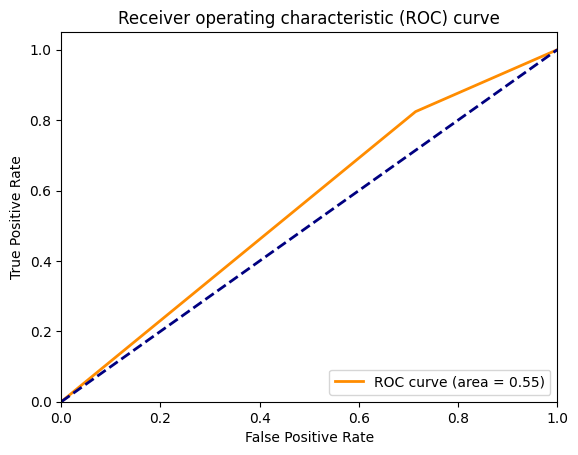

Accuracy:  0.5325779036827195 c:  0.3


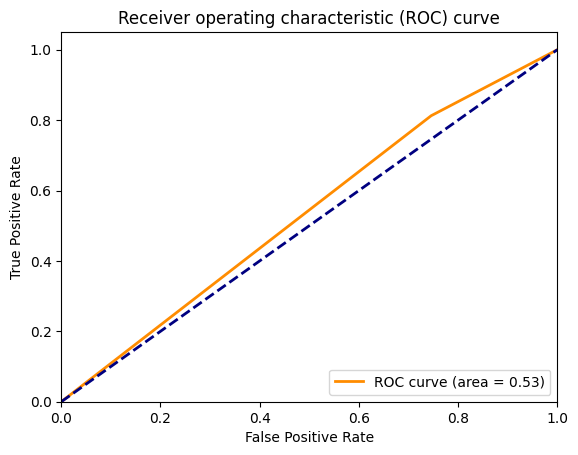

Accuracy:  0.5750708215297451 c:  0.4


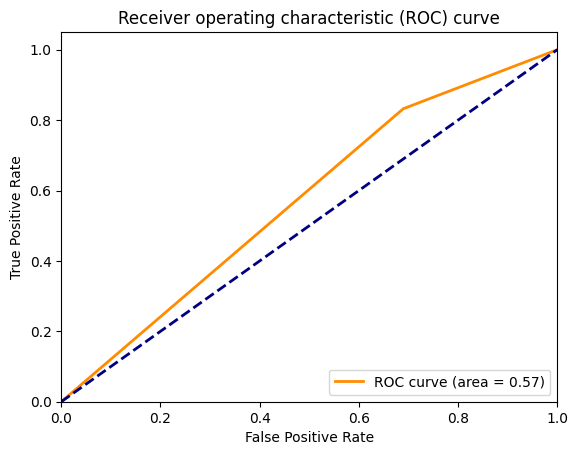

Accuracy:  0.5495750708215298 c:  0.5


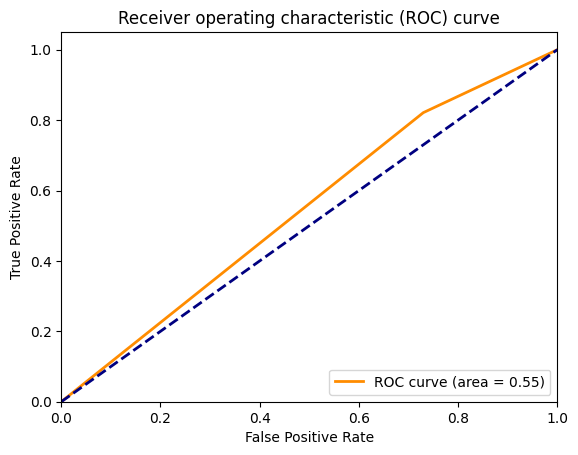

Accuracy:  0.6090651558073654 c:  0.6


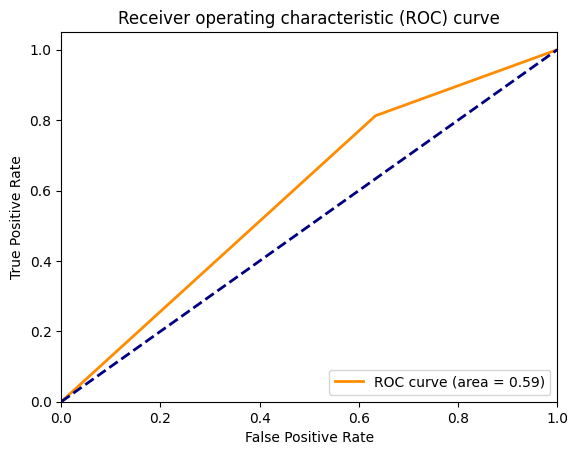

Accuracy:  0.6062322946175638 c:  0.7


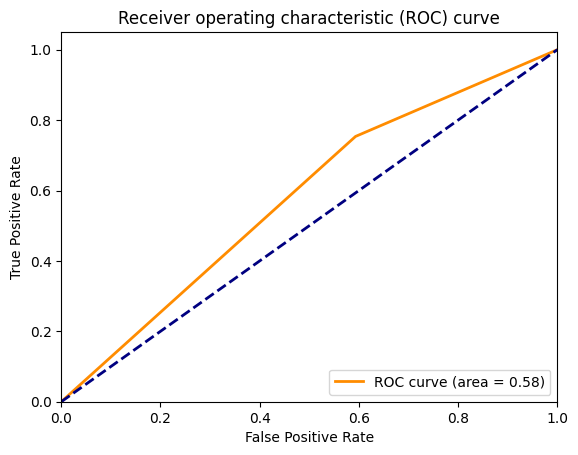

Accuracy:  0.5750708215297451 c:  0.8


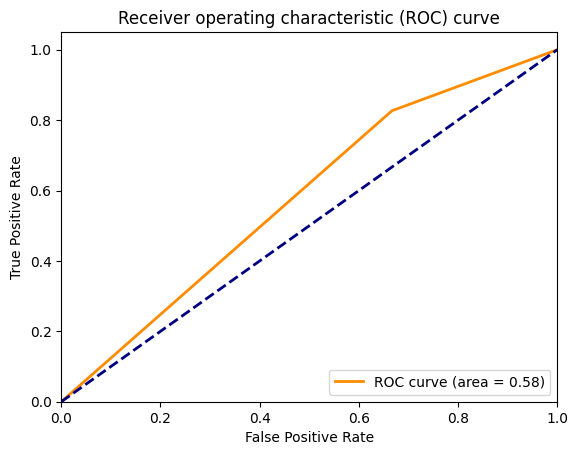

Accuracy:  0.5779036827195467 c:  0.9


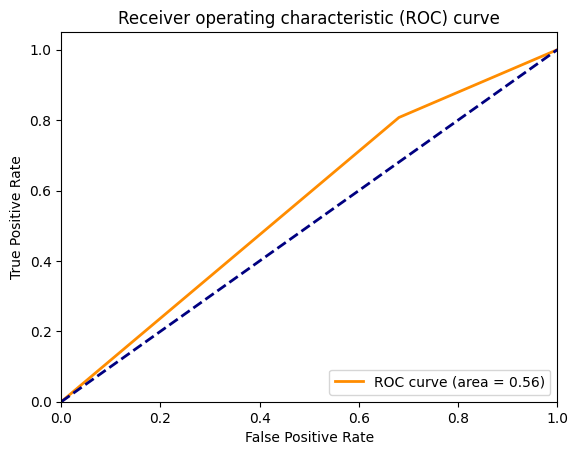

Accuracy:  0.5750708215297451 c:  1.0


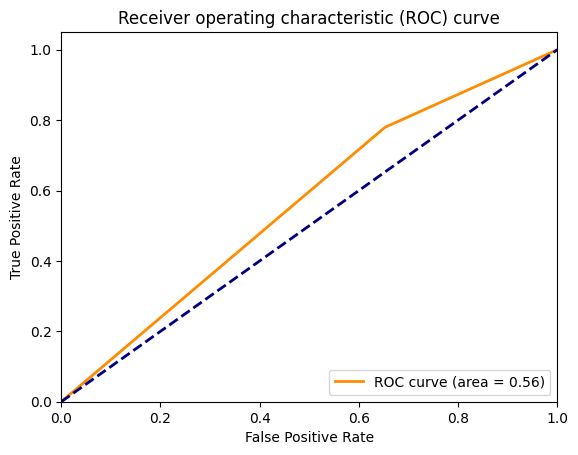

Accuracy:  0.5722379603399433 c:  1.1


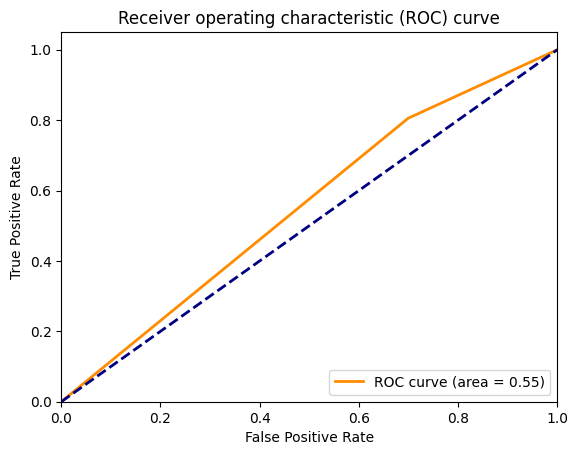

Accuracy:  0.603399433427762 c:  1.2


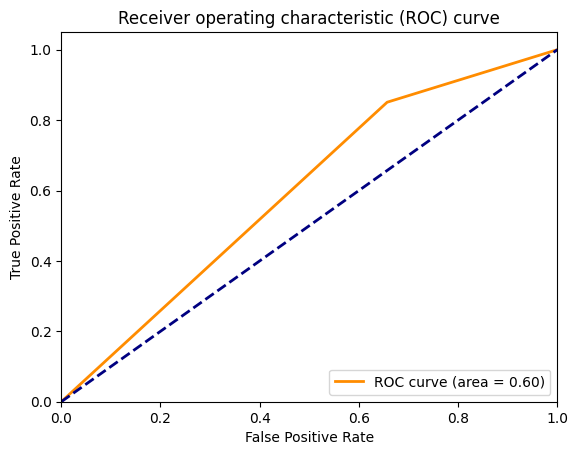

In [ ]:
for c in [0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0,1.1,1.2]:
  SVM_on_coin(df_ex_large_bdm,bdm_ex_large_features, c)

# Return Classification

In [ ]:
df_senti = create_senti_df('return',senti_list)
df_senti.fillna(0, inplace=True)
df_senti.replace([np.inf, -np.inf], 0, inplace=True)
df_senti.head()

,13.tweets_neg,1.gt_bitcoin,10.news_senti,12.tweets_pos,14.twitter_btccrash_pos,2.gt_Buy_Bitcoin,7.s&p_twitter,8.CBDC_uncertainty,15.twitter_btccrash_neg,6.gt_covid,5.gt_Ukraine_war,9.CBDC_atten,3.gt_Sell_Bitcoin,4.gt_ethereum,11.fear&greed
date,,,,,,,,,,,,,,,
2018-03-01,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000
2018-03-02,0.514869,-0.004854,-0.095687,-0.113559,-0.138386,0.000000,0.006039,0.000949,0.120306,0.0,0.0,0.000321,0.0,-0.011494,0.236842
2018-03-03,-0.234322,-0.004878,-0.097991,0.036830,-0.265998,0.000000,0.003468,-0.000129,0.381993,0.0,0.0,-0.000248,0.0,-0.011628,0.191489
2018-03-04,0.100377,-0.004902,-0.078837,0.063410,0.194764,0.000000,0.003456,-0.000129,-0.005493,0.0,0.0,-0.000248,0.0,-0.011765,-0.214286
2018-03-05,-0.182443,0.019704,-0.079216,-0.097288,-0.223062,-0.007519,0.003445,-0.000129,-0.145083,0.0,0.0,-0.000248,0.0,-0.011905,0.250000


In [ ]:
df_control = create_control_df(control_list, 1)
df_control.fillna(0, inplace=True)
df_control.replace([np.inf, -np.inf], 0, inplace=True)
df_control.head()

,volumn_pct,SP500_v2_pct,Nasdaq_pct,Russell2000_pct,VIX_pct
date,,,,,
2018-03-03,-0.125102,0.003677,0.003345,0.002800,-0.014633
2018-03-04,0.094977,0.003664,0.003334,0.002792,-0.014851
2018-03-05,0.092811,0.003651,0.003323,0.002785,-0.015074
2018-03-06,0.138555,0.002639,0.005634,0.010446,-0.019754
2018-03-07,0.089617,-0.000484,0.003342,0.007893,-0.032680


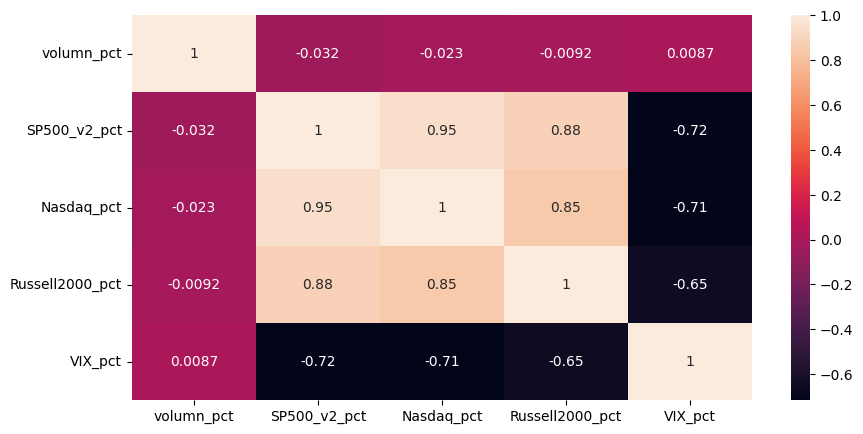

In [ ]:
# Use heatmap to visualize the correlation between mean features
corr = df_control.corr()
plt.figure(figsize=(10,5))
# annot=True, visualize the data inside each block
sns.heatmap(corr, annot=True)
plt.show()

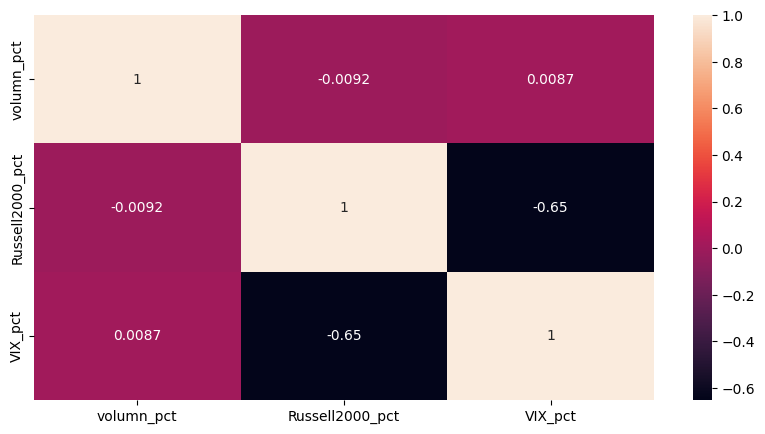

In [ ]:
df_control = df_control[['volumn_pct','Russell2000_pct','VIX_pct']]
corr = df_control.corr()
plt.figure(figsize=(10,5))
# annot=True, visualize the data inside each block
sns.heatmap(corr, annot=True)
plt.show()

### Bitcoin

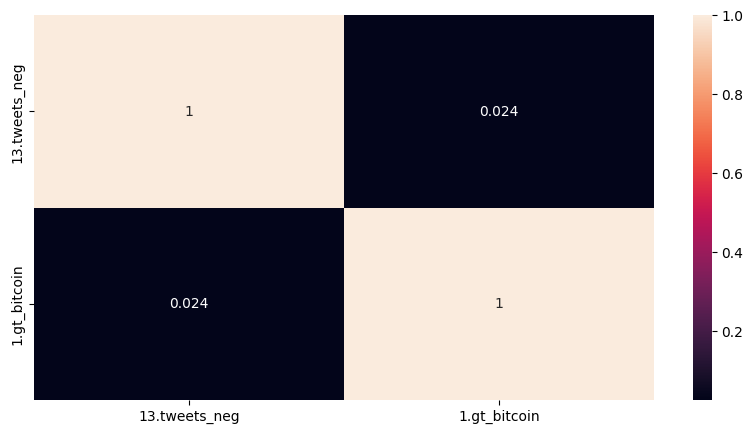

In [ ]:
# Use heatmap to visualize the correlation between senti features
btc_features = ['13.tweets_neg', '1.gt_bitcoin',]
corr = df_senti[btc_features].corr()
plt.figure(figsize=(10,5))
# annot=True, visualize the data inside each block
sns.heatmap(corr, annot=True)
plt.show()

In [ ]:
df_bitcoin, btc_features = create_final_df(2,btc_features)
df_bitcoin['directionality'] = df_bitcoin['directionality'].astype(int)
df_bitcoin.head()
print(btc_features)

['13.tweets_neg', '1.gt_bitcoin', 'volumn_pct', 'Russell2000_pct', 'VIX_pct']


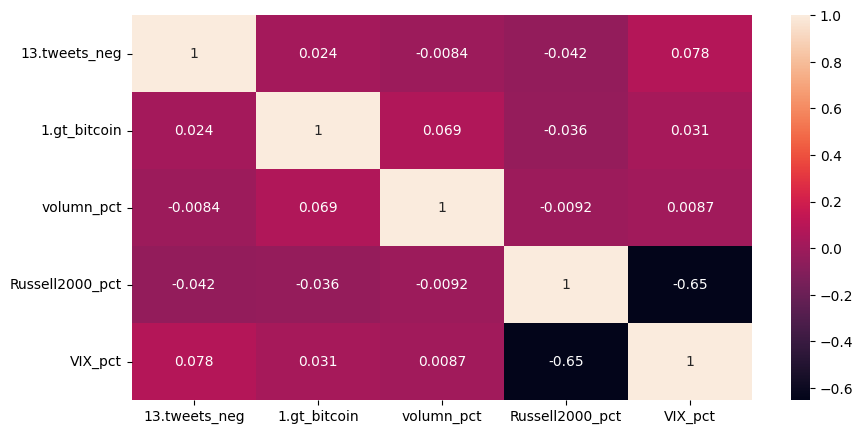

In [ ]:
# Use heatmap to visualize the correlation between senti features
corr = df_bitcoin[btc_features].corr()
plt.figure(figsize=(10,5))
# annot=True, visualize the data inside each block
sns.heatmap(corr, annot=True)
plt.show()

In [ ]:
df_bitcoin.index[:-int(len(df_bitcoin)*0.2)]

DatetimeIndex(['2018-03-03', '2018-03-04', '2018-03-05', '2018-03-06',
               '2018-03-07', '2018-03-08', '2018-03-09', '2018-03-10',
               '2018-03-11', '2018-03-12',
               ...
               '2022-01-03', '2022-01-04', '2022-01-05', '2022-01-06',
               '2022-01-07', '2022-01-08', '2022-01-09', '2022-01-10',
               '2022-01-11', '2022-01-12'],
              dtype='datetime64[ns]', name='date', length=1412, freq=None)

Accuracy:  0.5722379603399433 c:  0.2


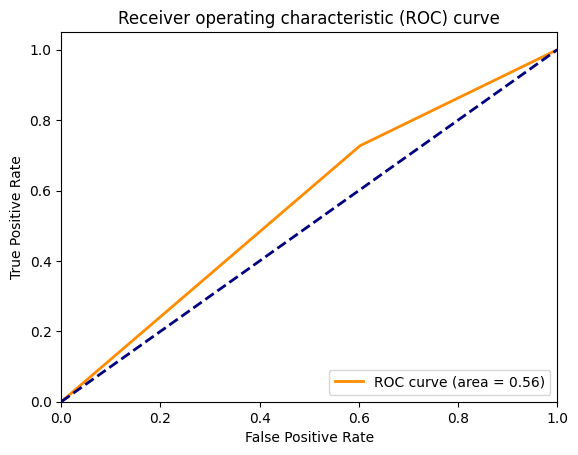

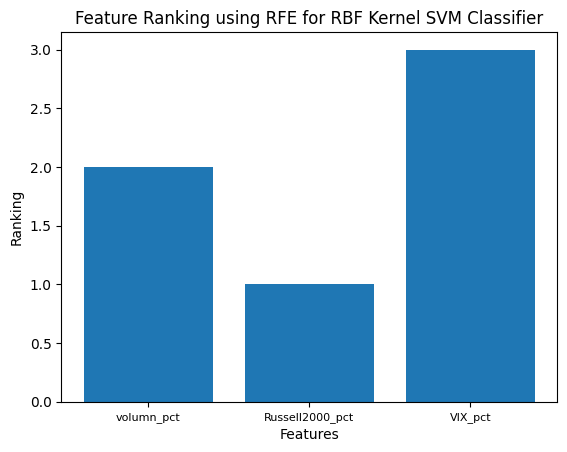

Accuracy:  0.5495750708215298 c:  0.3


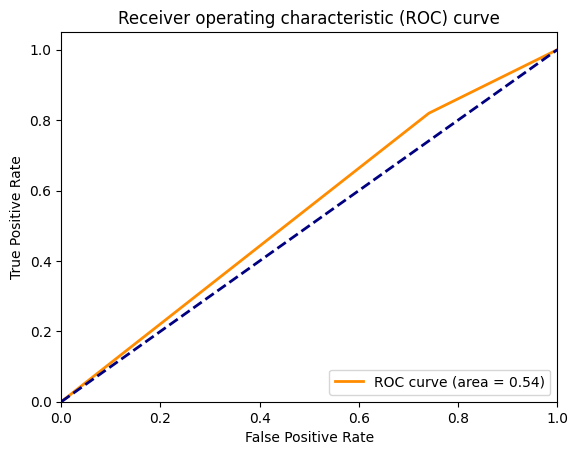

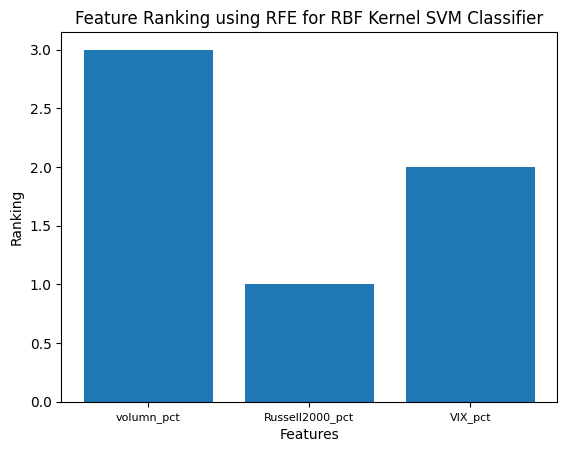

Accuracy:  0.5580736543909348 c:  0.4


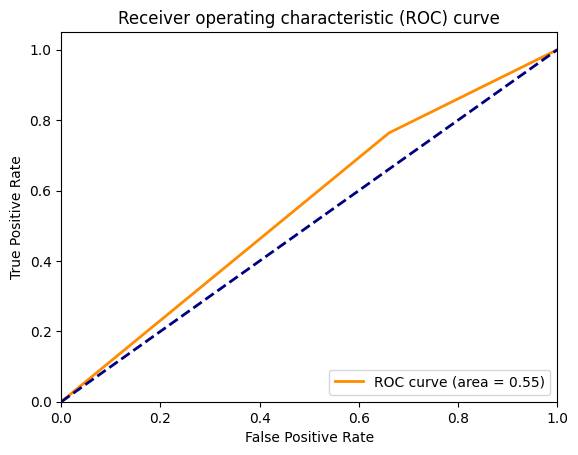

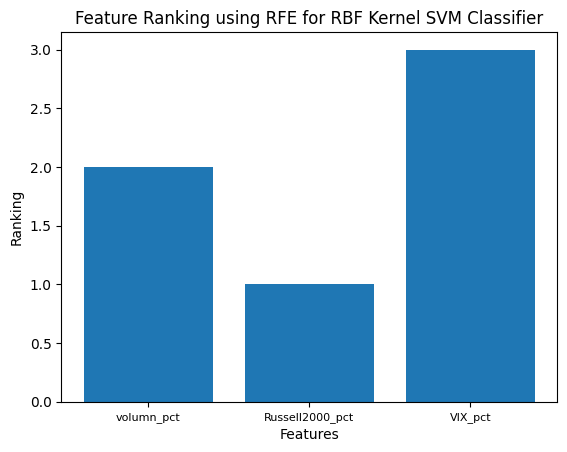

Accuracy:  0.5495750708215298 c:  0.5


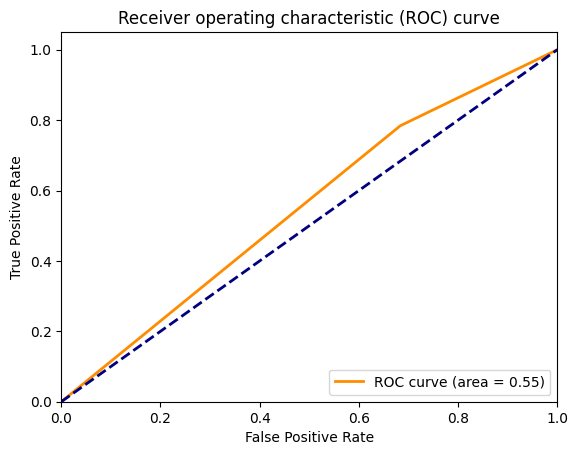

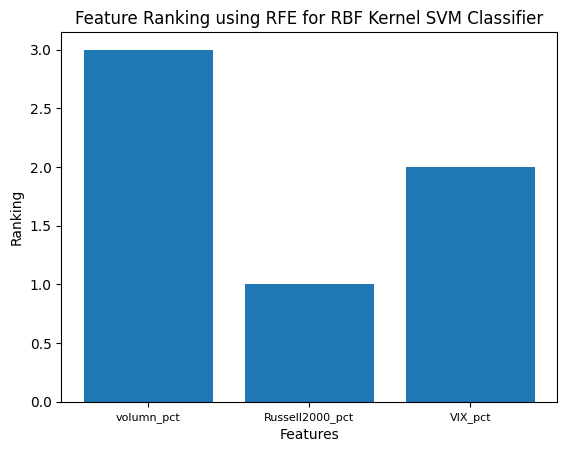

Accuracy:  0.5552407932011332 c:  0.6


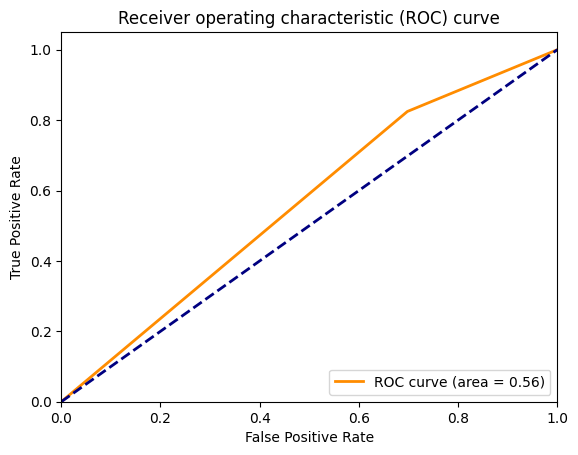

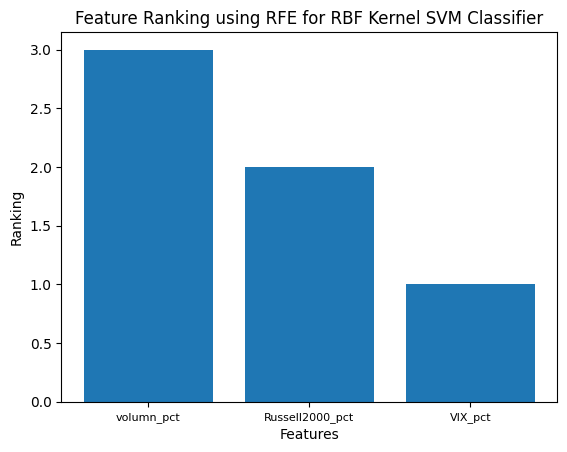

Accuracy:  0.5325779036827195 c:  0.7


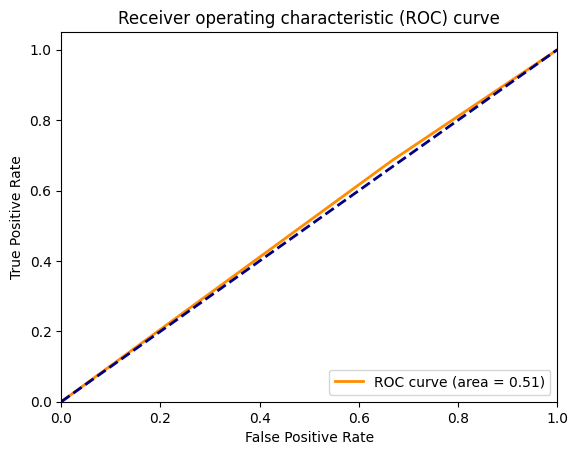

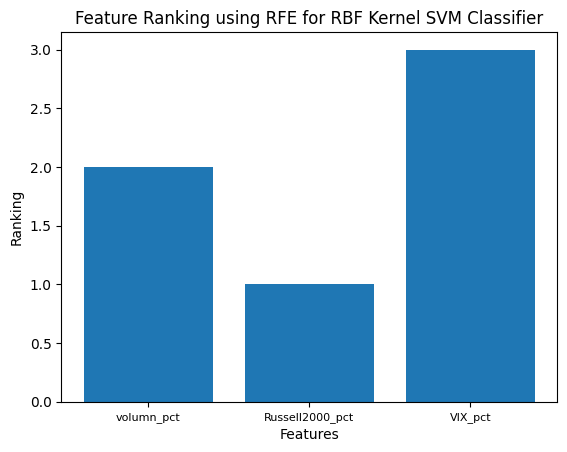

Accuracy:  0.5524079320113314 c:  0.8


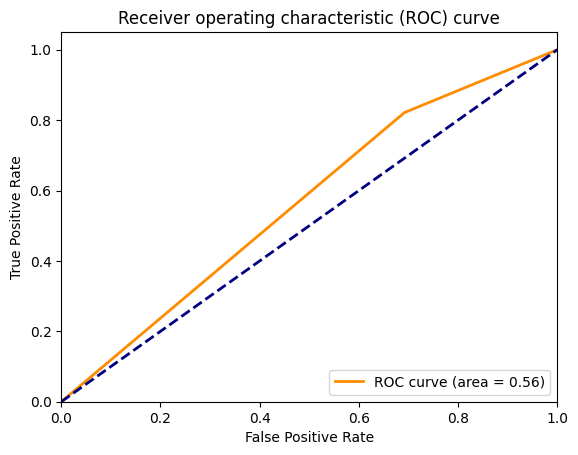

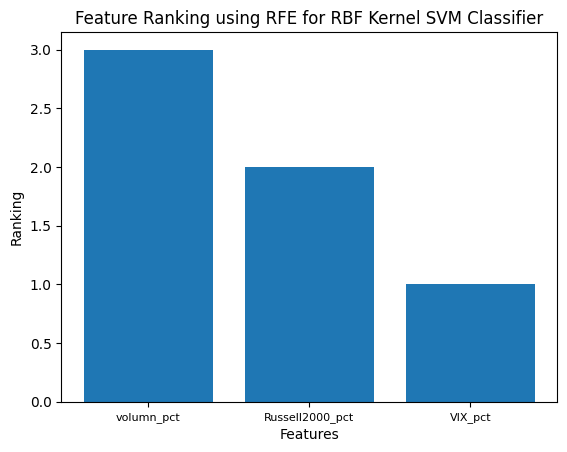

Accuracy:  0.5495750708215298 c:  0.9


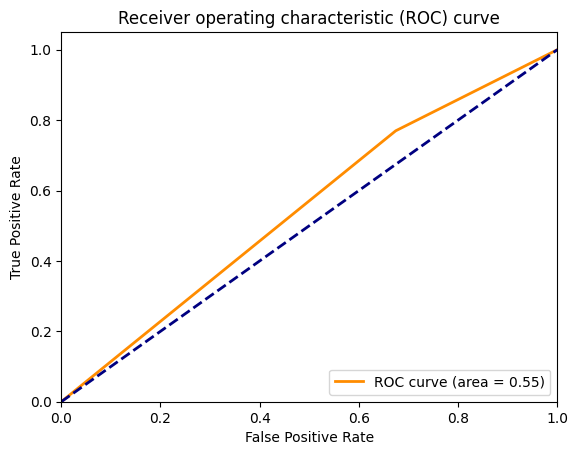

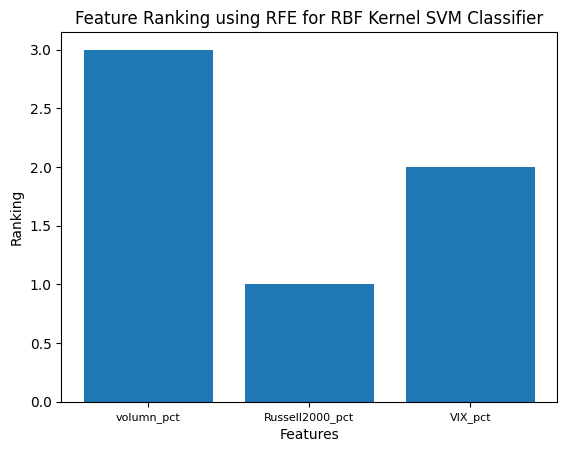

Accuracy:  0.5325779036827195 c:  1.0


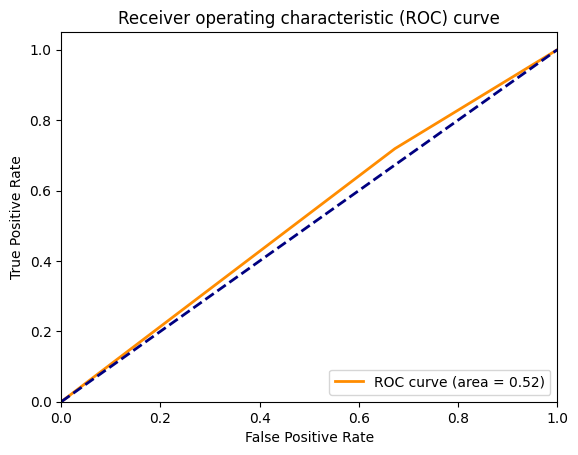

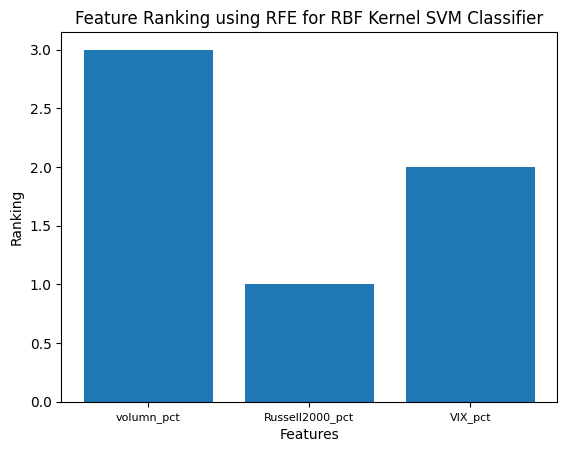

Accuracy:  0.5637393767705382 c:  1.1


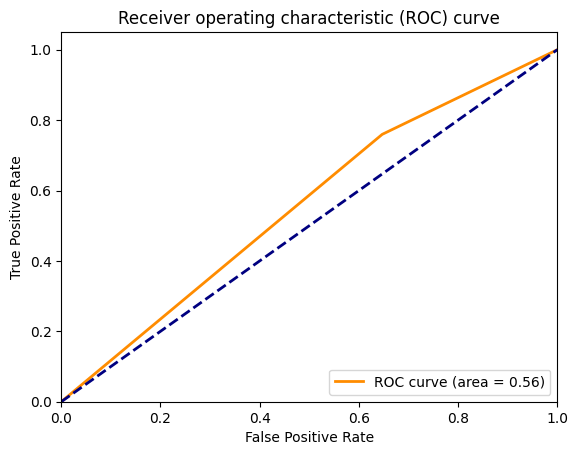

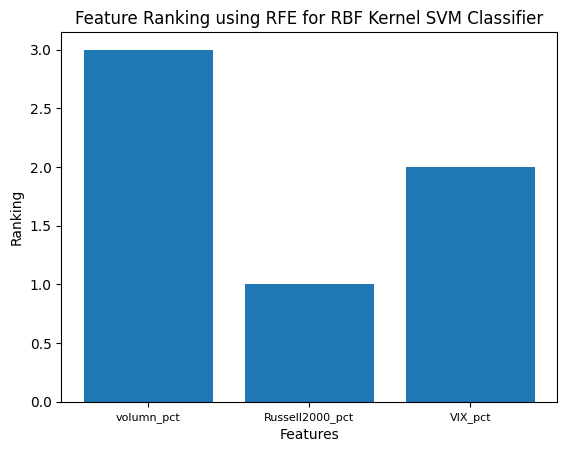

Accuracy:  0.5212464589235127 c:  1.2


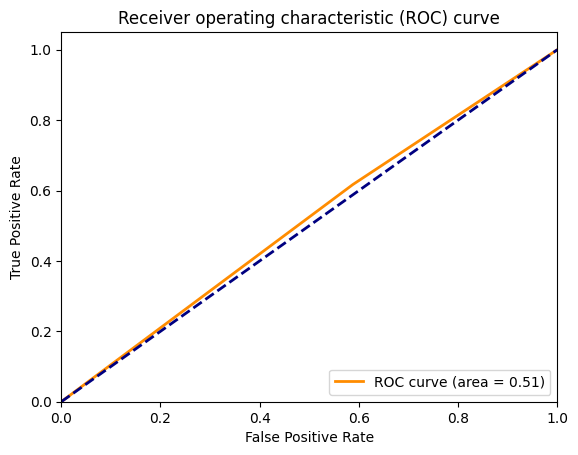

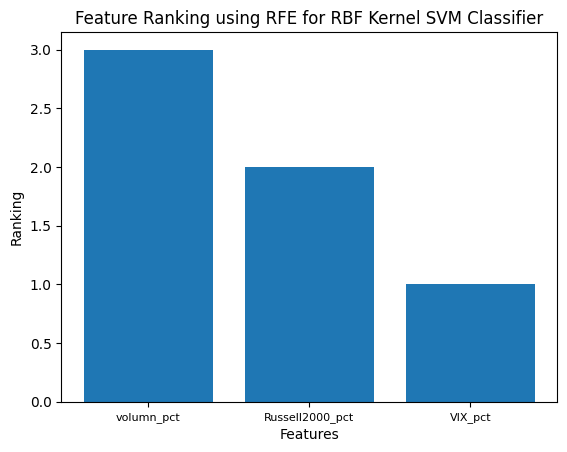

In [ ]:
for c in [0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0,1.1,1.2]:
  SVM_on_coin(df_bitcoin,['volumn_pct','Russell2000_pct','VIX_pct'], c)

Accuracy:  0.5864022662889519 c:  0.2


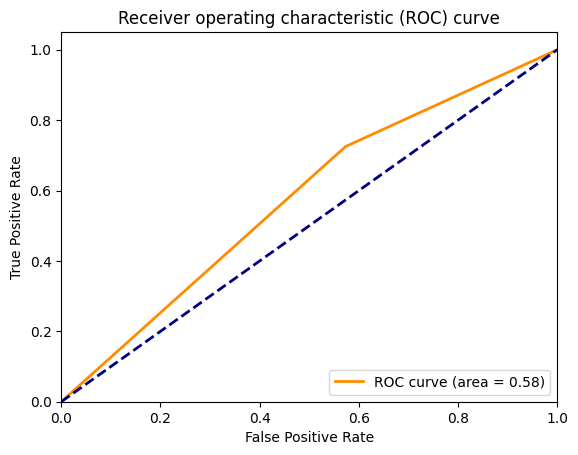

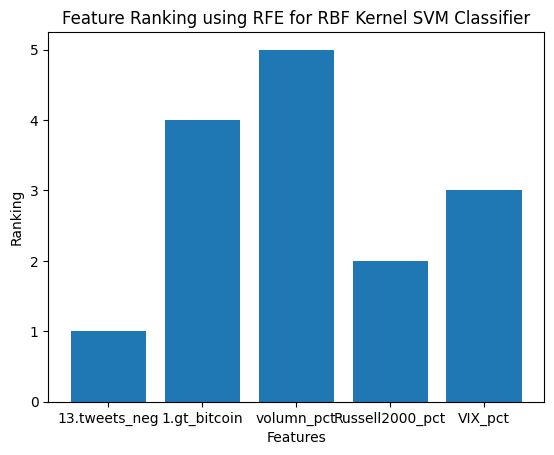

Accuracy:  0.5354107648725213 c:  0.3


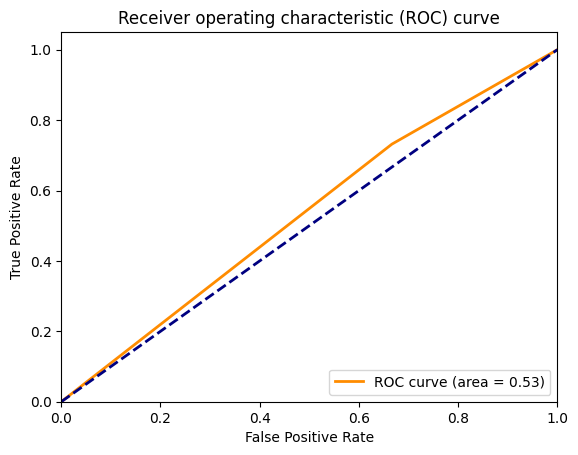

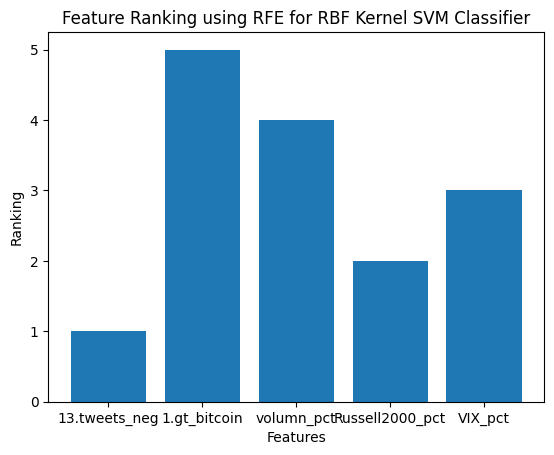

Accuracy:  0.5580736543909348 c:  0.4


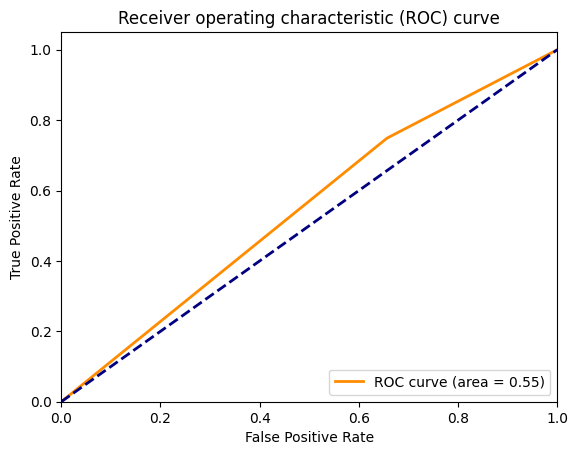

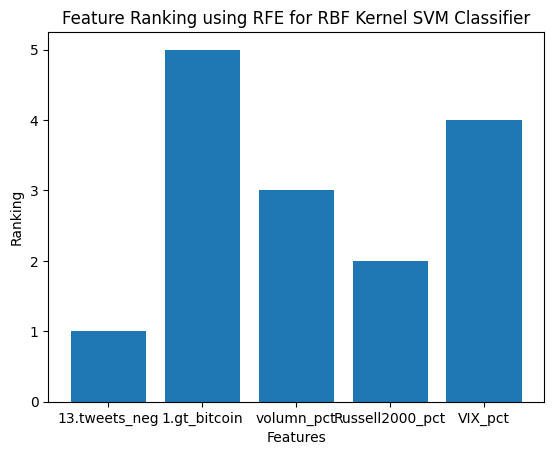

Accuracy:  0.6203966005665722 c:  0.5


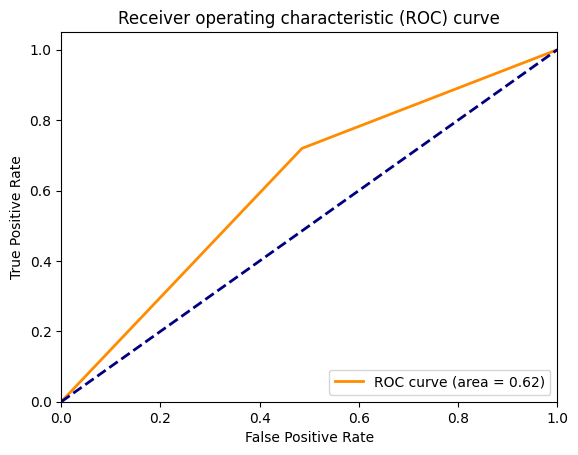

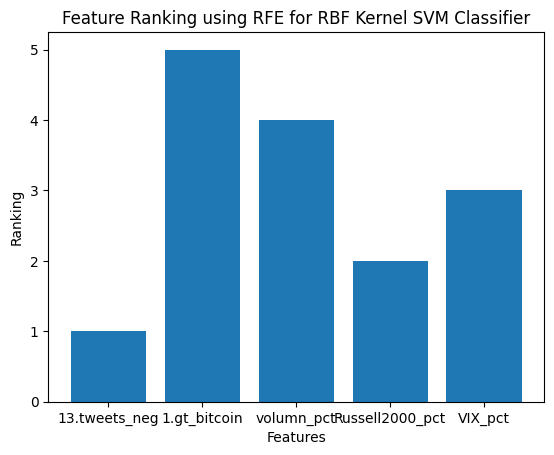

Accuracy:  0.5920679886685553 c:  0.6


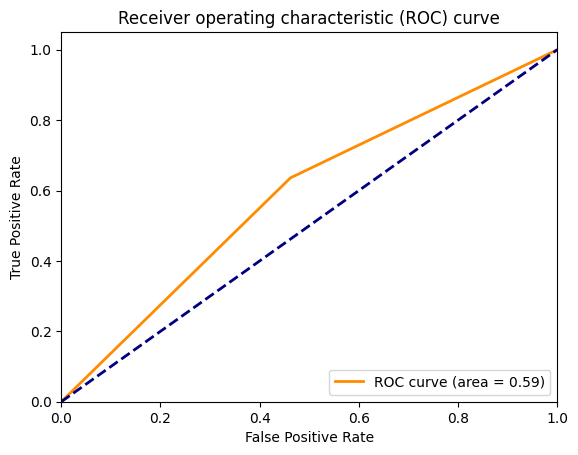

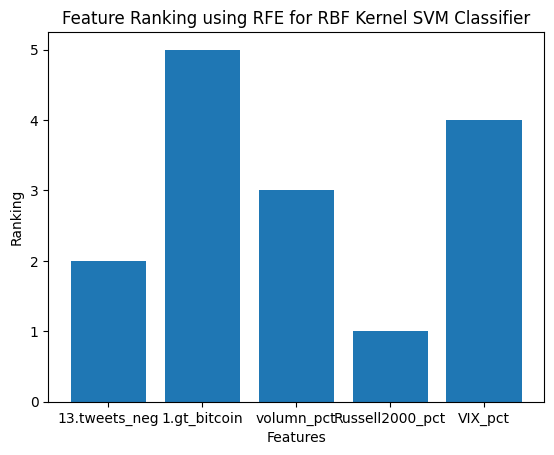

Accuracy:  0.5835694050991501 c:  0.7


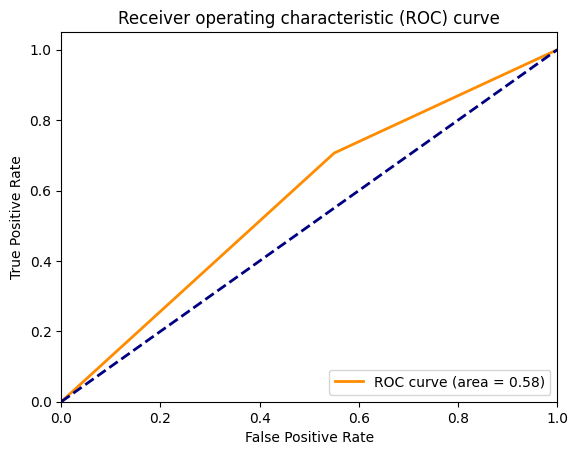

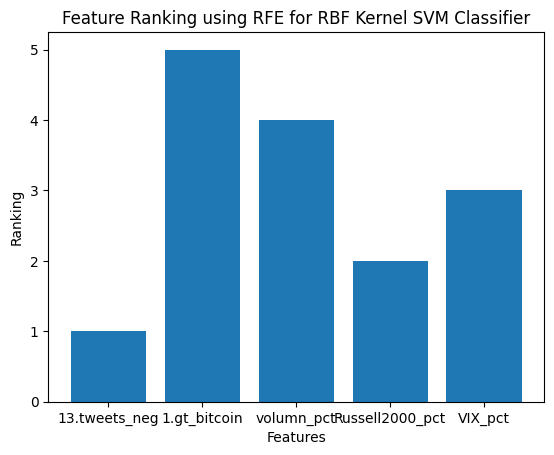

Accuracy:  0.5382436260623229 c:  0.8


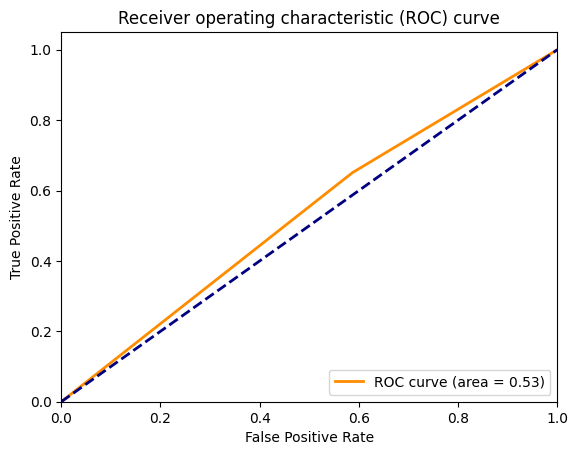

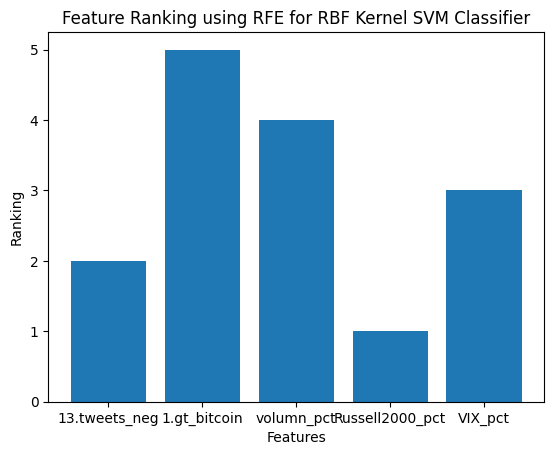

Accuracy:  0.5354107648725213 c:  0.9


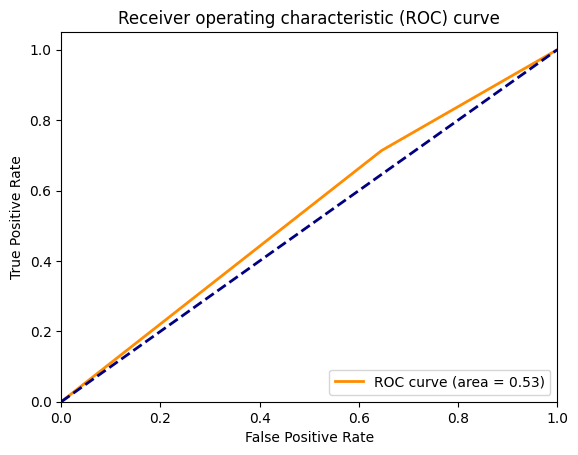

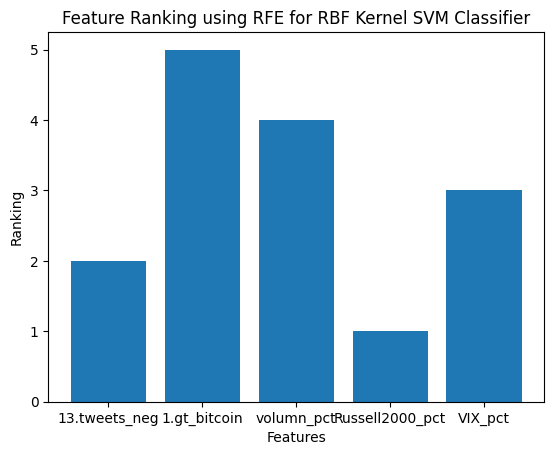

Accuracy:  0.5240793201133145 c:  1.0


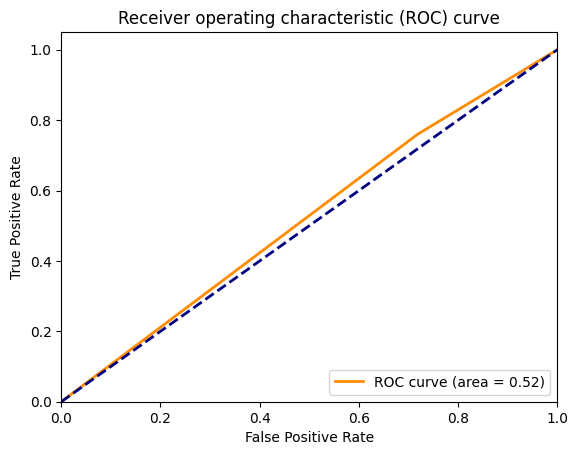

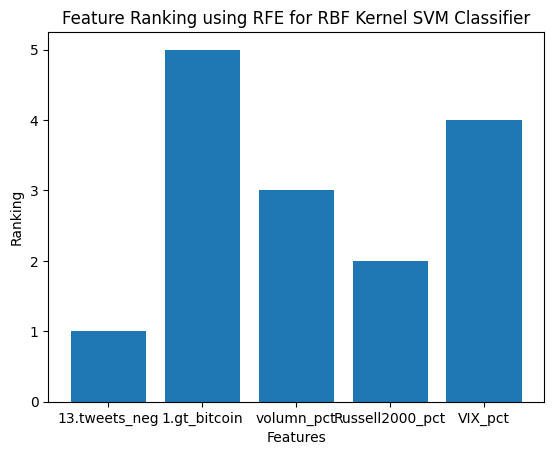

Accuracy:  0.5779036827195467 c:  1.1


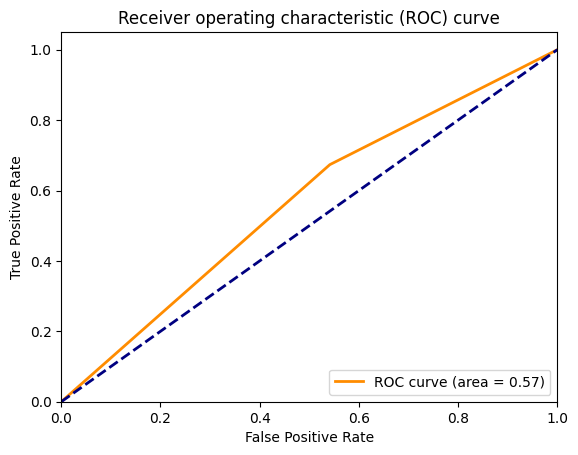

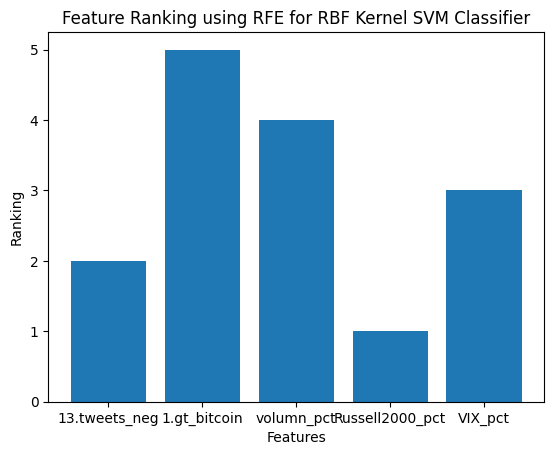

Accuracy:  0.5382436260623229 c:  1.2


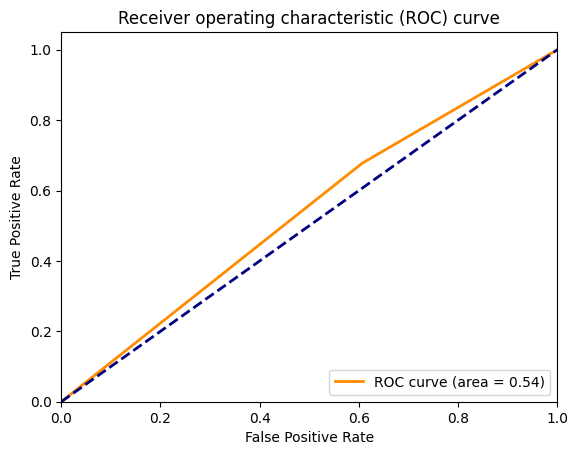

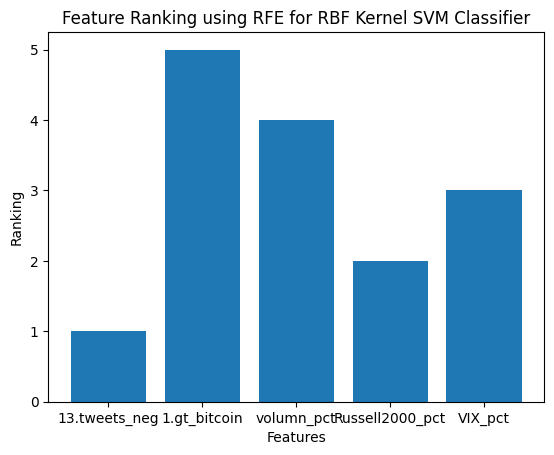

In [ ]:
for c in [0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0,1.1,1.2]:
  SVM_on_coin(df_bitcoin,btc_features, c)

### Ehter

In [ ]:
print(df_senti.columns)

Index(['13.tweets_neg', '1.gt_bitcoin', '10.news_senti', '12.tweets_pos',
       '14.twitter_btccrash_pos', '2.gt_Buy_Bitcoin', '7.s&p_twitter',
       '8.CBDC_uncertainty', '15.twitter_btccrash_neg', '6.gt_covid',
       '5.gt_Ukraine_war', '9.CBDC_atten', '3.gt_Sell_Bitcoin',
       '4.gt_ethereum', '11.fear&greed'],
      dtype='object')


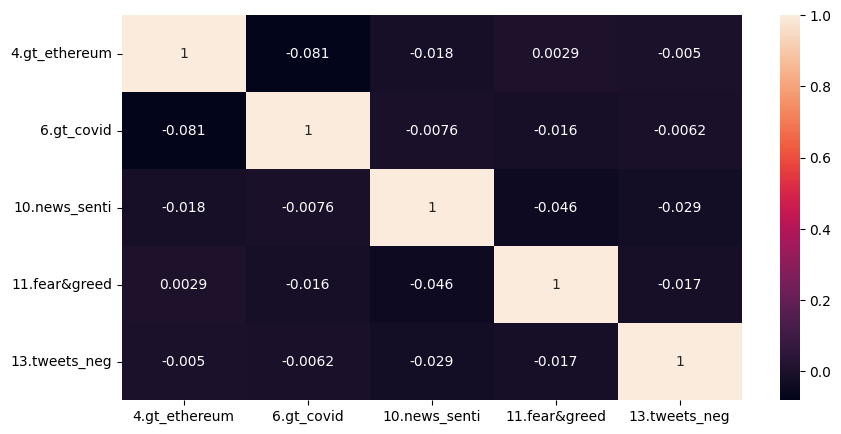

In [ ]:
# Use heatmap to visualize the correlation between senti features
ether_features = ['4.gt_ethereum', '6.gt_covid', '10.news_senti', '11.fear&greed', '13.tweets_neg',]
corr = df_senti[ether_features].corr()
plt.figure(figsize=(10,5))
# annot=True, visualize the data inside each block
sns.heatmap(corr, annot=True)
plt.show()

In [ ]:
df_ether, ether_features = create_final_df(3,ether_features)
df_ether['directionality'] = df_ether['directionality'].astype(int)
df_ether.head()
print(ether_features)

['4.gt_ethereum', '6.gt_covid', '10.news_senti', '11.fear&greed', '13.tweets_neg', 'volumn_pct', 'Russell2000_pct', 'VIX_pct']


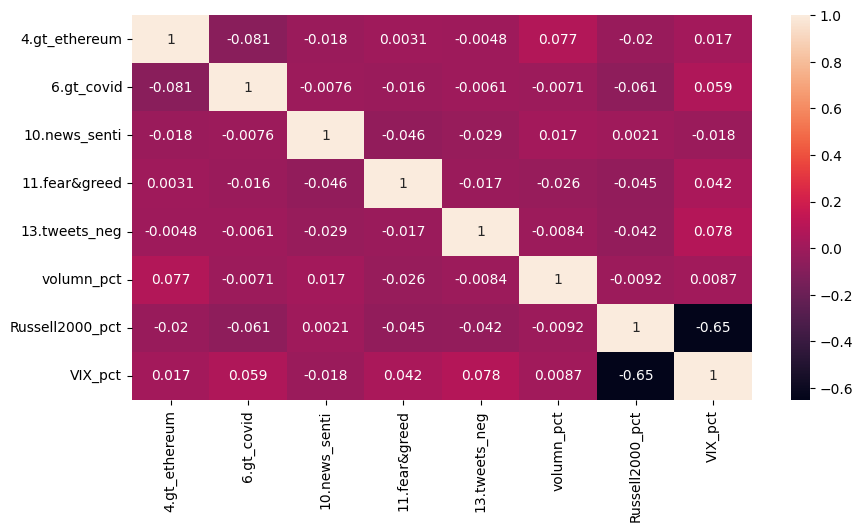

In [ ]:
# Use heatmap to visualize the correlation between senti features
corr = df_ether[ether_features].corr()
plt.figure(figsize=(10,5))
# annot=True, visualize the data inside each block
sns.heatmap(corr, annot=True)
plt.show()

Accuracy:  0.5524079320113314 c:  0.2


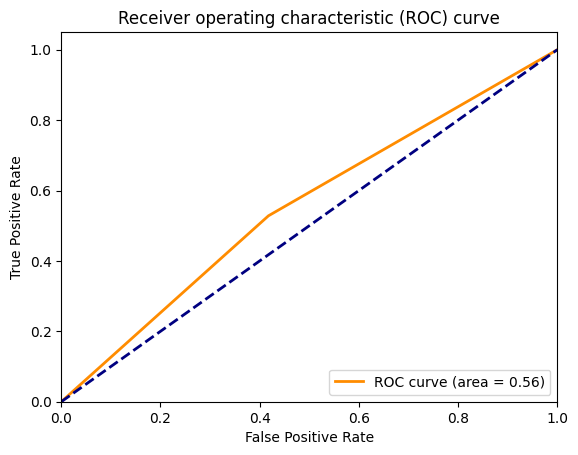

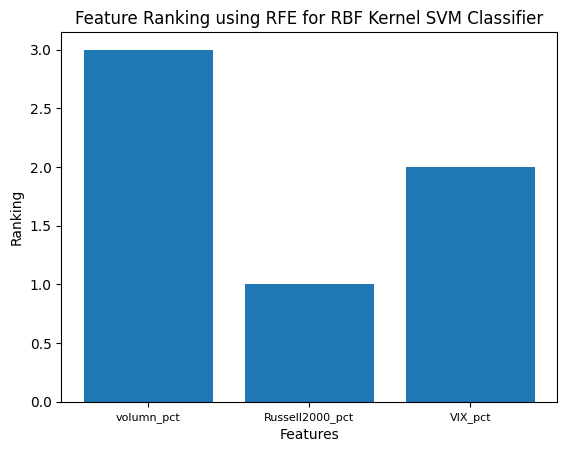

Accuracy:  0.5609065155807366 c:  0.3


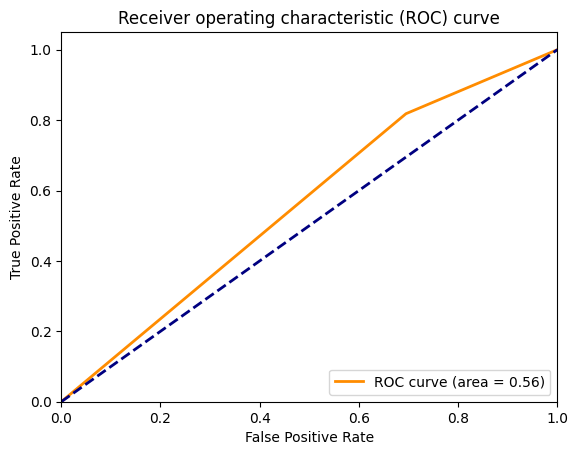

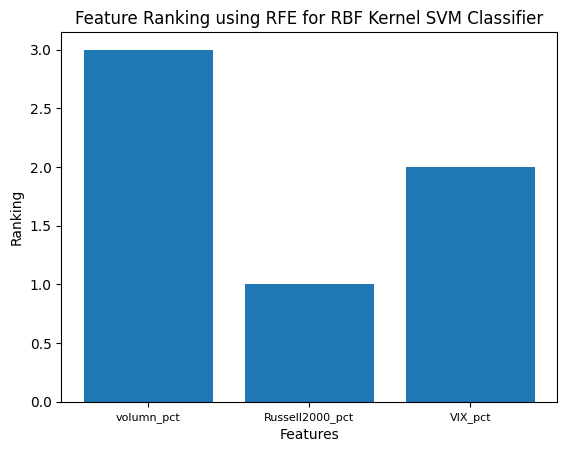

Accuracy:  0.5807365439093485 c:  0.4


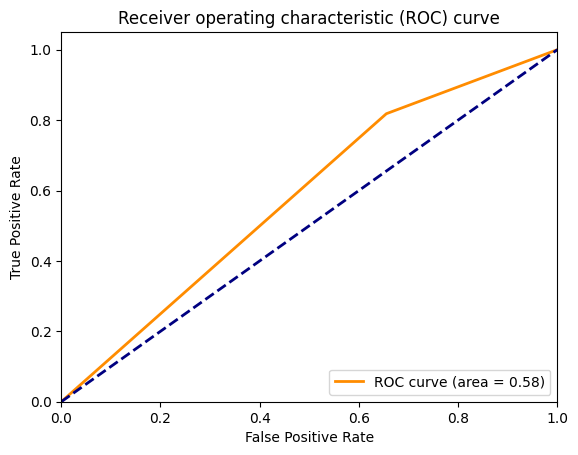

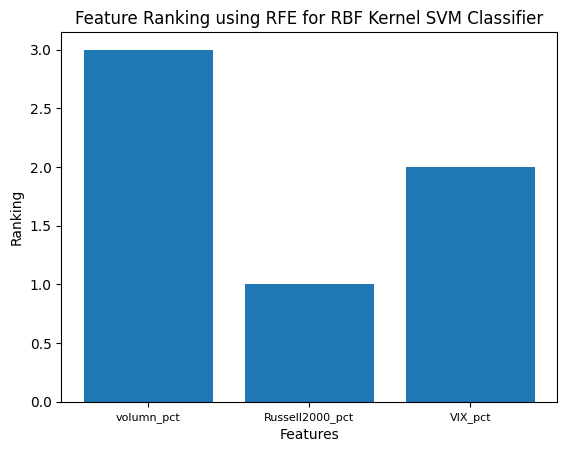

Accuracy:  0.5439093484419264 c:  0.5


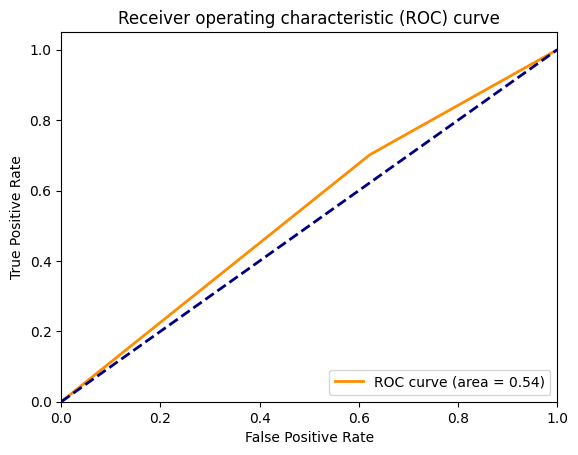

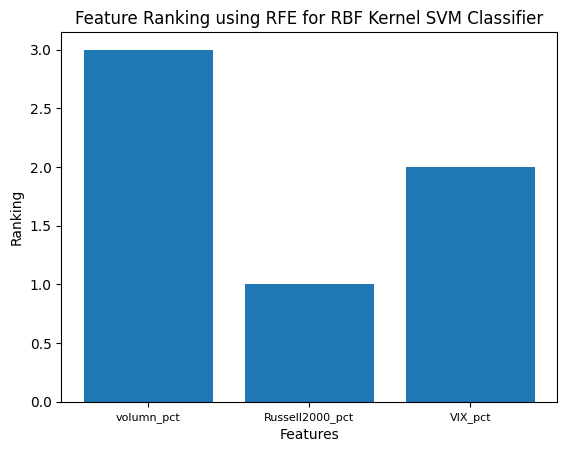

Accuracy:  0.5212464589235127 c:  0.6


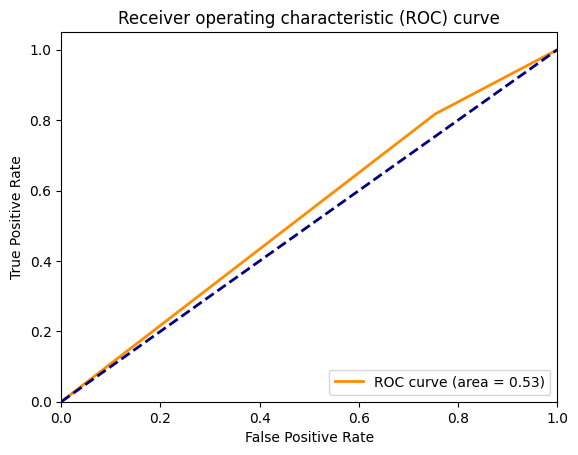

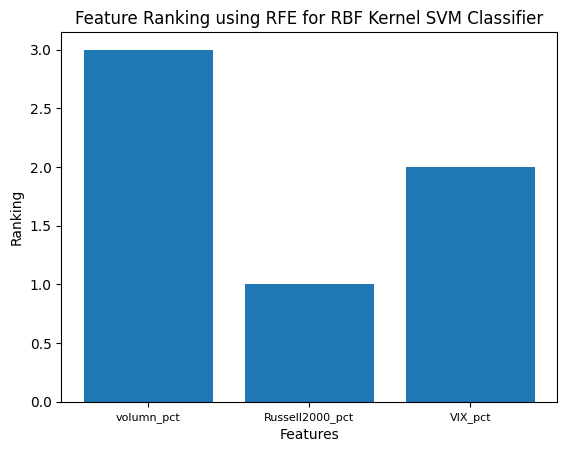

Accuracy:  0.5410764872521246 c:  0.7


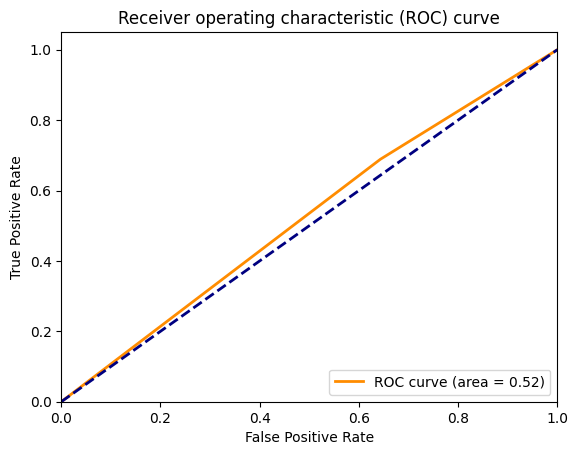

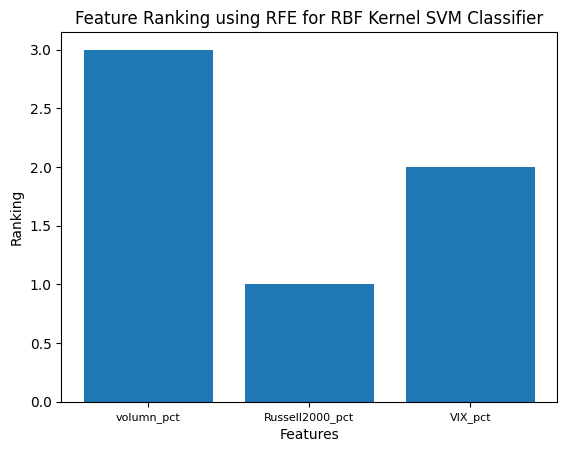

Accuracy:  0.5694050991501416 c:  0.8


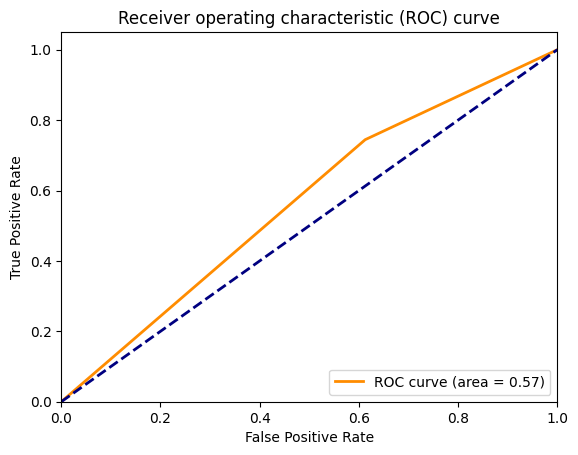

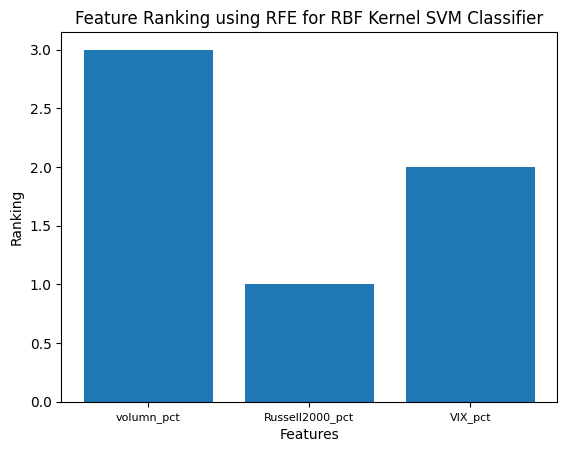

Accuracy:  0.5410764872521246 c:  0.9


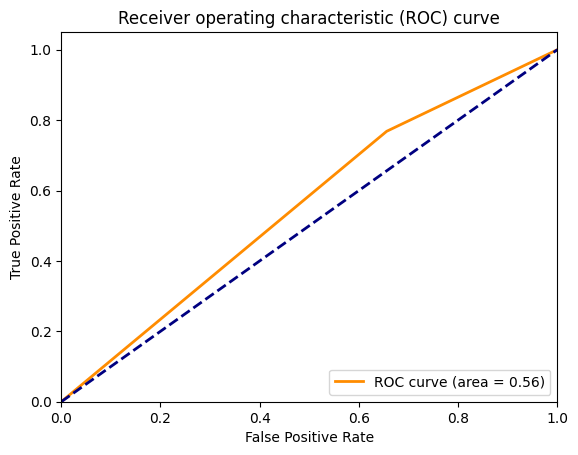

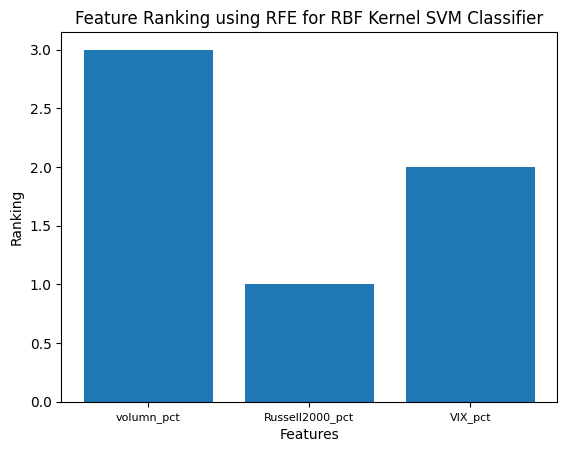

Accuracy:  0.5269121813031161 c:  1.0


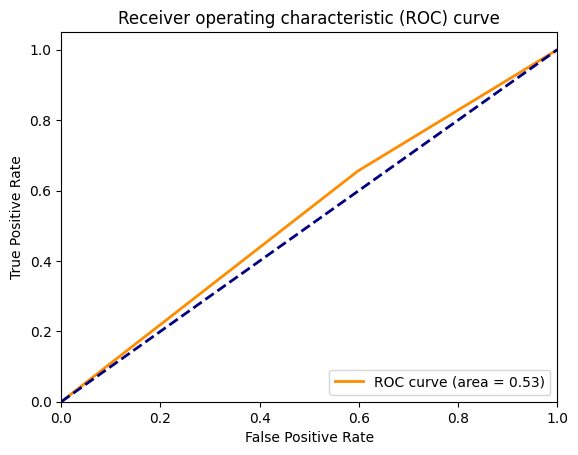

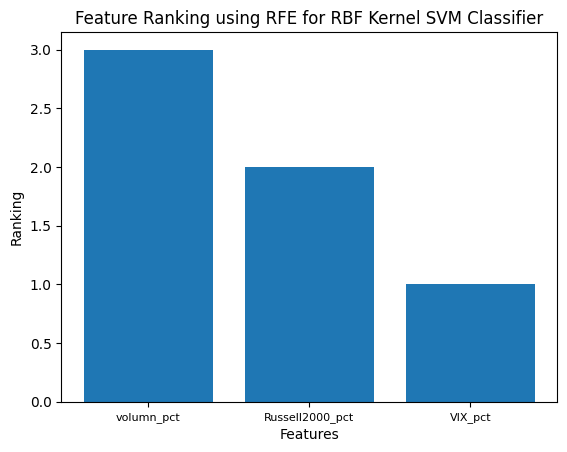

Accuracy:  0.5694050991501416 c:  1.1


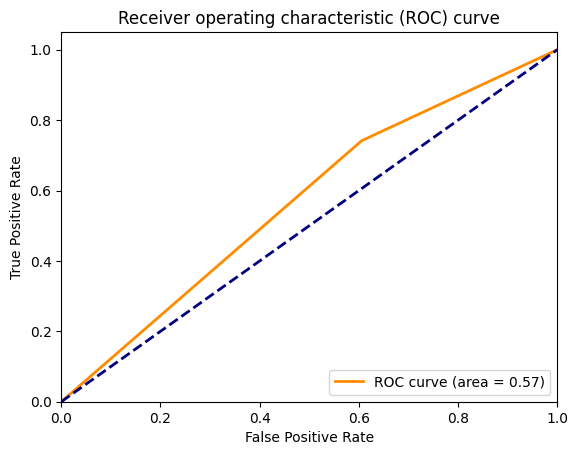

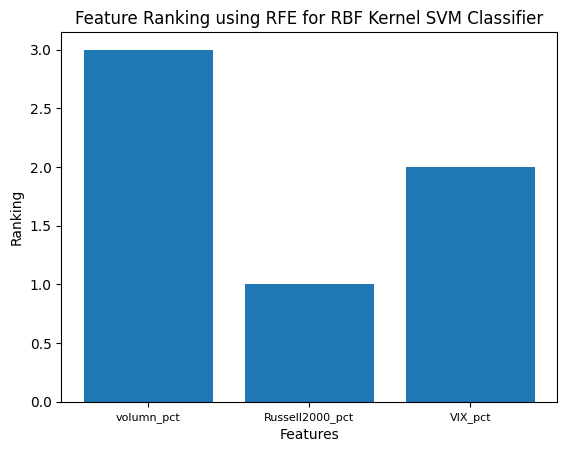

Accuracy:  0.5920679886685553 c:  1.2


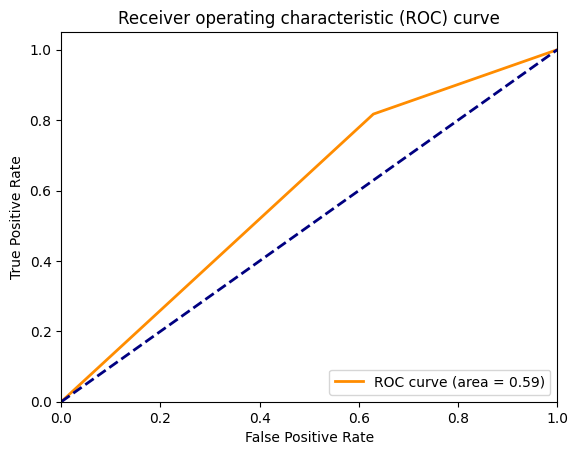

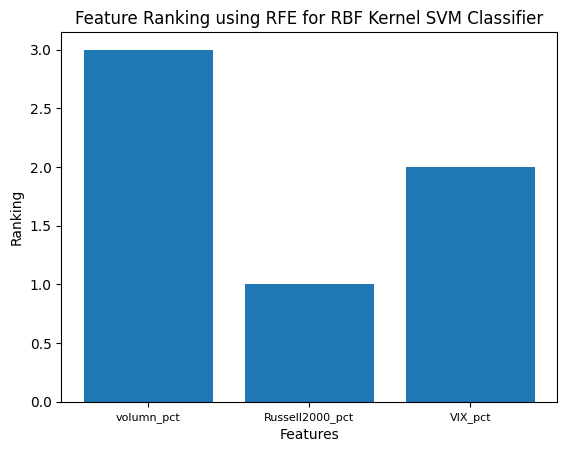

In [ ]:
for c in [0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0,1.1,1.2]:
  SVM_on_coin(df_ether,['volumn_pct','Russell2000_pct','VIX_pct'], c)

Accuracy:  0.6476190476190476 c:  0.2


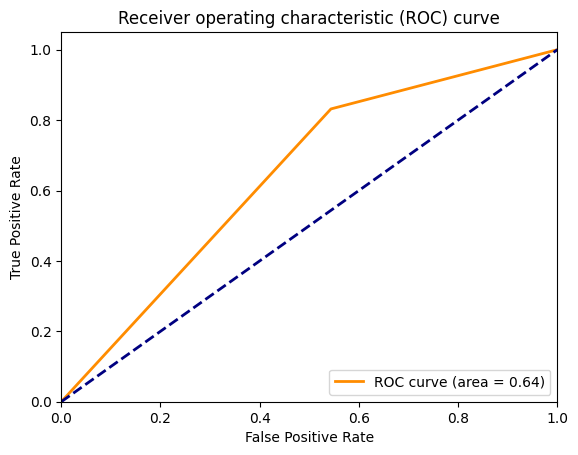

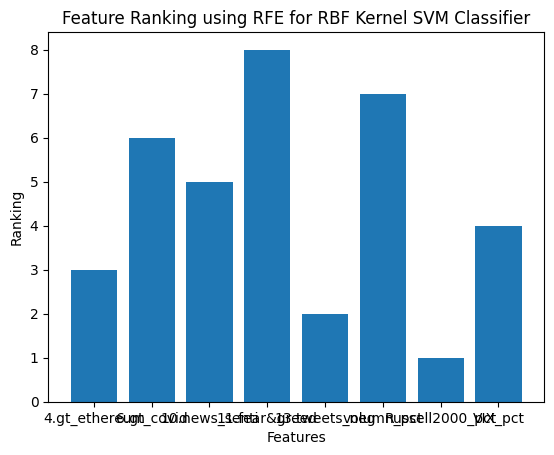

Accuracy:  0.6857142857142857 c:  0.3


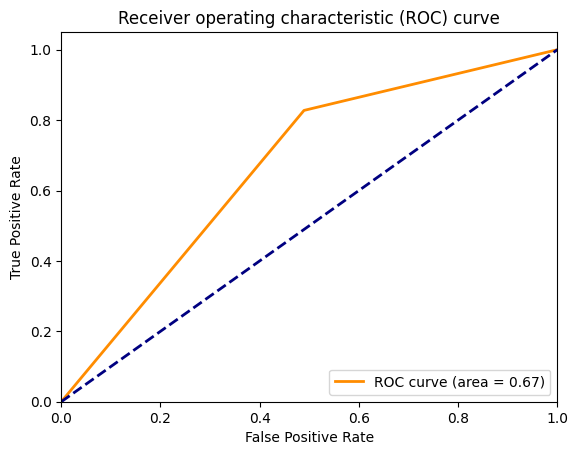

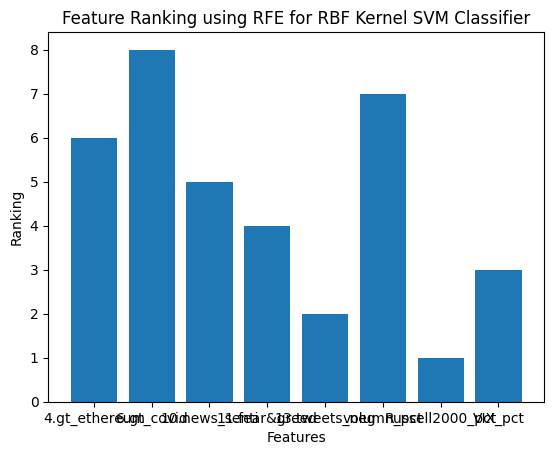

Accuracy:  0.6285714285714286 c:  0.4


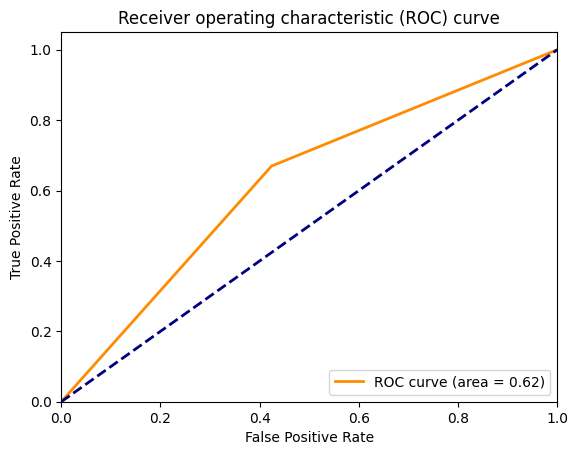

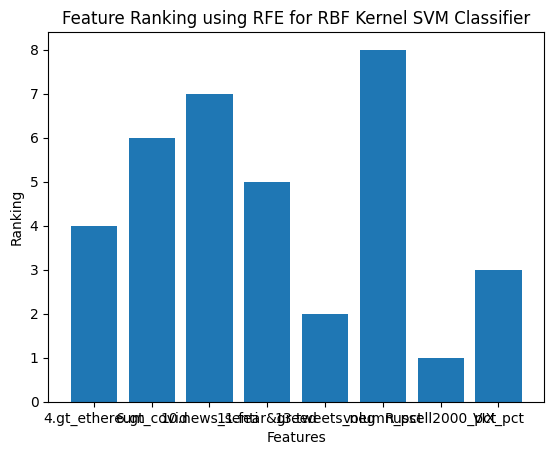

Accuracy:  0.5952380952380952 c:  0.5


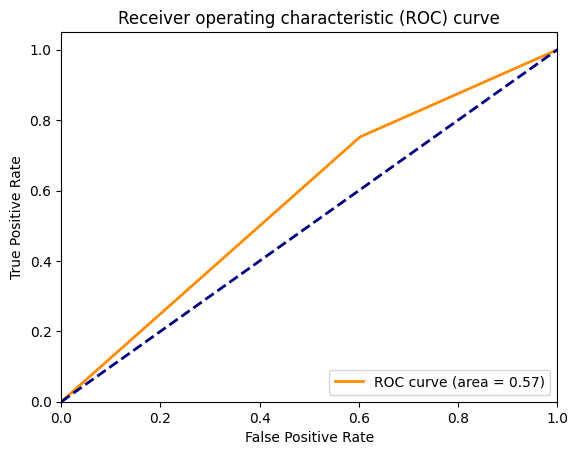

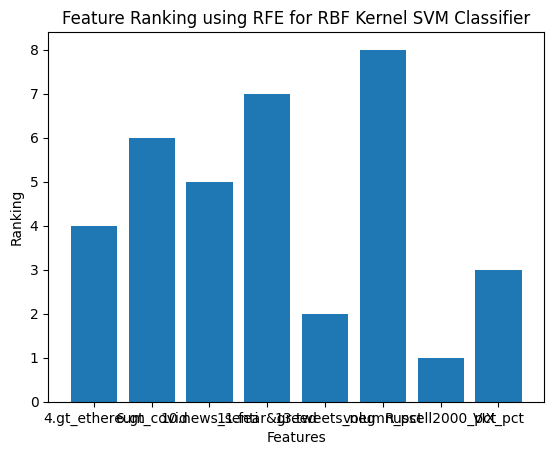

Accuracy:  0.6285714285714286 c:  0.6


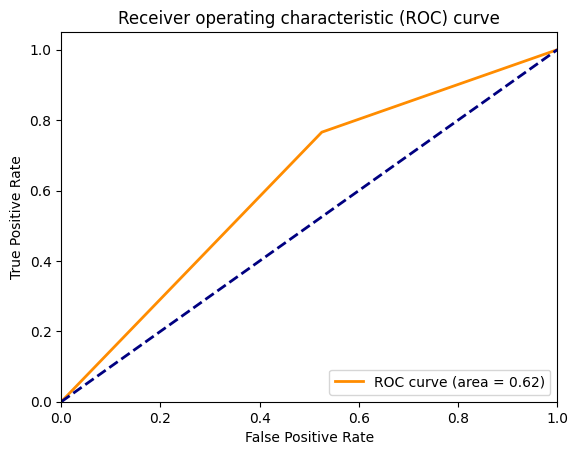

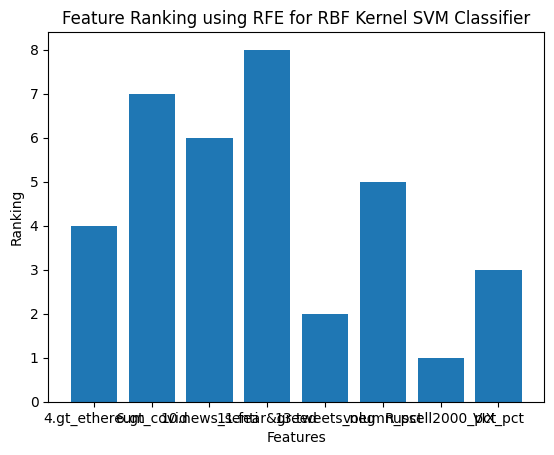

Accuracy:  0.6190476190476191 c:  0.7


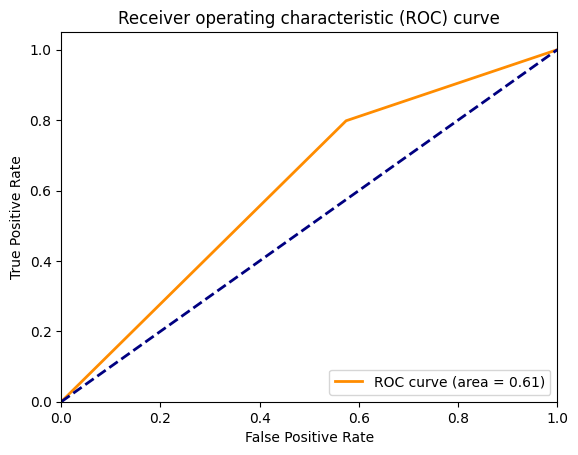

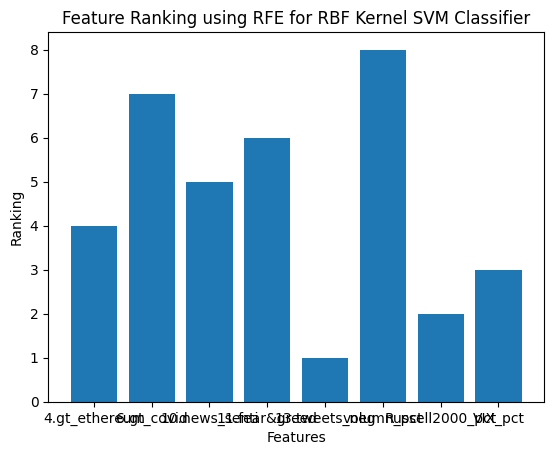

Accuracy:  0.5476190476190477 c:  0.8


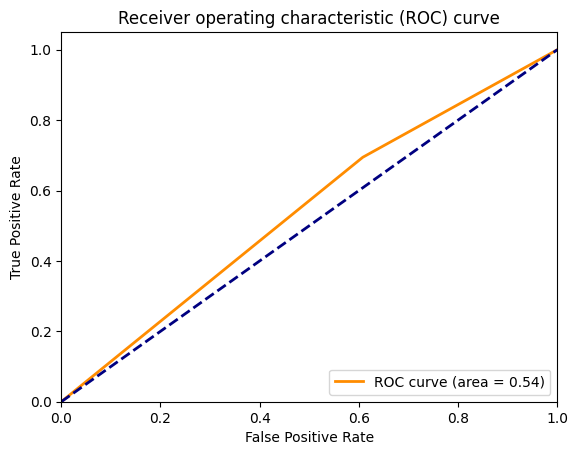

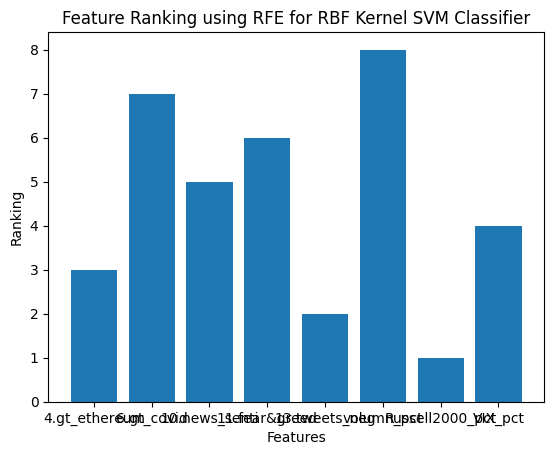

Accuracy:  0.5952380952380952 c:  0.9


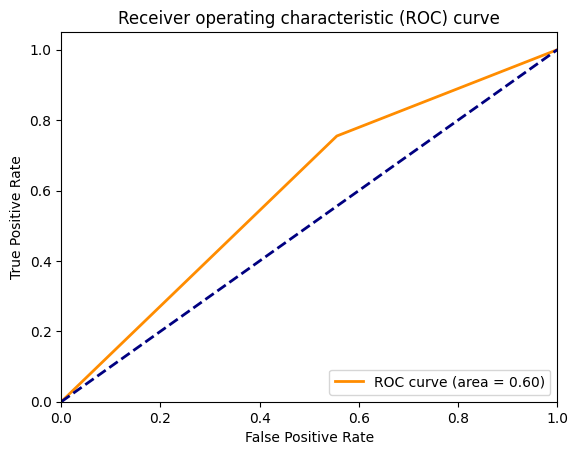

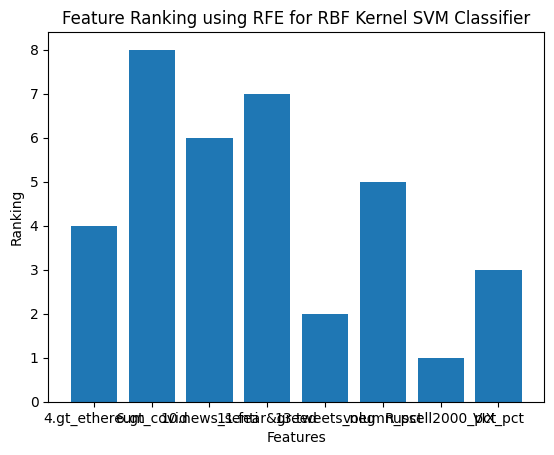

Accuracy:  0.7 c:  1.0


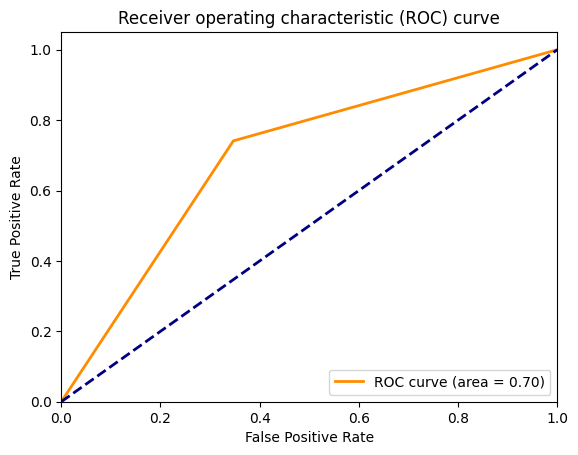

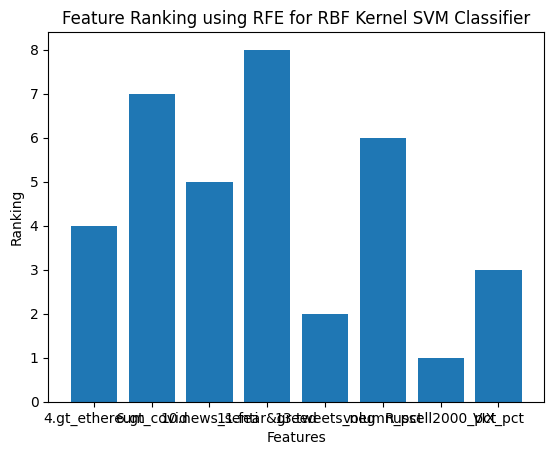

Accuracy:  0.6714285714285714 c:  1.1


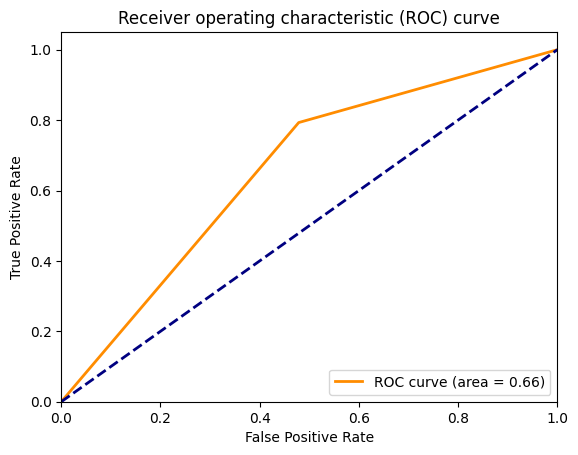

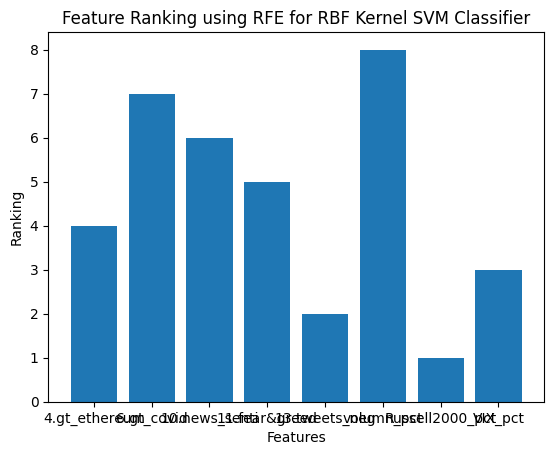

Accuracy:  0.6333333333333333 c:  1.2


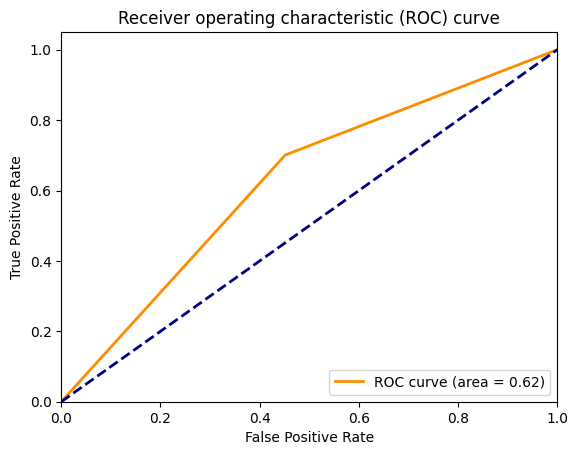

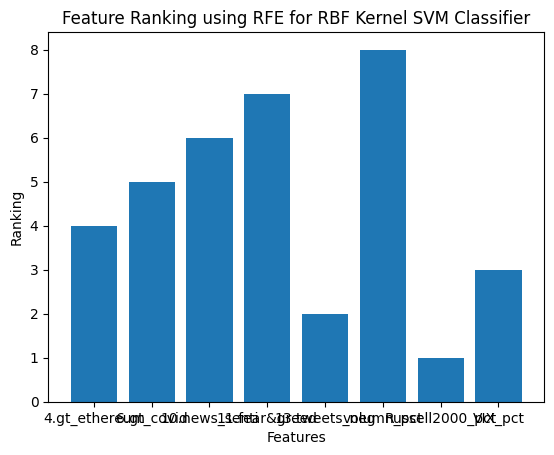

In [ ]:
for c in [0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0,1.1,1.2]:
  SVM_on_coin(df_ether[1:], ether_features, c)

### BDM

In [ ]:
print(df_senti.columns)

Index(['13.tweets_neg', '1.gt_bitcoin', '10.news_senti', '12.tweets_pos',
       '14.twitter_btccrash_pos', '2.gt_Buy_Bitcoin', '7.s&p_twitter',
       '8.CBDC_uncertainty', '15.twitter_btccrash_neg', '6.gt_covid',
       '5.gt_Ukraine_war', '9.CBDC_atten', '3.gt_Sell_Bitcoin',
       '4.gt_ethereum', '11.fear&greed'],
      dtype='object')


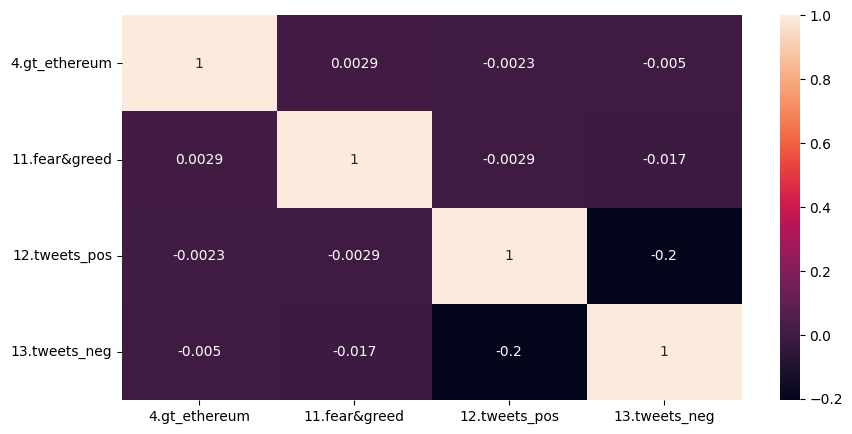

In [ ]:
# Use heatmap to visualize the correlation between senti features
bdm_features = ['4.gt_ethereum', '11.fear&greed', '12.tweets_pos', '13.tweets_neg',]
corr = df_senti[bdm_features].corr()
plt.figure(figsize=(10,5))
# annot=True, visualize the data inside each block
sns.heatmap(corr, annot=True)
plt.show()

In [ ]:
coin_list

['/content/drive/MyDrive/S&P Crypto Project/Final_Data/Crypto_Data/SP_BDM.csv',
 '/content/drive/MyDrive/S&P Crypto Project/Final_Data/Crypto_Data/SP_BDM_exlarge.csv',
 '/content/drive/MyDrive/S&P Crypto Project/Final_Data/Crypto_Data/bitcoin.csv',
 '/content/drive/MyDrive/S&P Crypto Project/Final_Data/Crypto_Data/ethereum.csv']

In [ ]:
df_bdm, bdm_features = create_final_df(0,bdm_features)
df_bdm['directionality'] = df_bdm['directionality'].astype(int)
df_bdm.head()
print(bdm_features)

['4.gt_ethereum', '11.fear&greed', '12.tweets_pos', '13.tweets_neg', 'volumn_pct', 'Russell2000_pct', 'VIX_pct']


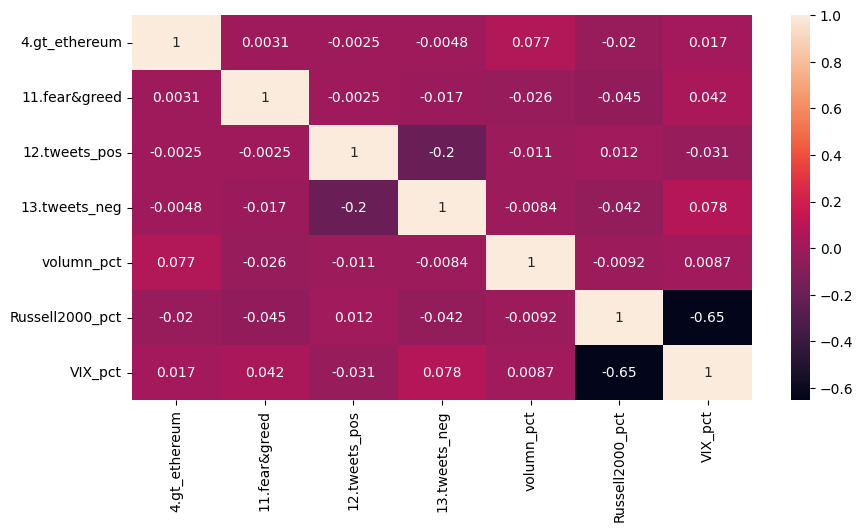

In [ ]:
# Use heatmap to visualize the correlation between senti features
corr = df_bdm[bdm_features].corr()
plt.figure(figsize=(10,5))
# annot=True, visualize the data inside each block
sns.heatmap(corr, annot=True)
plt.show()

Accuracy:  0.6175637393767706 c:  0.2


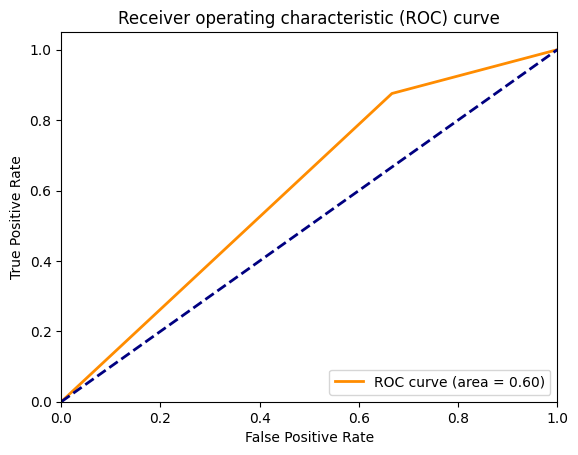

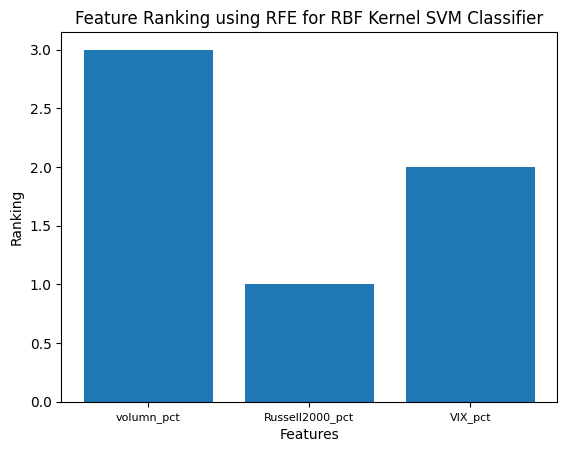

Accuracy:  0.5637393767705382 c:  0.3


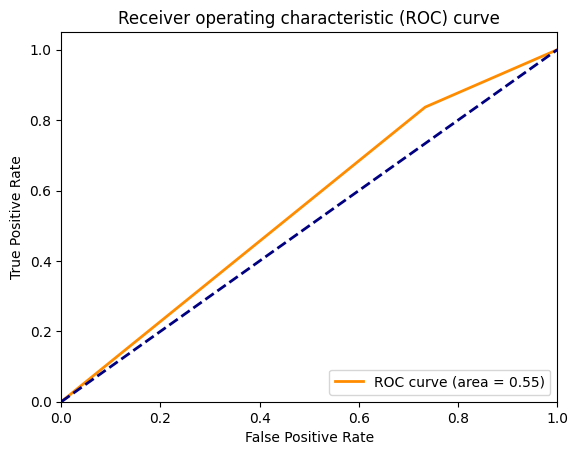

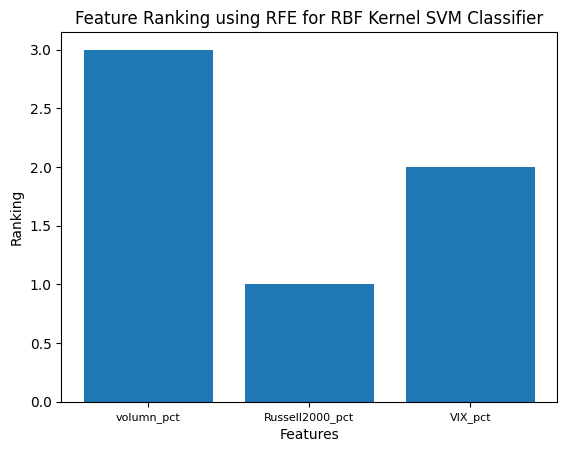

Accuracy:  0.5524079320113314 c:  0.4


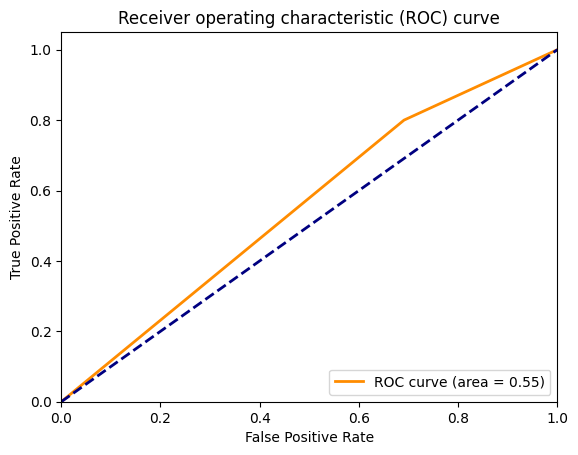

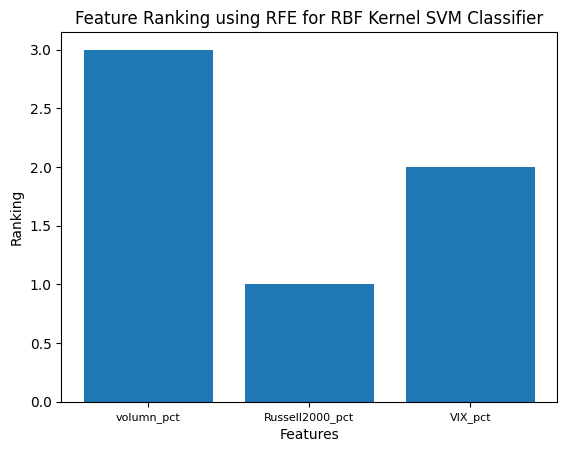

Accuracy:  0.6175637393767706 c:  0.5


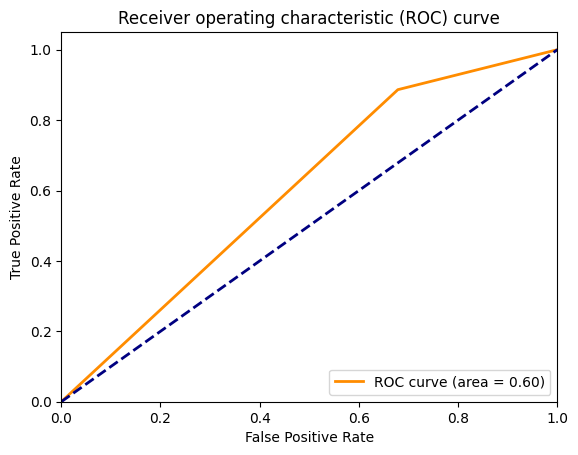

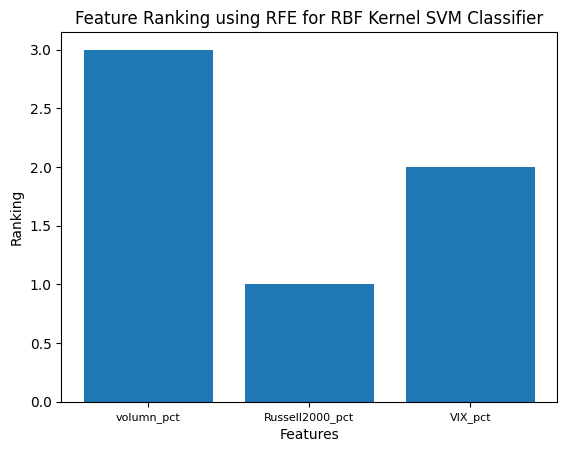

Accuracy:  0.5949008498583569 c:  0.6


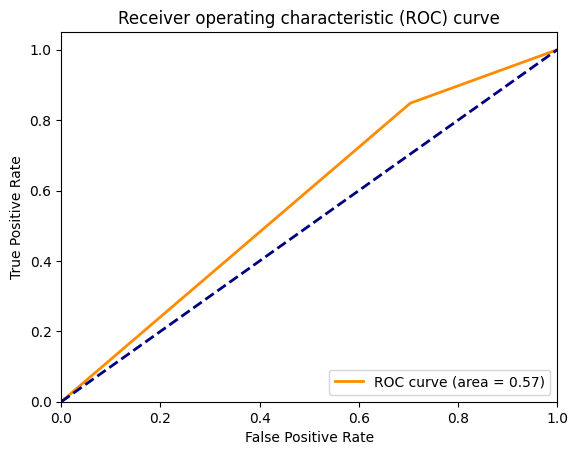

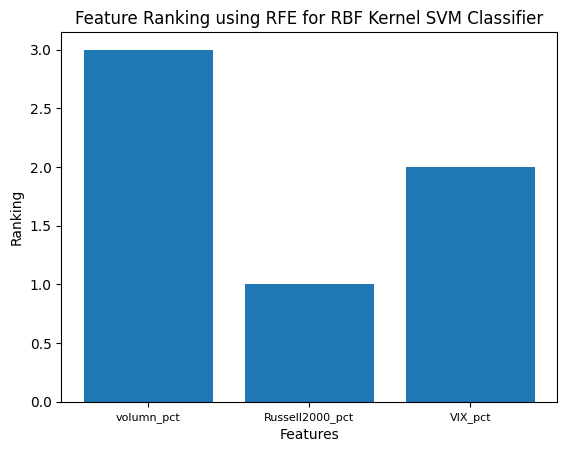

Accuracy:  0.6118980169971672 c:  0.7


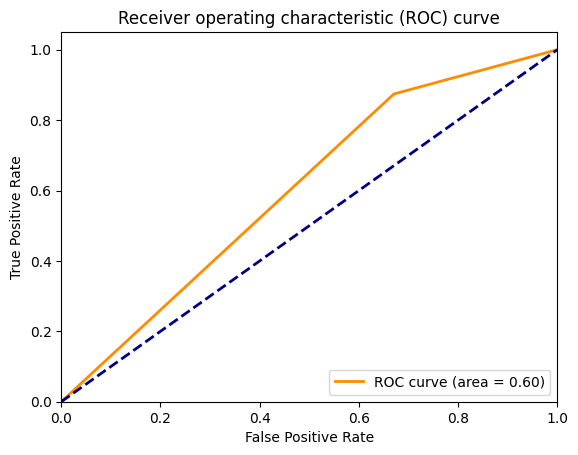

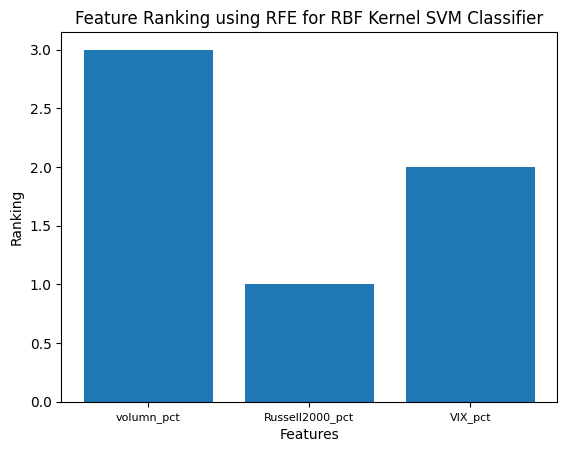

Accuracy:  0.6062322946175638 c:  0.8


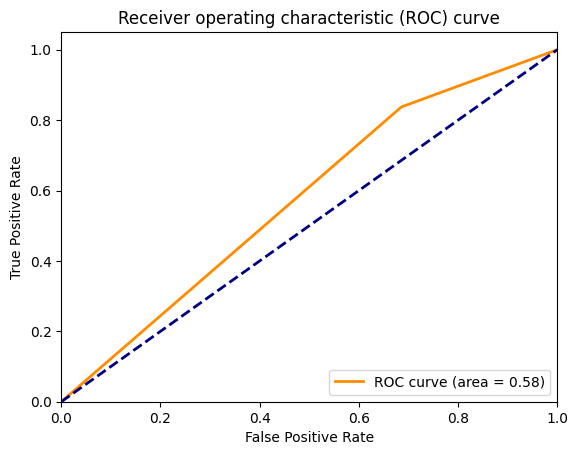

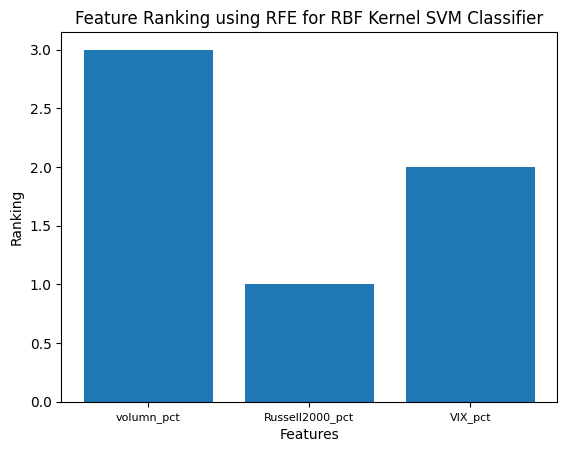

Accuracy:  0.5949008498583569 c:  0.9


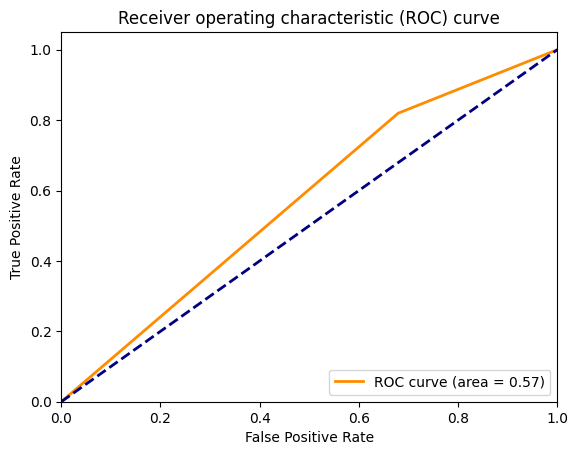

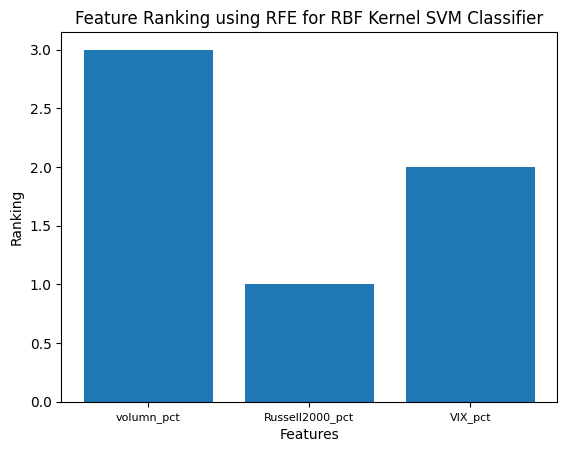

Accuracy:  0.5779036827195467 c:  1.0


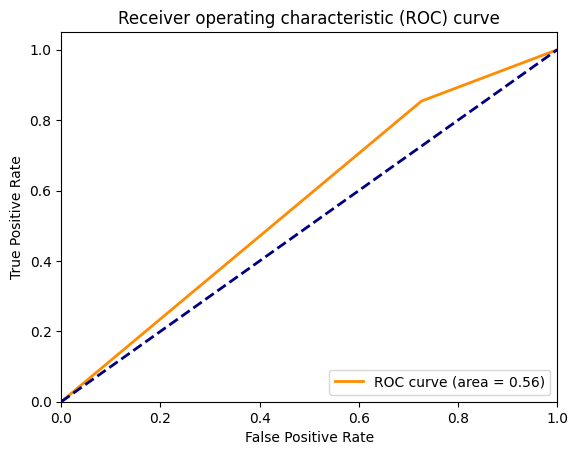

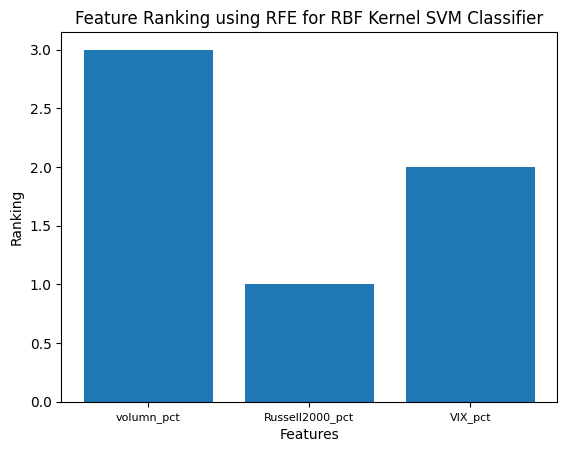

Accuracy:  0.6175637393767706 c:  1.1


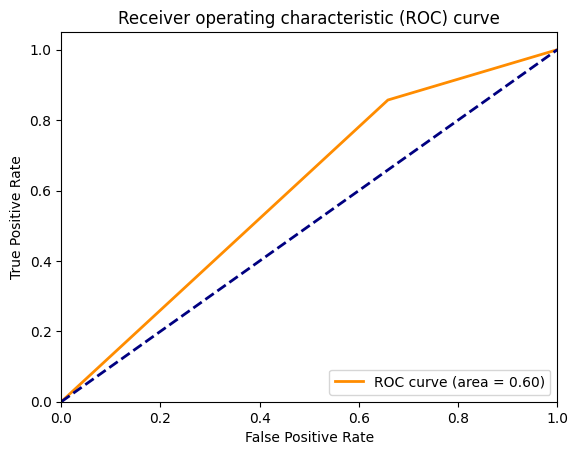

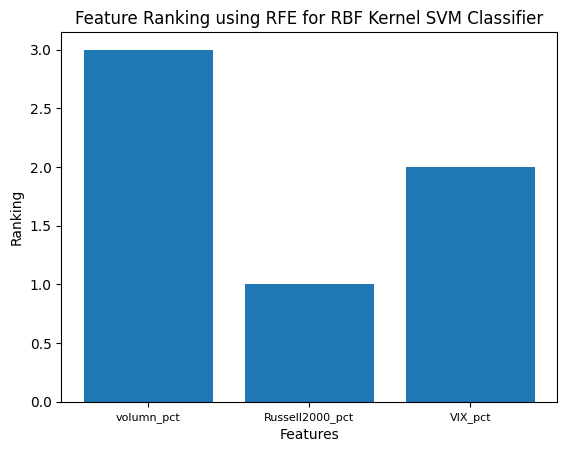

Accuracy:  0.5949008498583569 c:  1.2


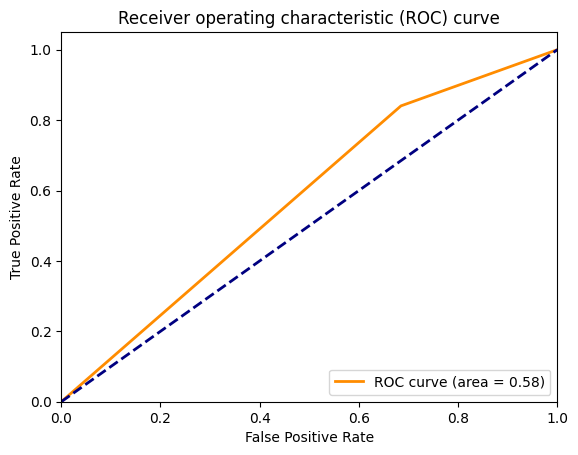

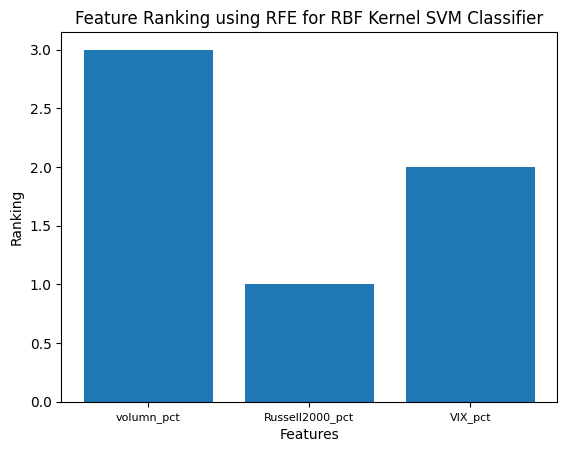

In [ ]:
for c in [0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0,1.1,1.2]:
  SVM_on_coin(df_bdm,['volumn_pct','Russell2000_pct','VIX_pct'], c)

Accuracy:  0.603399433427762 c:  0.2


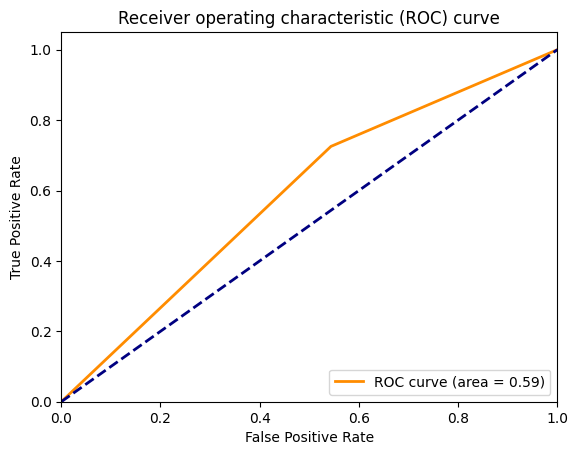

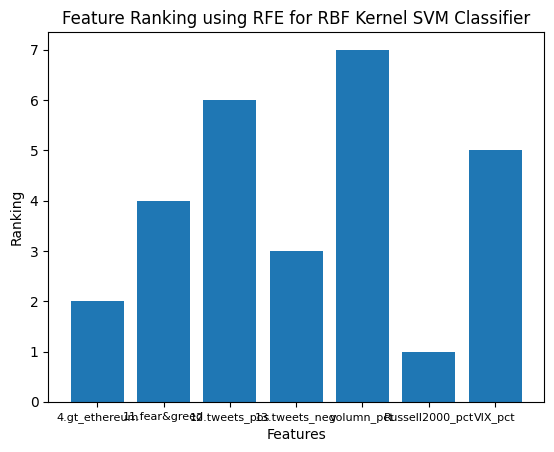

Accuracy:  0.603399433427762 c:  0.3


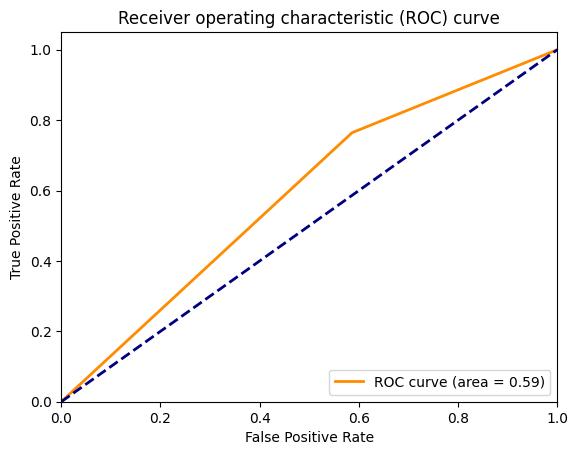

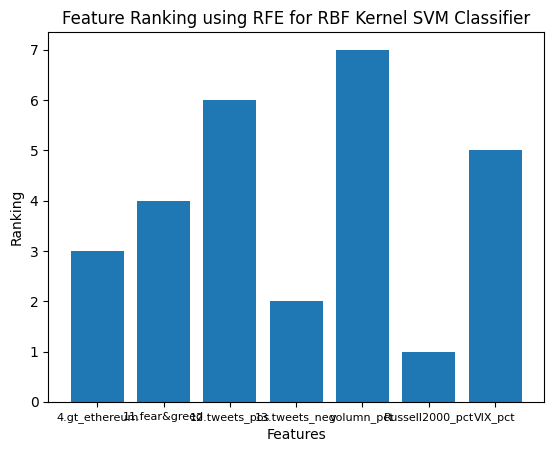

Accuracy:  0.6175637393767706 c:  0.4


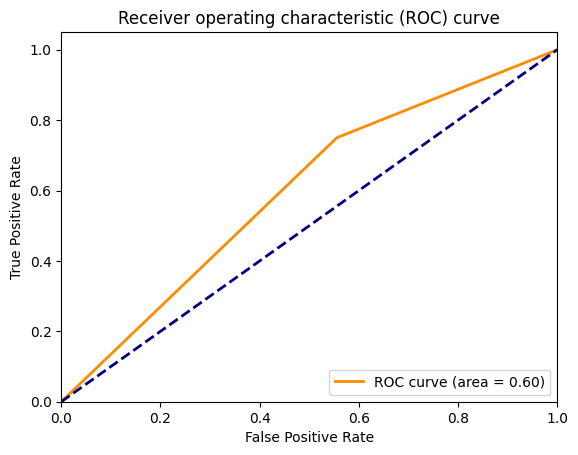

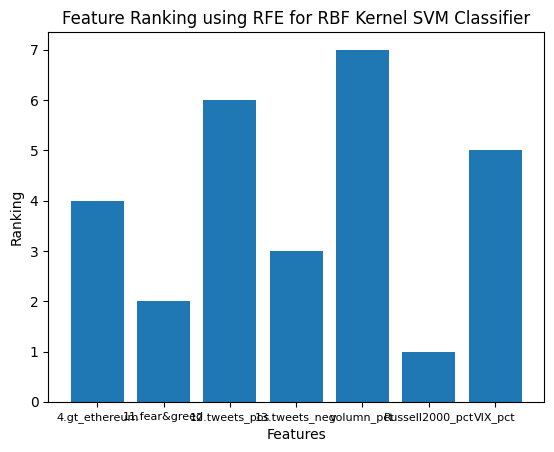

Accuracy:  0.623229461756374 c:  0.5


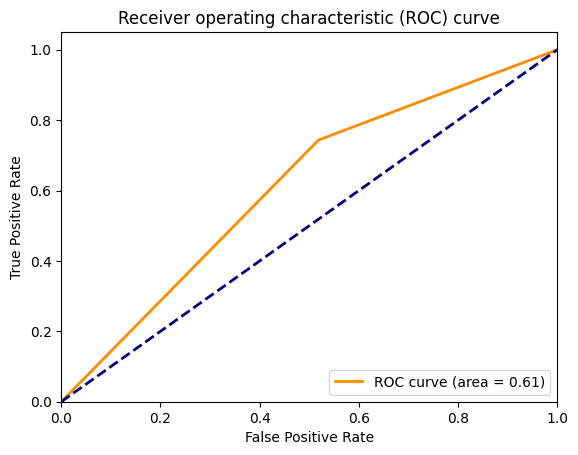

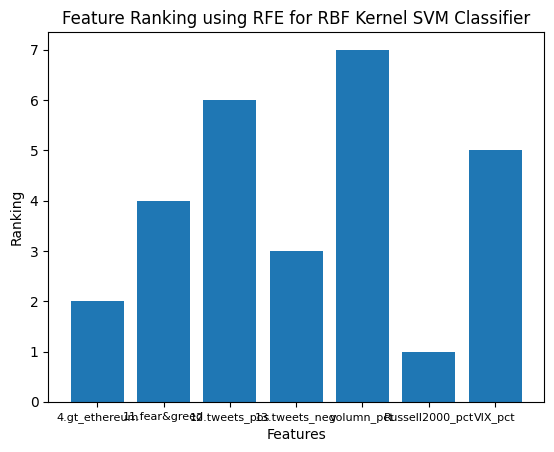

Accuracy:  0.5722379603399433 c:  0.6


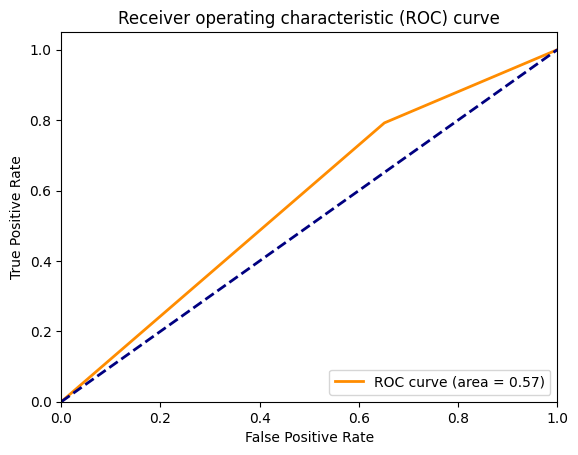

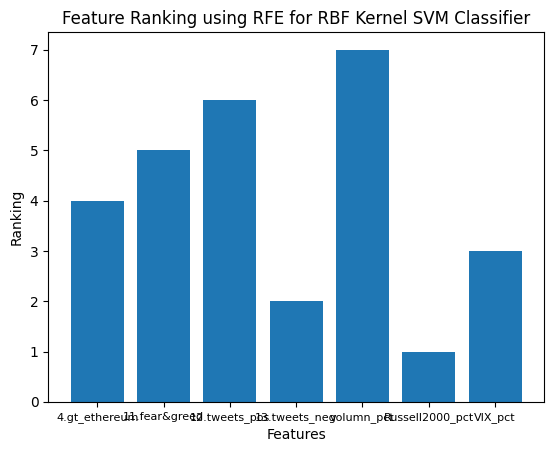

Accuracy:  0.5524079320113314 c:  0.7


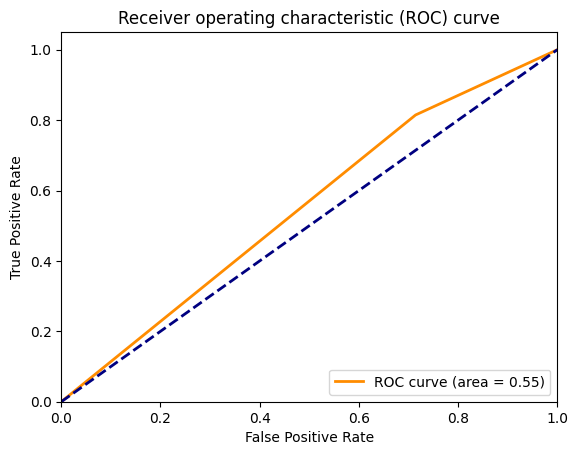

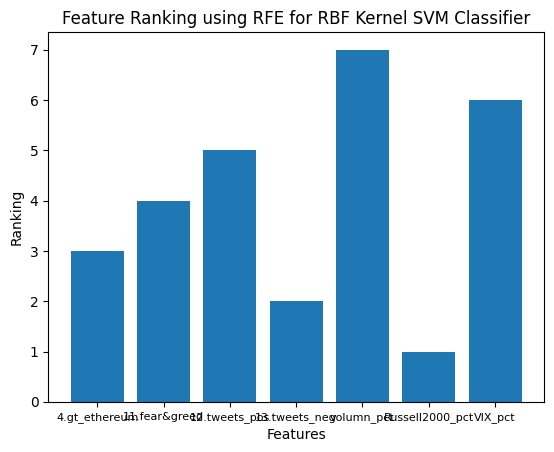

Accuracy:  0.5977337110481586 c:  0.8


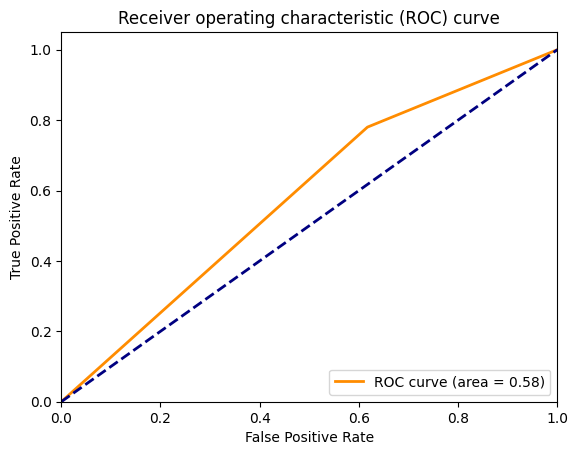

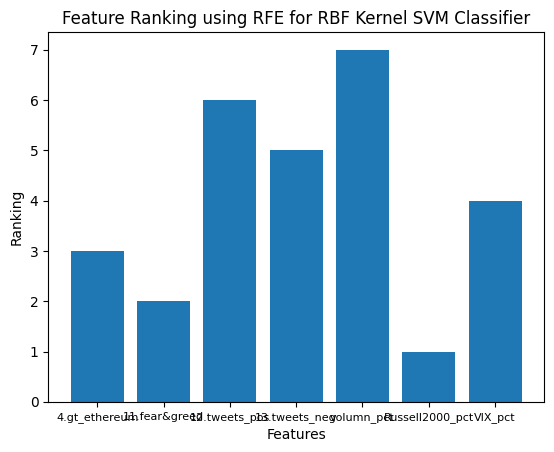

Accuracy:  0.5552407932011332 c:  0.9


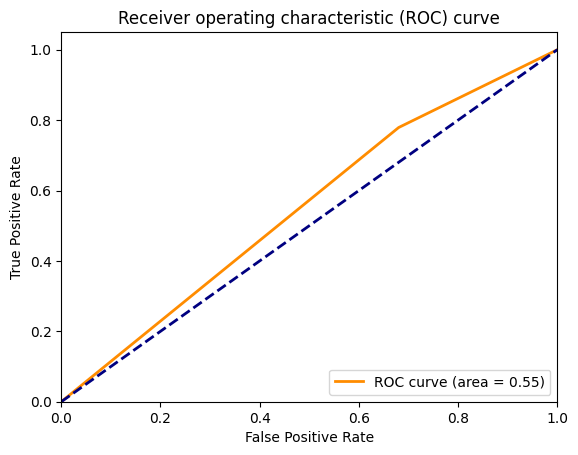

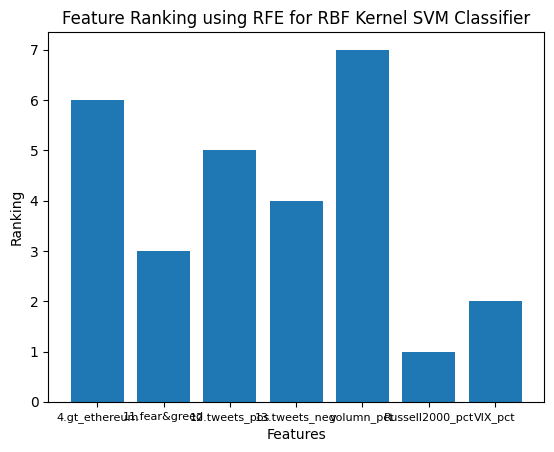

Accuracy:  0.5892351274787535 c:  1.0


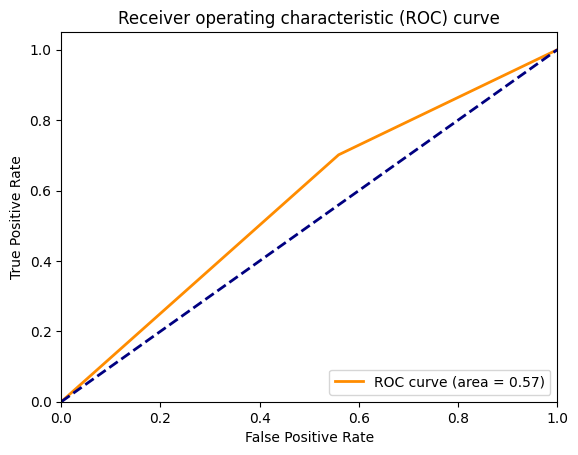

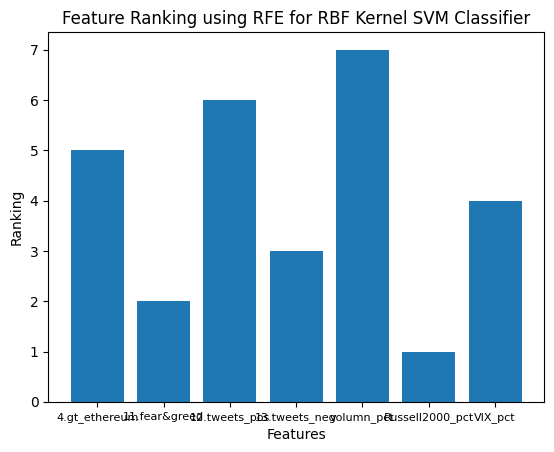

Accuracy:  0.5949008498583569 c:  1.1


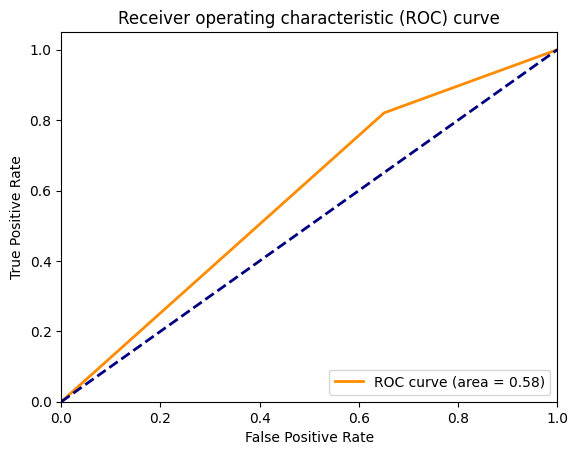

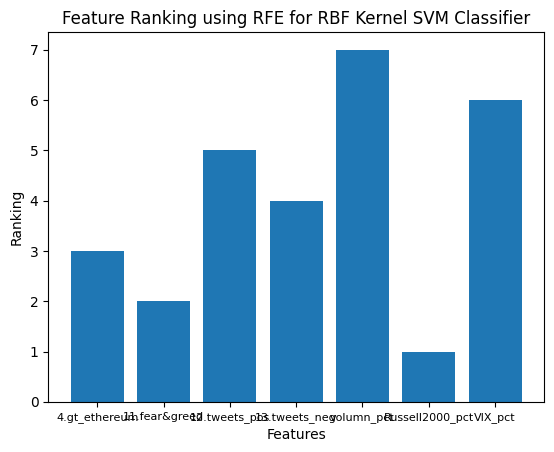

Accuracy:  0.6430594900849859 c:  1.2


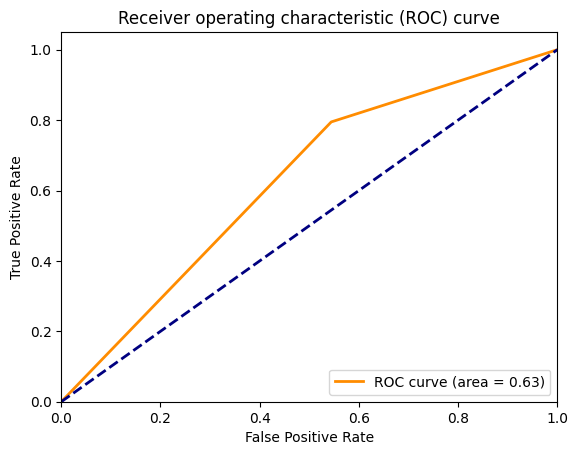

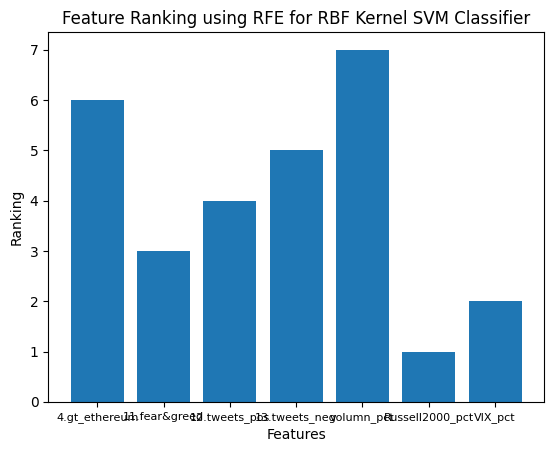

Accuracy:  0.5864022662889519 c:  1.3


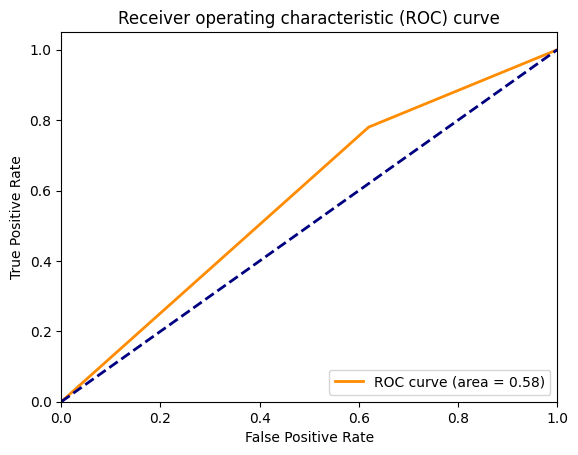

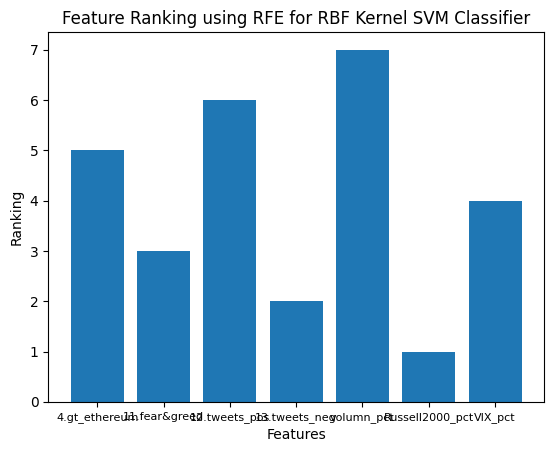

Accuracy:  0.5779036827195467 c:  1.4


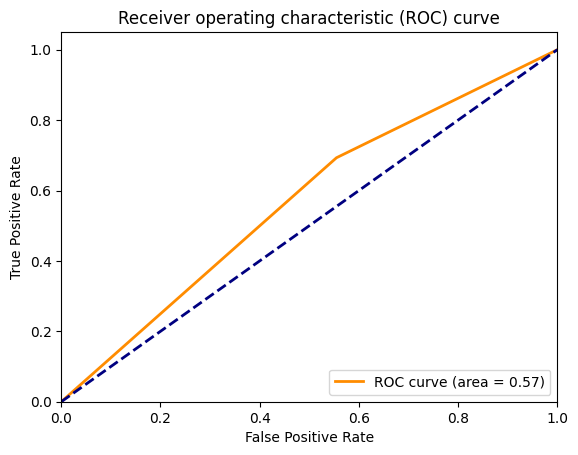

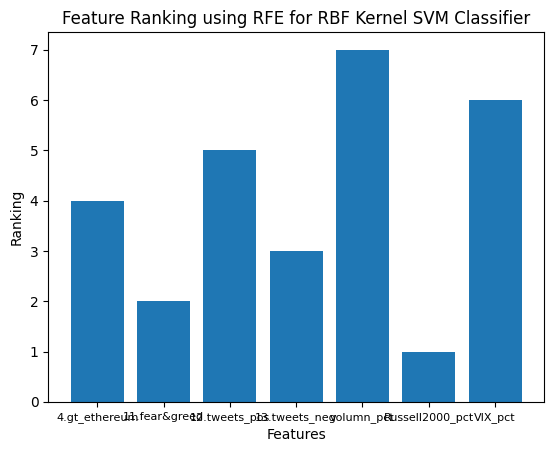

Accuracy:  0.5609065155807366 c:  1.5


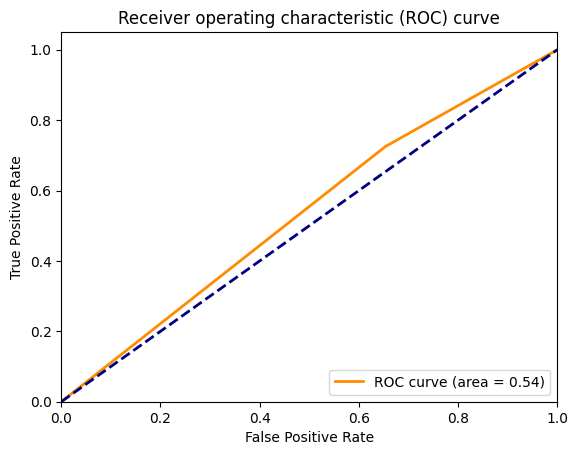

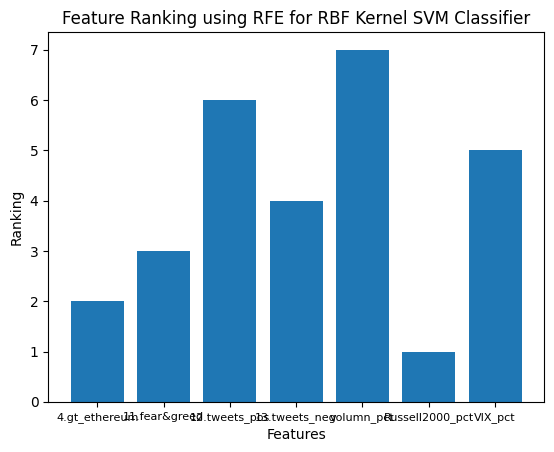

In [ ]:
for c in [0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0,1.1,1.2,1.3,1.4,1.5]:
  SVM_on_coin(df_bdm, bdm_features, c)

### Ex_large BDM

Accuracy:  0.6175637393767706 c:  0.2


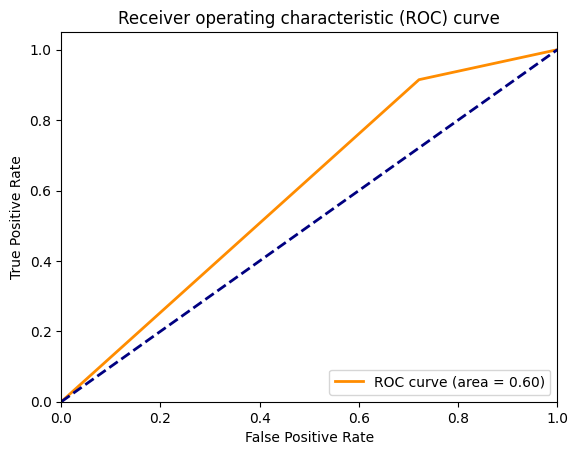

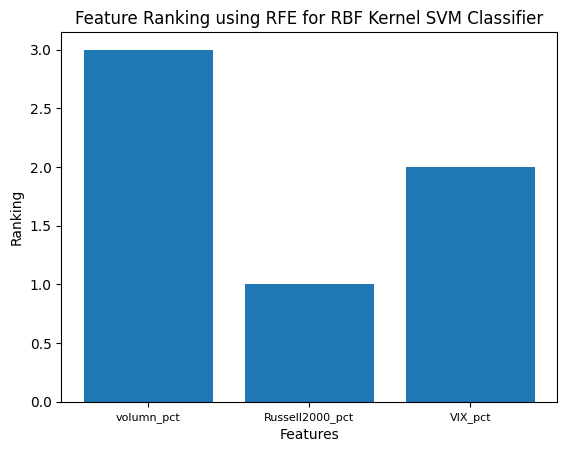

Accuracy:  0.5722379603399433 c:  0.3


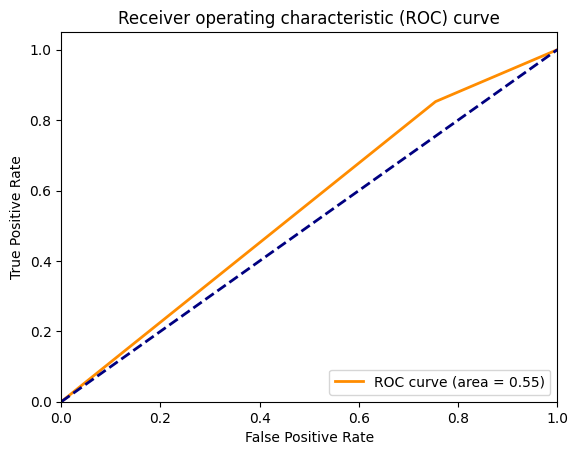

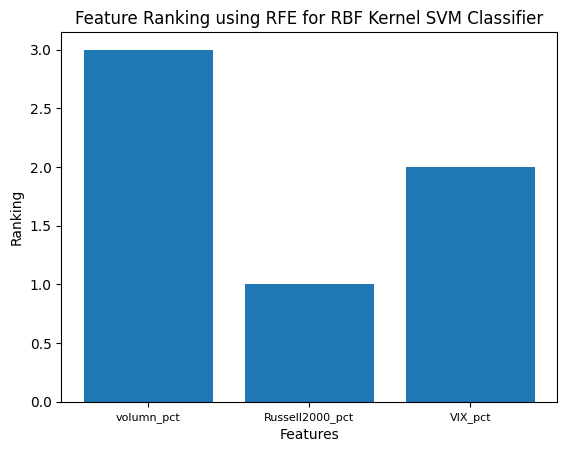

Accuracy:  0.5382436260623229 c:  0.4


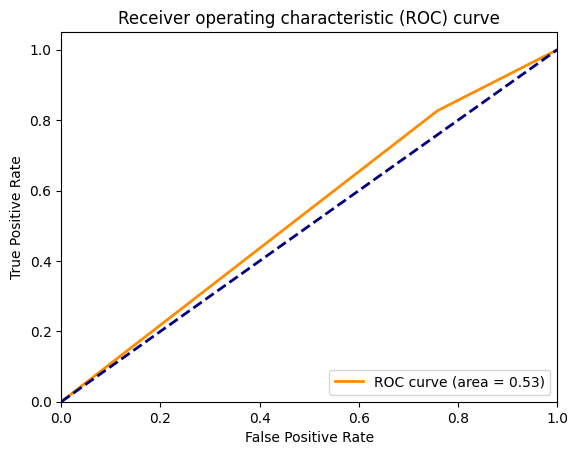

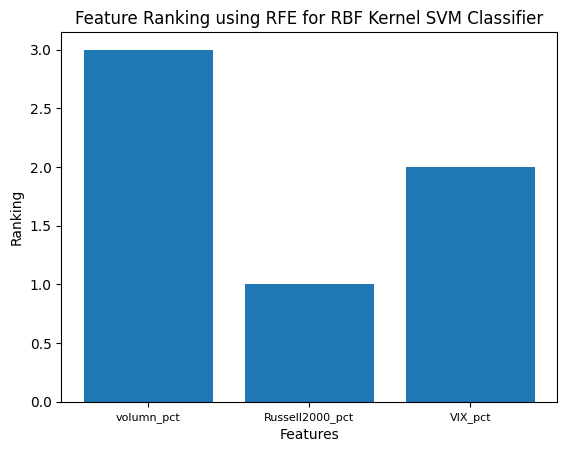

Accuracy:  0.6203966005665722 c:  0.5


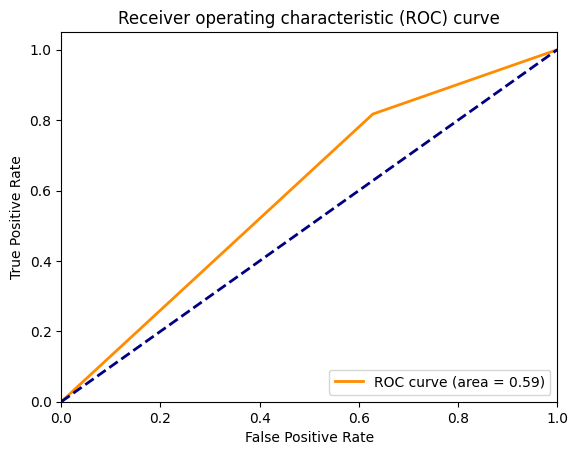

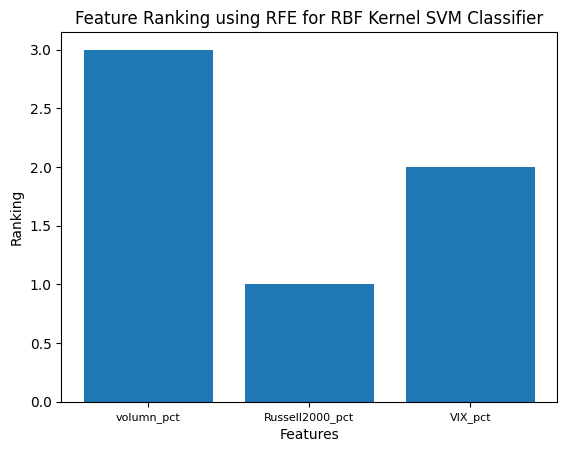

Accuracy:  0.5580736543909348 c:  0.6


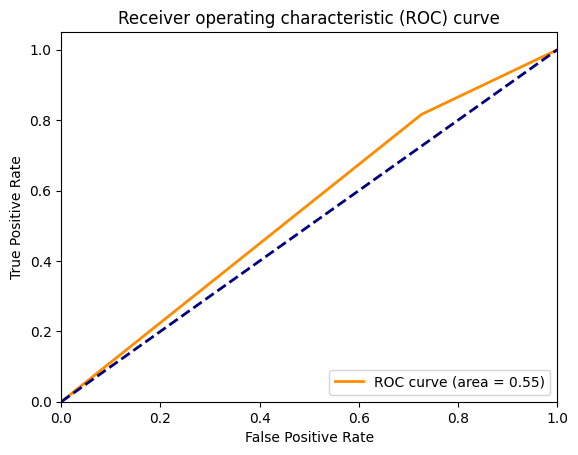

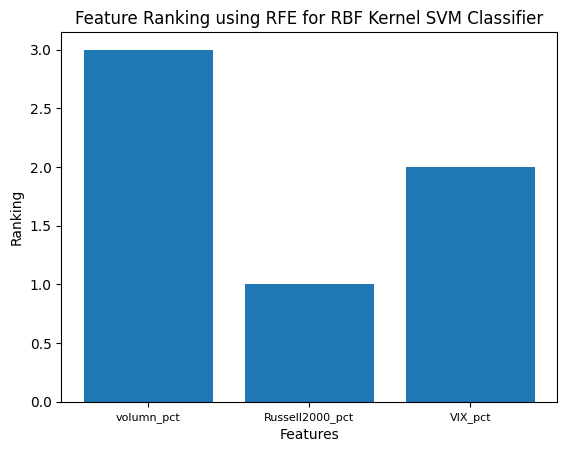

Accuracy:  0.5722379603399433 c:  0.7


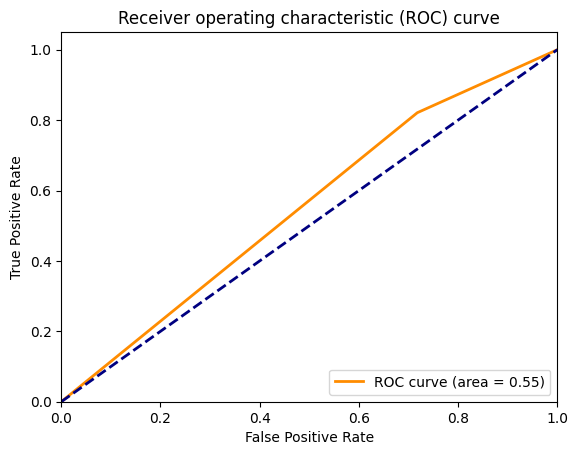

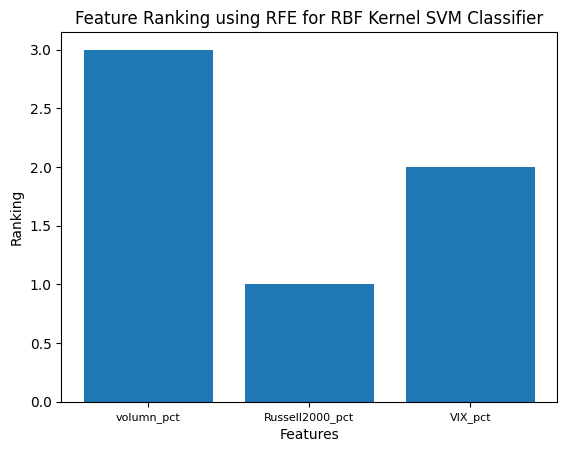

Accuracy:  0.5835694050991501 c:  0.8


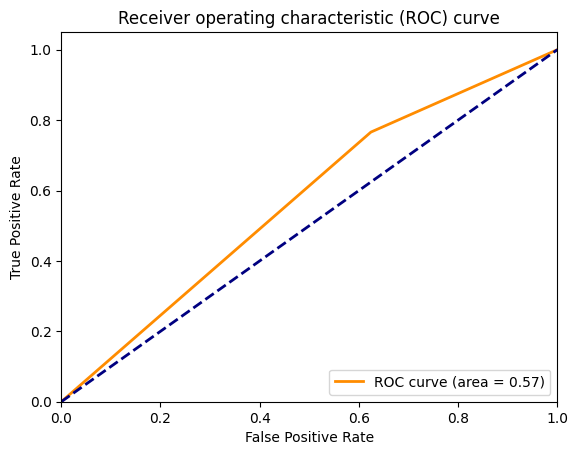

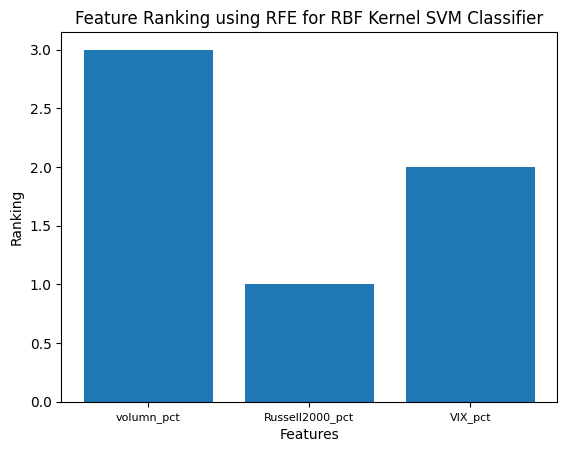

Accuracy:  0.5354107648725213 c:  0.9


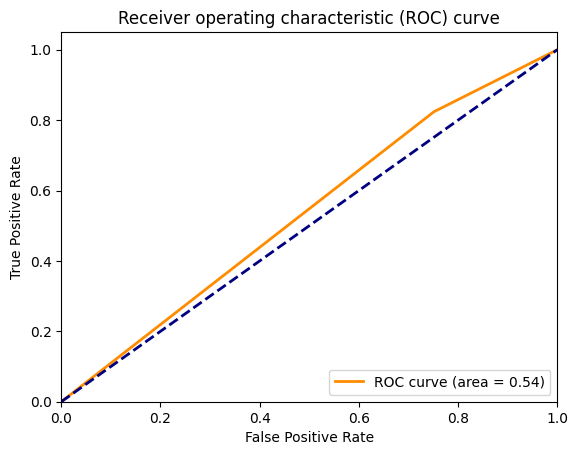

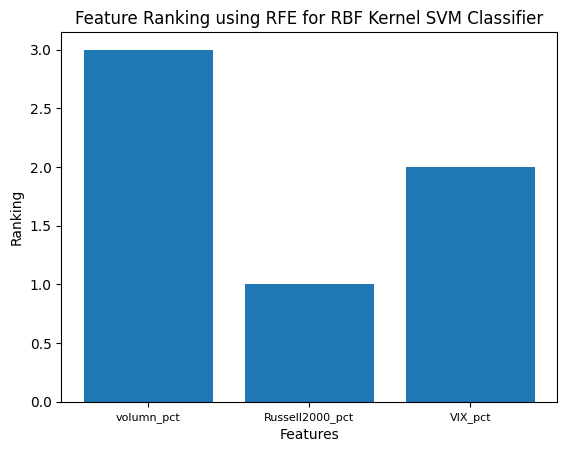

Accuracy:  0.6062322946175638 c:  1.0


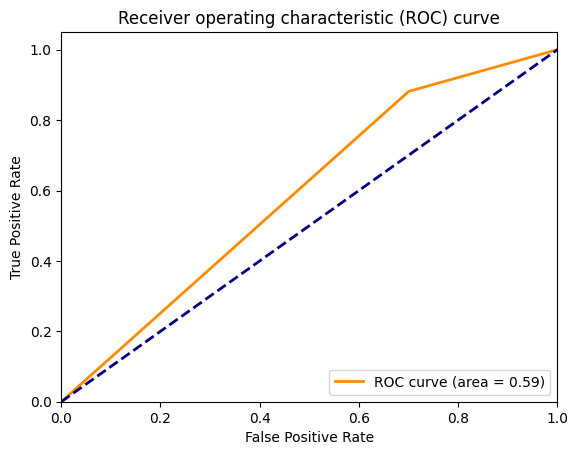

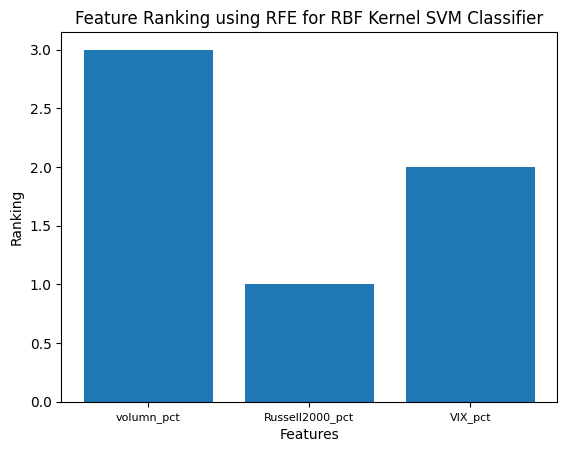

Accuracy:  0.5779036827195467 c:  1.1


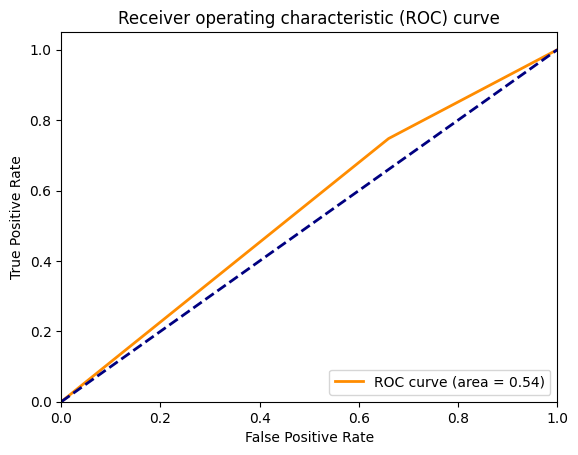

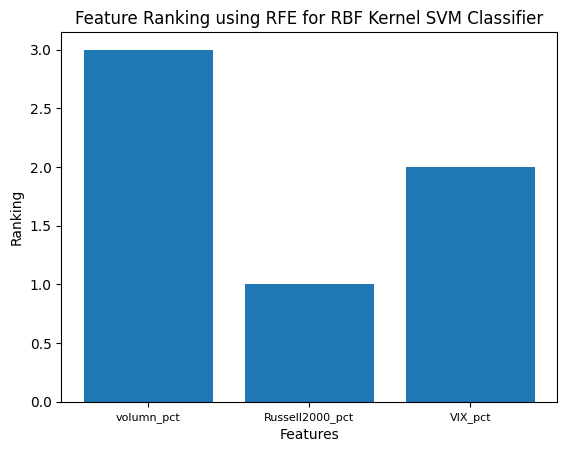

Accuracy:  0.6062322946175638 c:  1.2


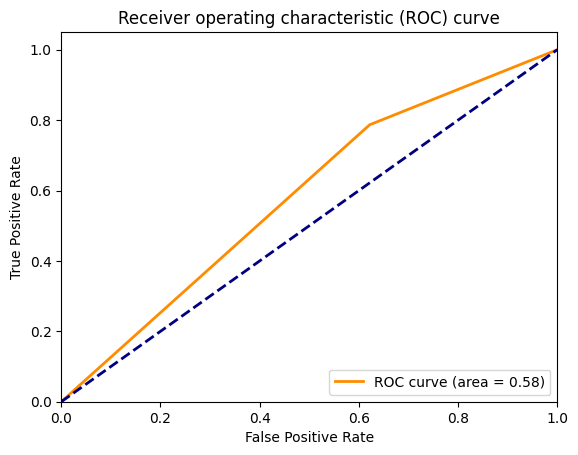

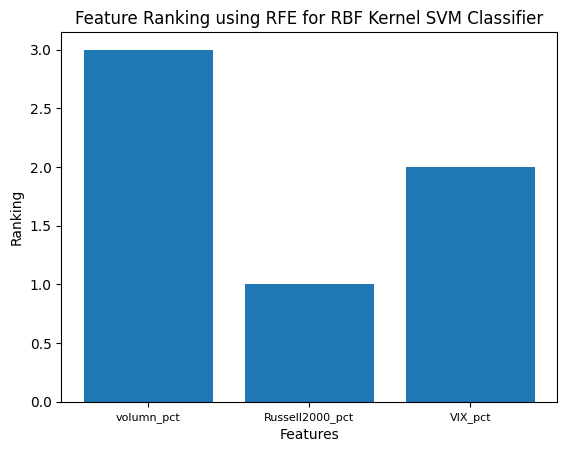

In [ ]:
for c in [0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0,1.1,1.2]:
  SVM_on_coin(df_ex_large_bdm,['volumn_pct','Russell2000_pct','VIX_pct'], c)

Accuracy:  0.5694050991501416 c:  0.2


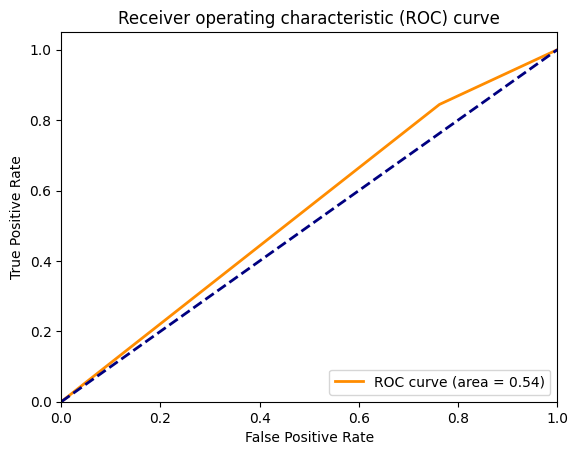

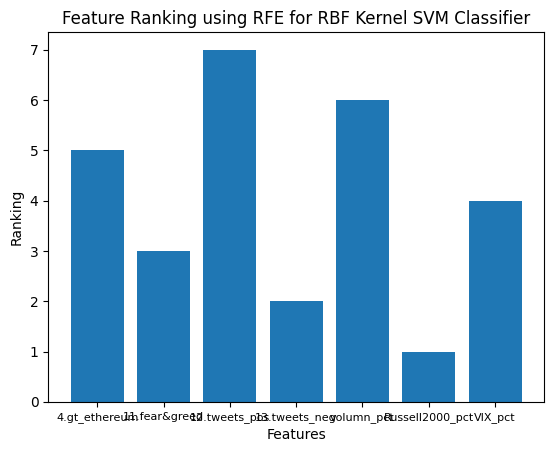

Accuracy:  0.5835694050991501 c:  0.3


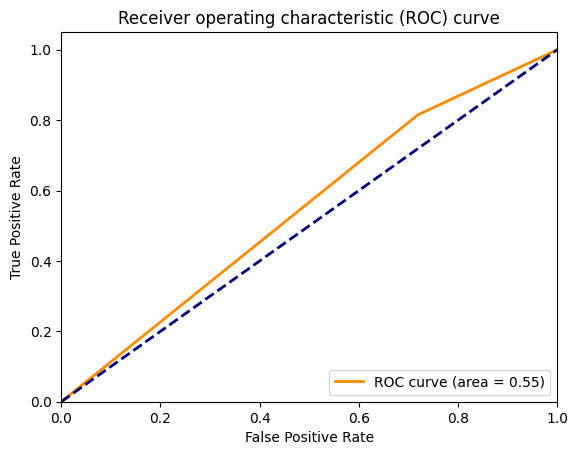

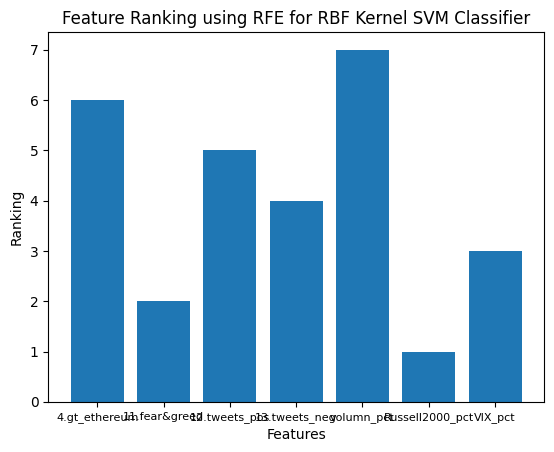

Accuracy:  0.5750708215297451 c:  0.4


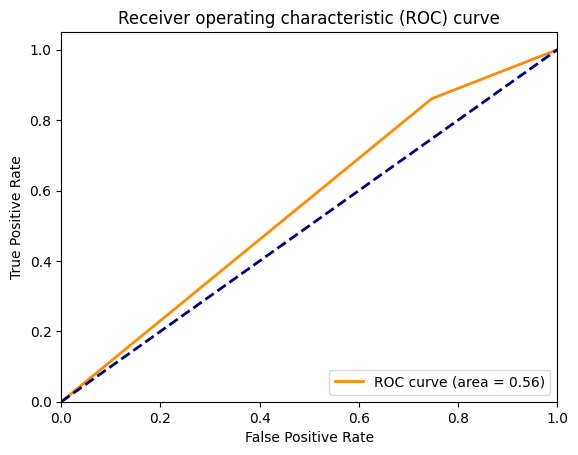

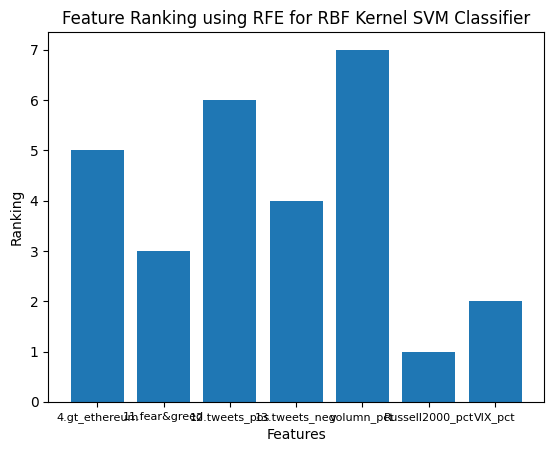

Accuracy:  0.5750708215297451 c:  0.5


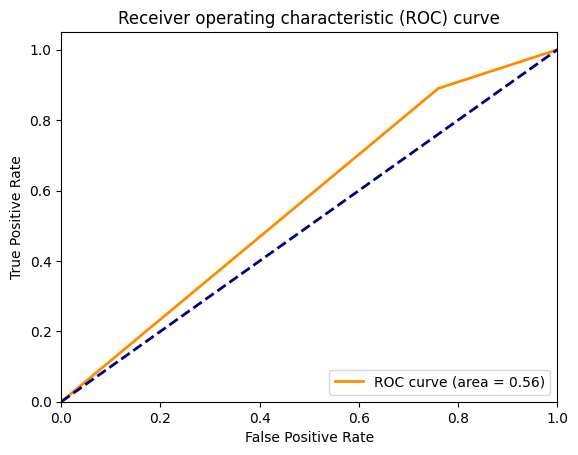

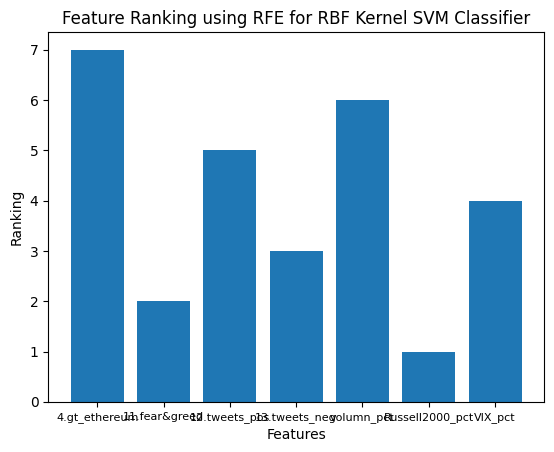

Accuracy:  0.5779036827195467 c:  0.6


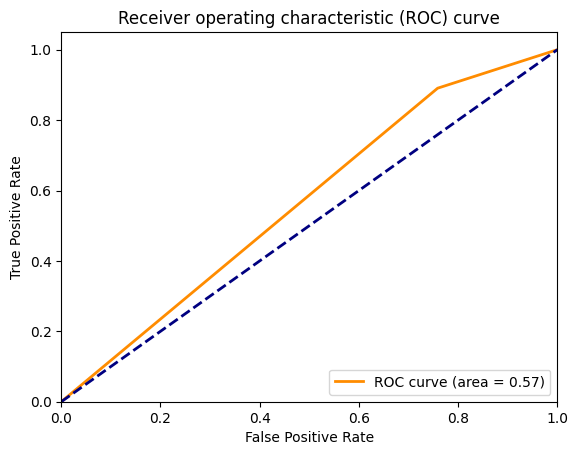

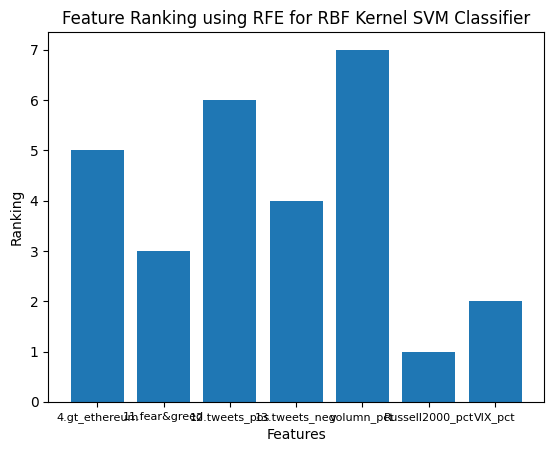

Accuracy:  0.5750708215297451 c:  0.7


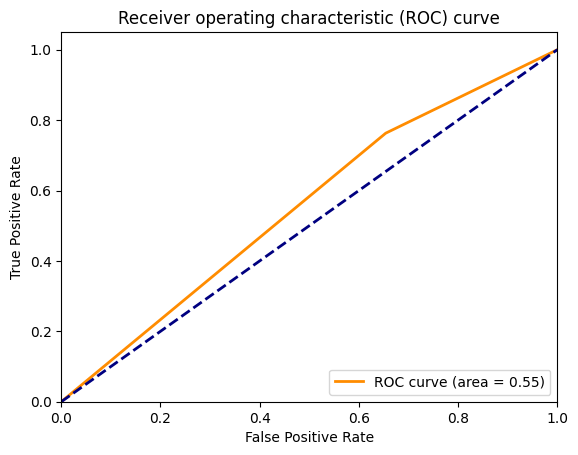

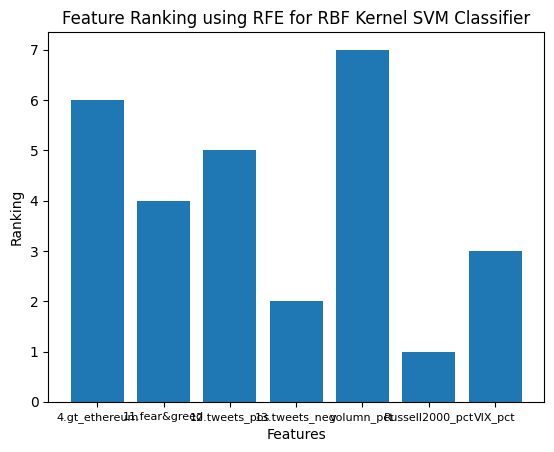

Accuracy:  0.5439093484419264 c:  0.8


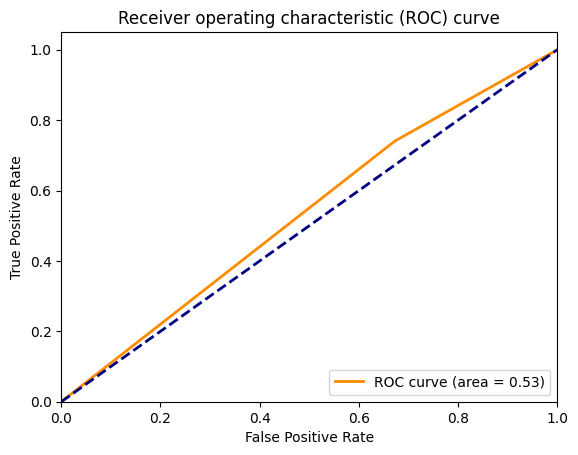

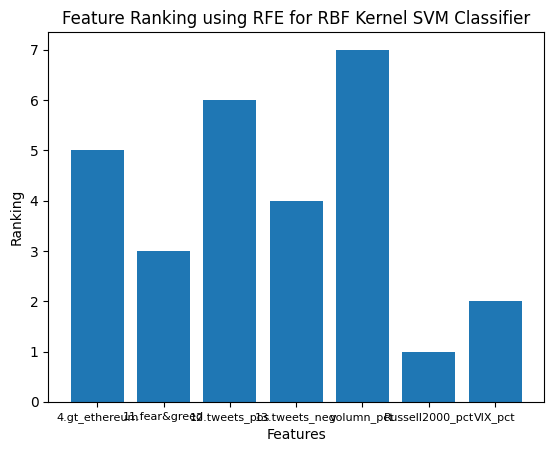

Accuracy:  0.5750708215297451 c:  0.9


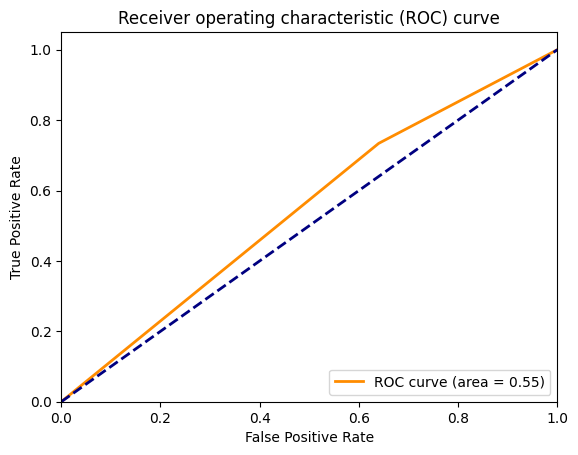

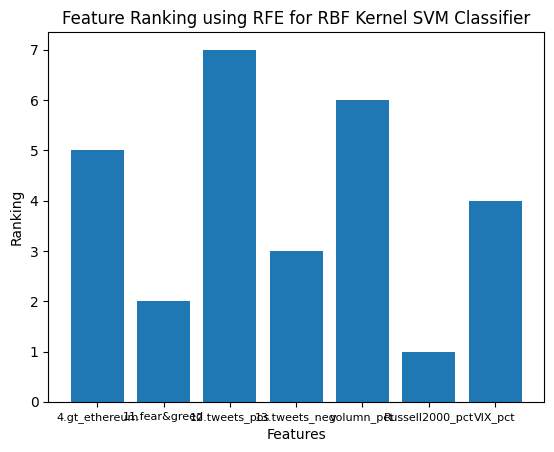

Accuracy:  0.5580736543909348 c:  1.0


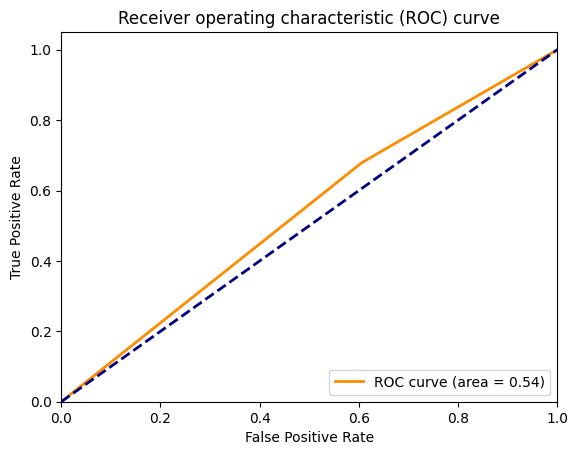

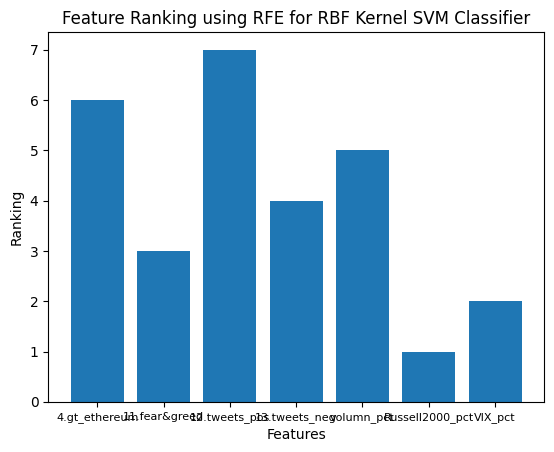

Accuracy:  0.5949008498583569 c:  1.1


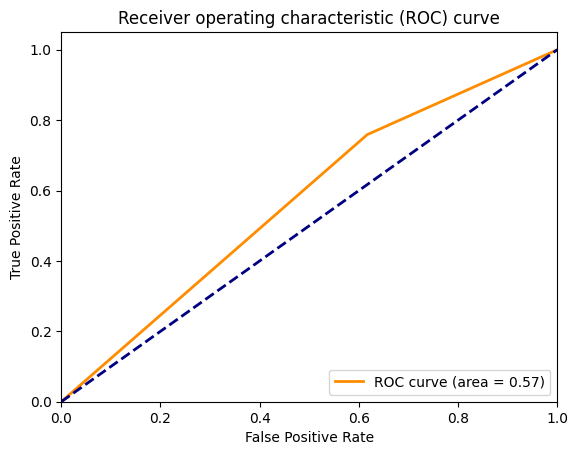

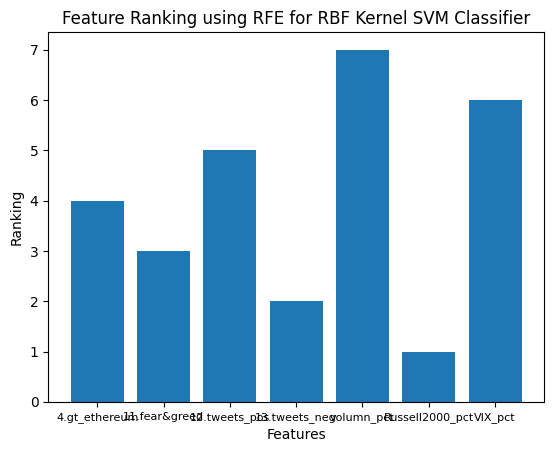

Accuracy:  0.5949008498583569 c:  1.2


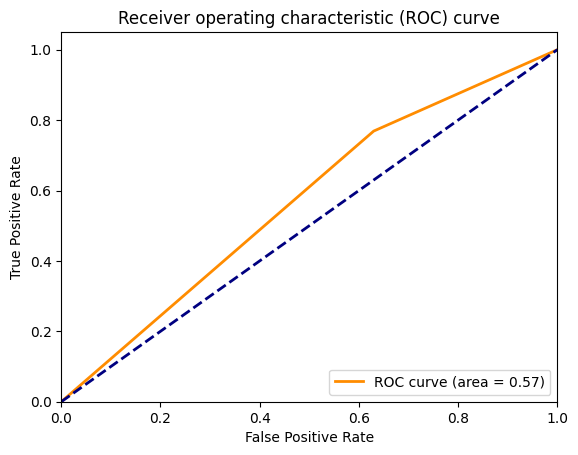

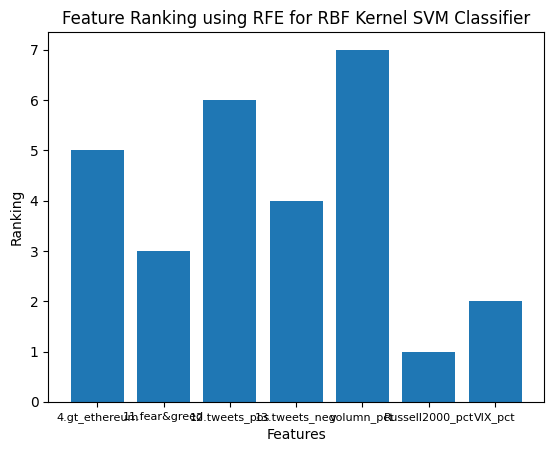

Accuracy:  0.5495750708215298 c:  1.3


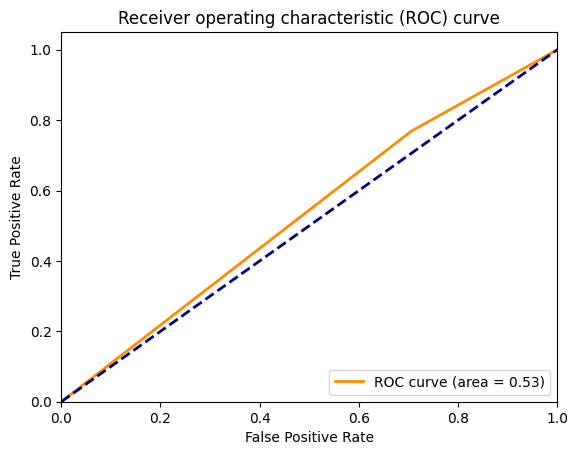

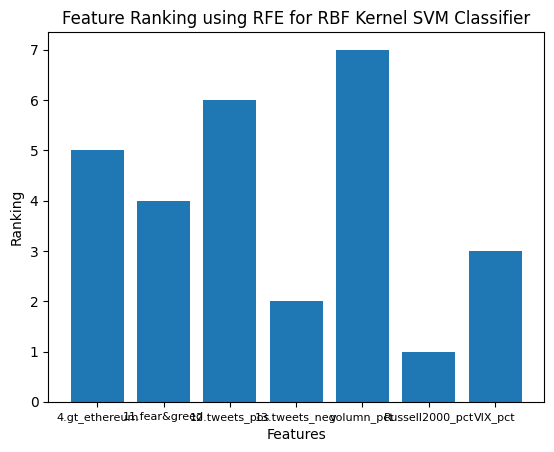

Accuracy:  0.6090651558073654 c:  1.4


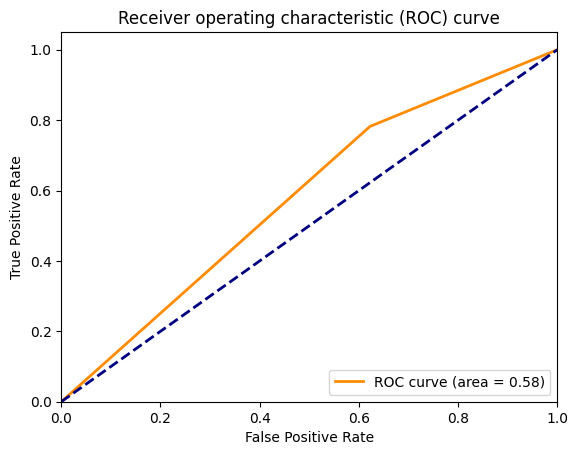

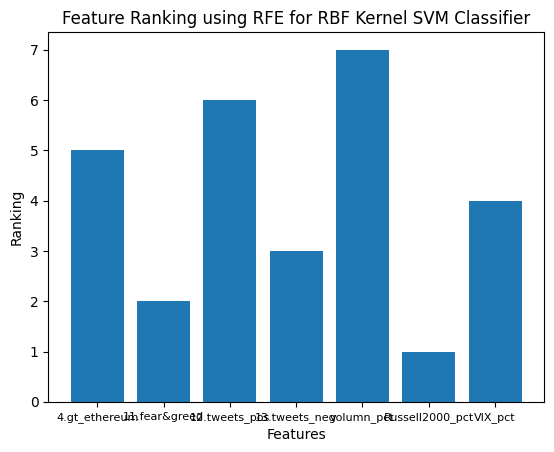

Accuracy:  0.5524079320113314 c:  1.5


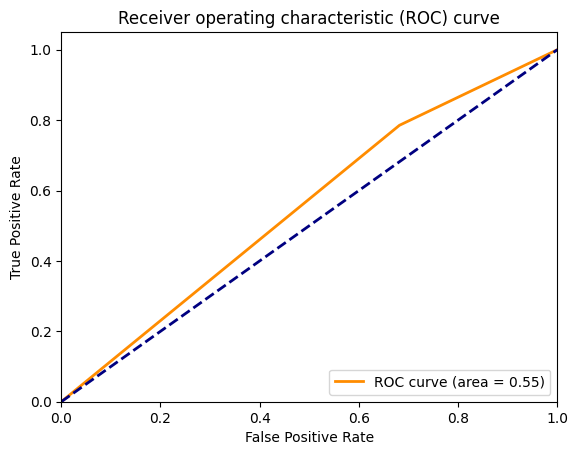

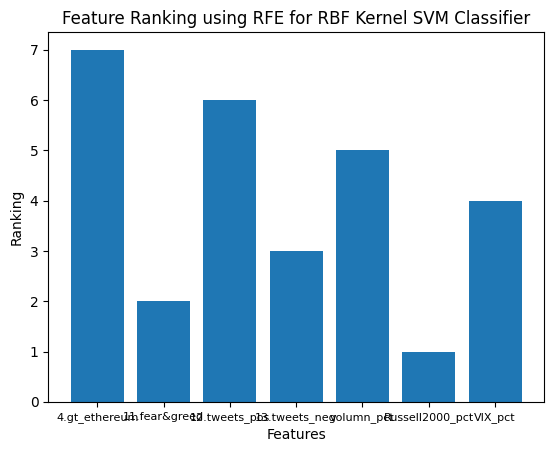

In [ ]:
ex_large_bdm_features = ['4.gt_ethereum', '11.fear&greed', '12.tweets_pos', '13.tweets_neg',]
df_ex_large_bdm, ex_large_bdm_features = create_final_df(1,ex_large_bdm_features)
df_ex_large_bdm['directionality'] = df_ex_large_bdm['directionality'].astype(int)
for c in [0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0,1.1,1.2,1.3,1.4,1.5]:
  SVM_on_coin(df_ex_large_bdm, ex_large_bdm_features, c)

Accuracy:  0.5722379603399433 c:  0.2


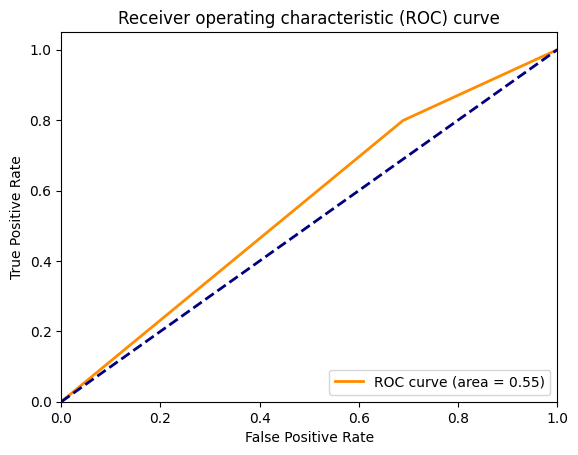

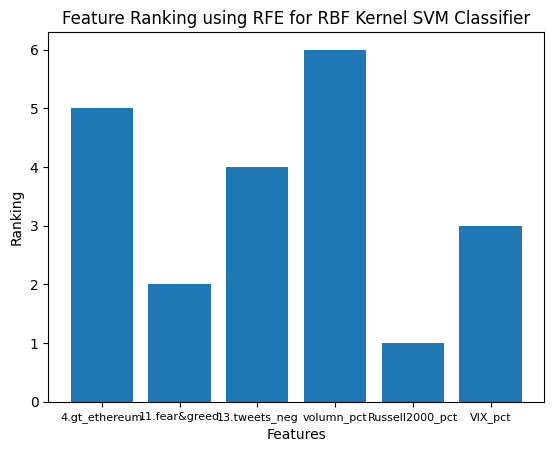

Accuracy:  0.5609065155807366 c:  0.3


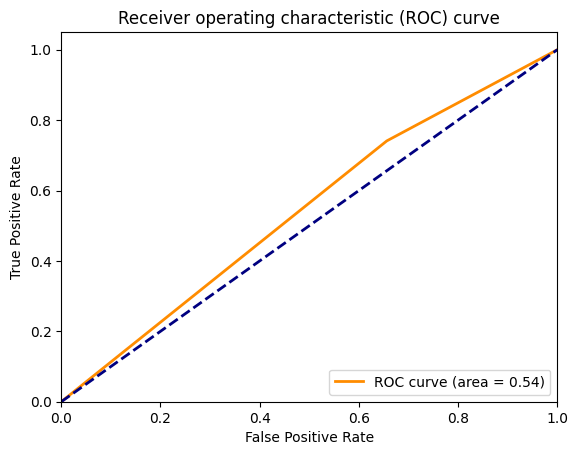

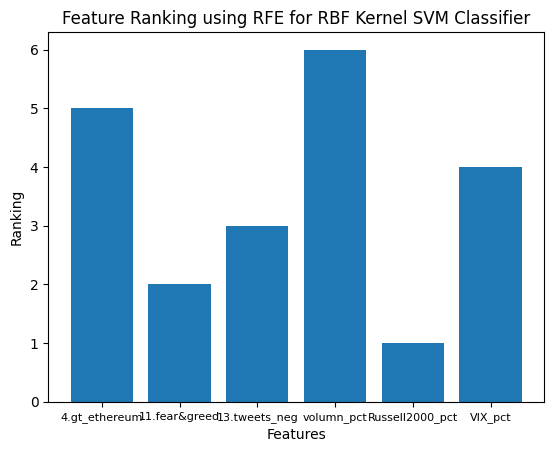

Accuracy:  0.56657223796034 c:  0.4


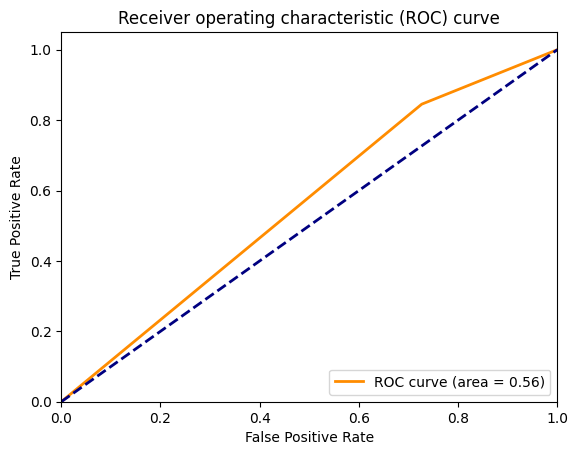

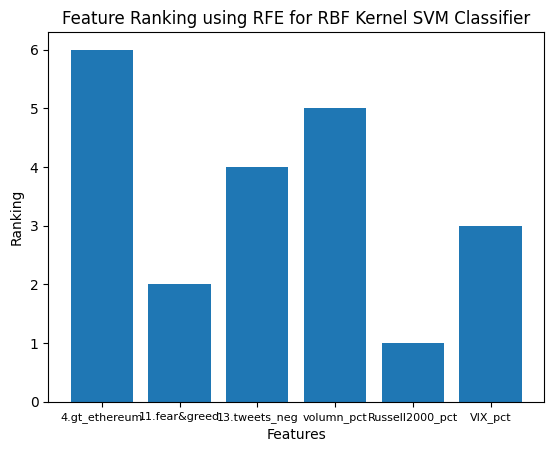

Accuracy:  0.56657223796034 c:  0.5


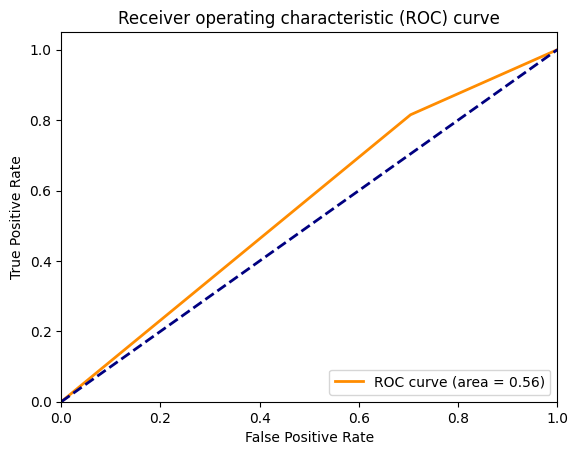

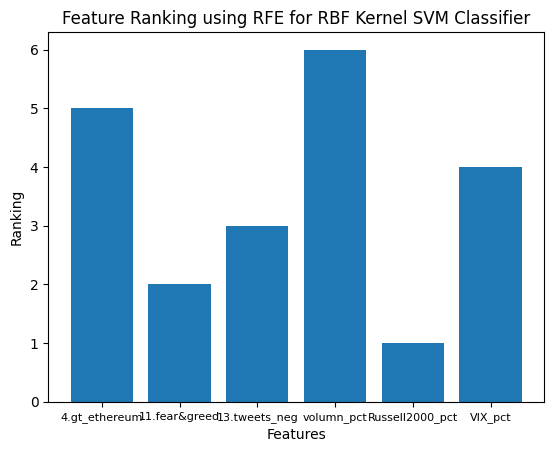

Accuracy:  0.6005665722379604 c:  0.6


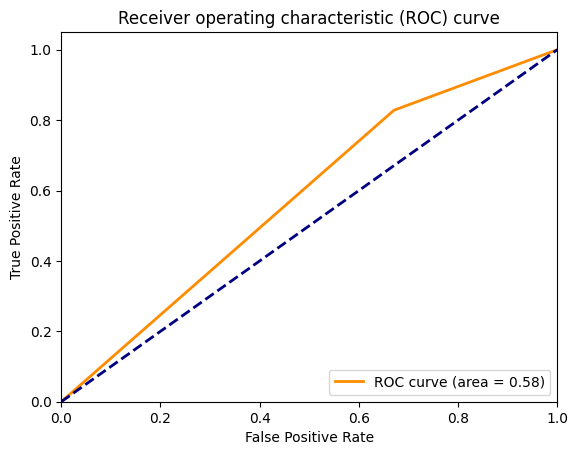

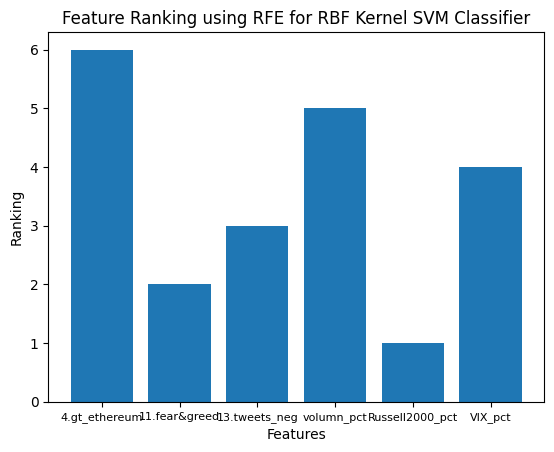

Accuracy:  0.5637393767705382 c:  0.7


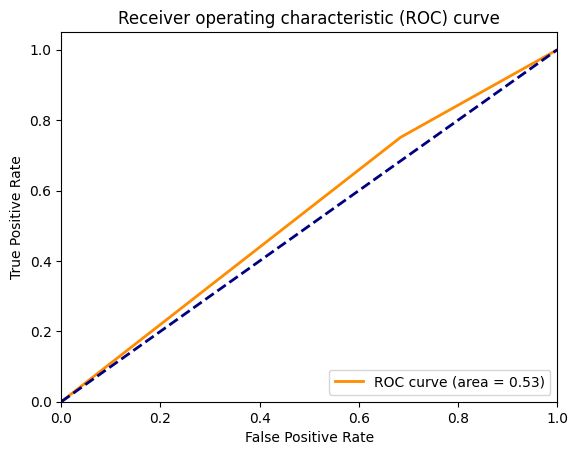

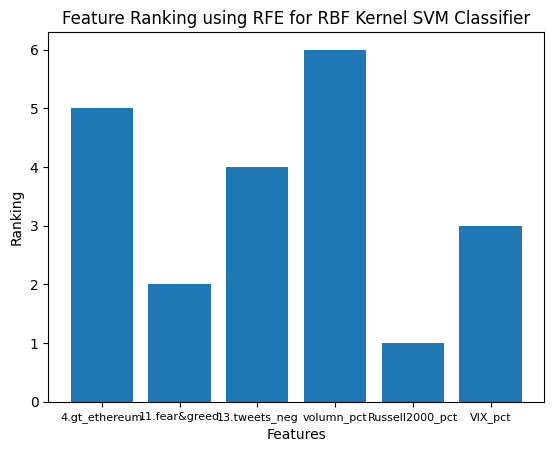

Accuracy:  0.5722379603399433 c:  0.8


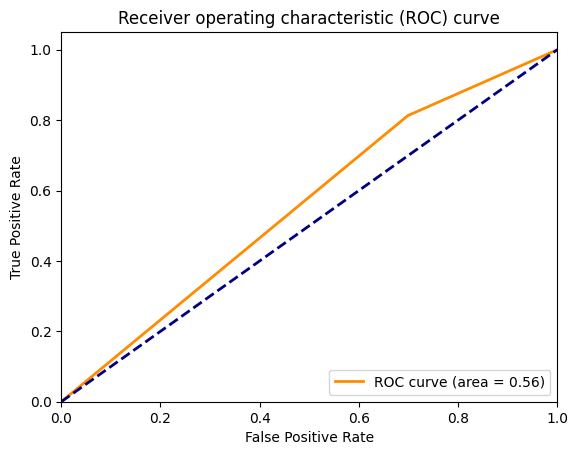

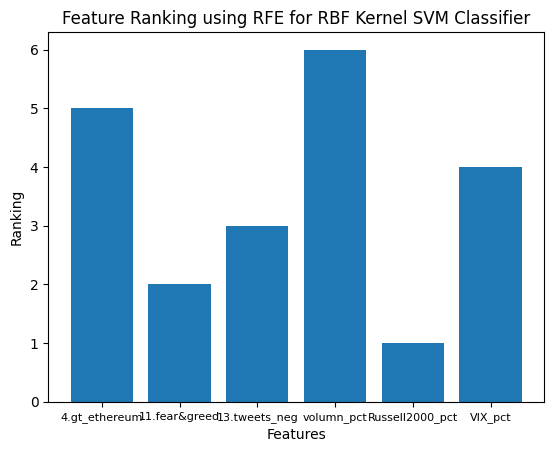

Accuracy:  0.5949008498583569 c:  0.9


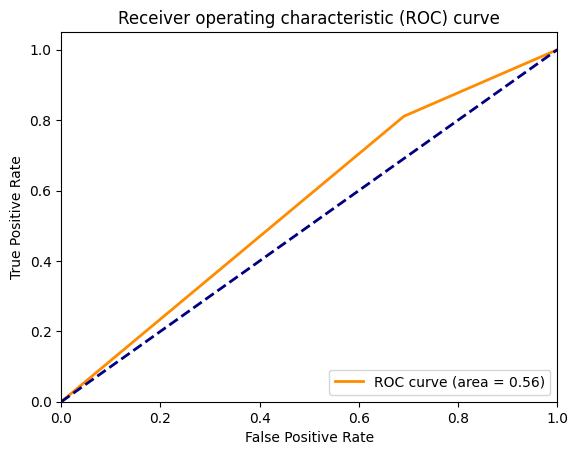

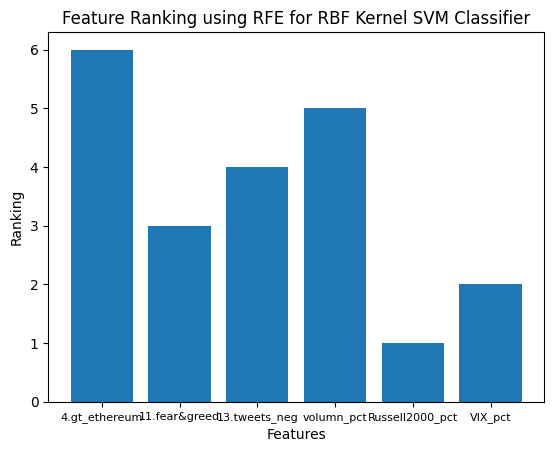

Accuracy:  0.546742209631728 c:  1.0


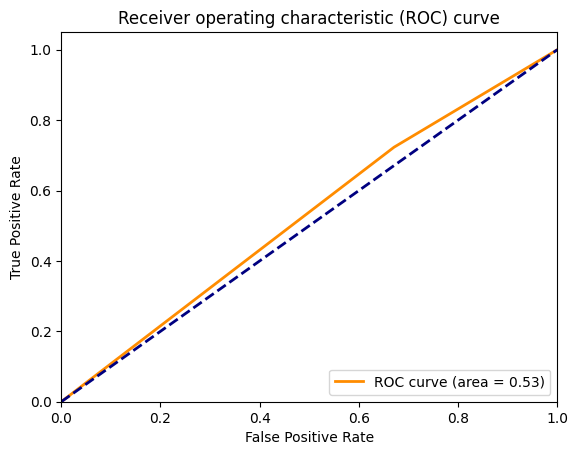

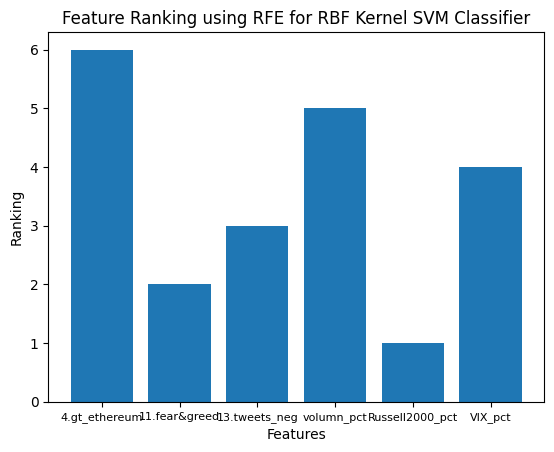

Accuracy:  0.5920679886685553 c:  1.1


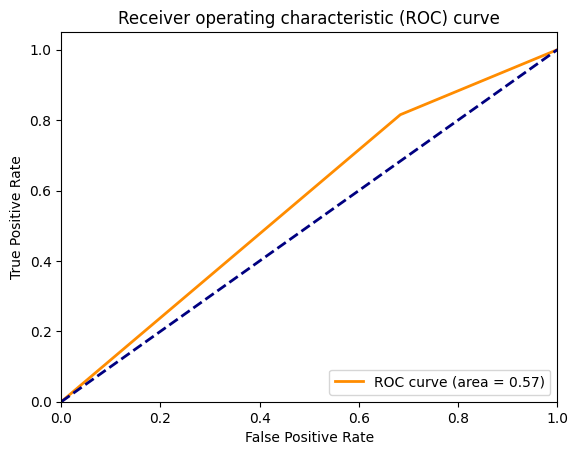

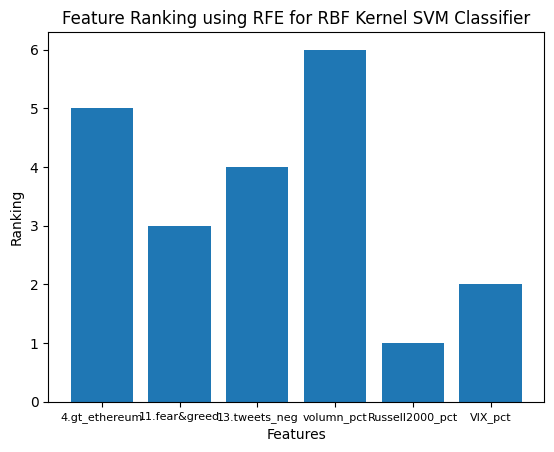

Accuracy:  0.5779036827195467 c:  1.2


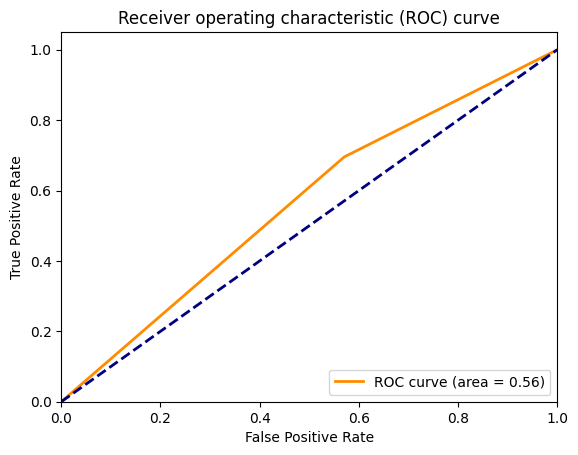

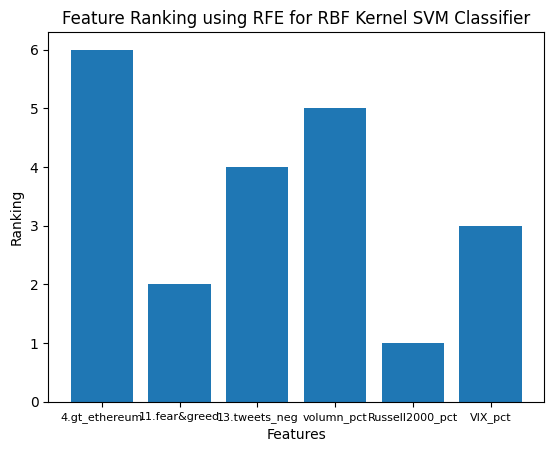

Accuracy:  0.5864022662889519 c:  1.3


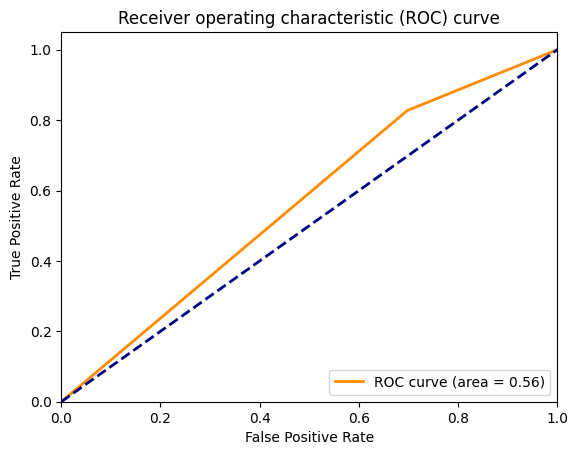

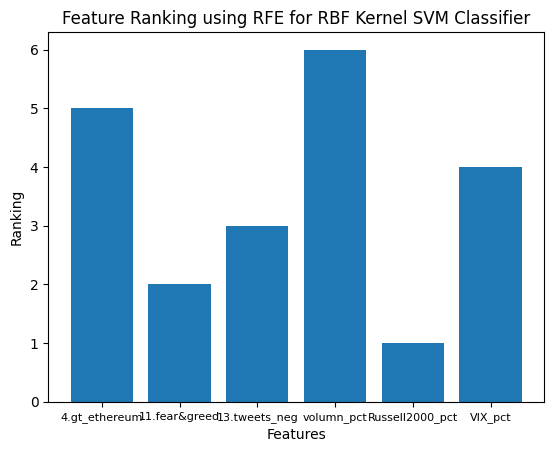

Accuracy:  0.623229461756374 c:  1.4


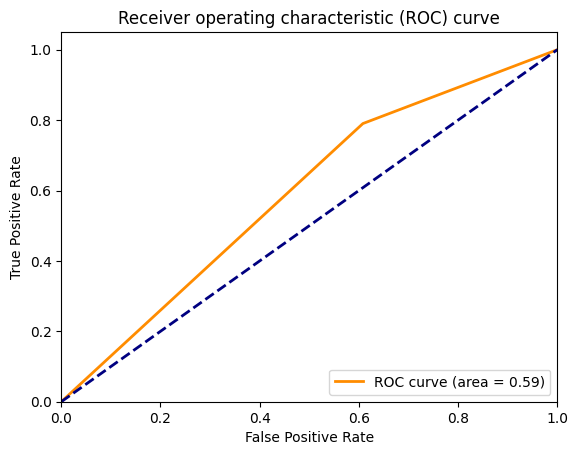

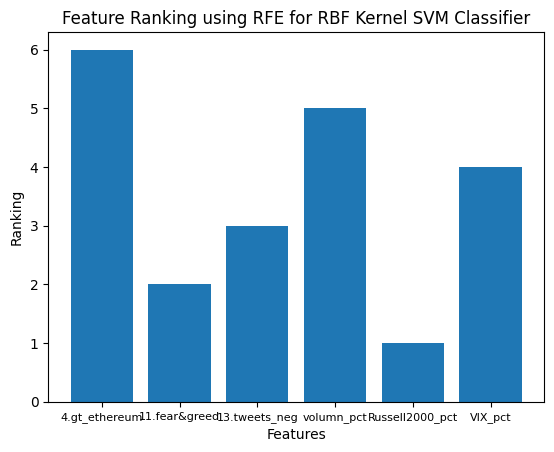

Accuracy:  0.5524079320113314 c:  1.5


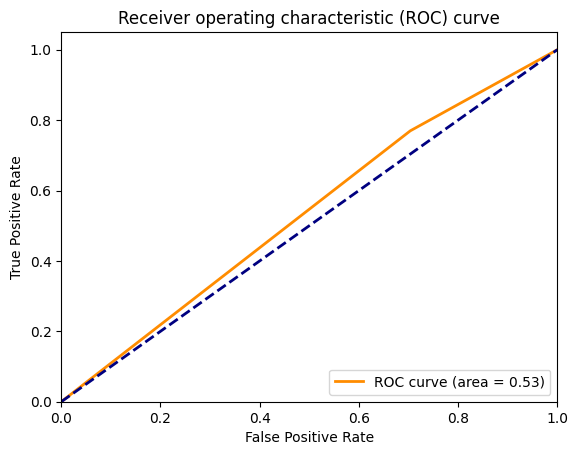

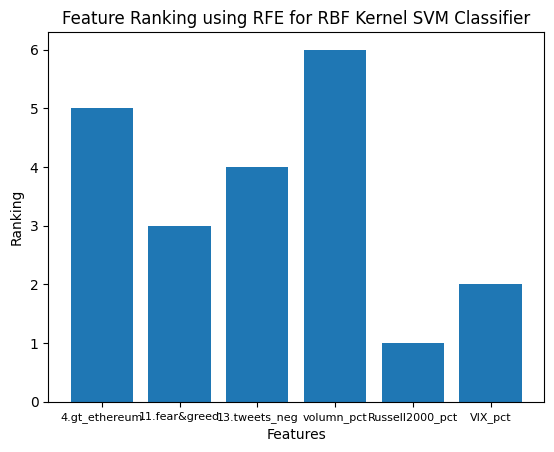

In [ ]:
ex_large_bdm_features = ['4.gt_ethereum', '11.fear&greed', '13.tweets_neg','volumn_pct','Russell2000_pct','VIX_pct' ]
for c in [0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0,1.1,1.2,1.3,1.4,1.5]:
  SVM_on_coin(df_ex_large_bdm, ex_large_bdm_features, c)